# Sea Surface Height Analysis

In [1]:
from swot_datahandler import *
from swot_datafunctions import *

# Load functions
import matplotlib.pyplot as plt
import numpy as np


In [2]:
# Settings
cycles = np.arange(556, 565+1).tolist()
print(cycles)

#cycles = np.arange(500, 577+1).tolist()

[556, 557, 558, 559, 560, 561, 562, 563, 564, 565]


In [ ]:
# Load Simulated KaRIn data
path = "D:\MasterThesis\SimulatedKaRIn\*"
simkarin = loadKarinSimulated(path, cycles=cycles, passes=[25])

In [3]:
# Load Nadir data
path = "D:\MasterThesis\SIGDR\*"
nadir20 = loadNadir20Hz(path, cycles=cycles, passes=[6,21])

In [3]:
# Load Karin 250m data
path = "D:/MasterThesis/PreBetaKaRIn_1day/unsmoothed/*"
karin250 = loadKarinL2A(path, cycles=cycles, passes=[6,21], latextent=[30, 45])

Computing custom SSH variables


In [2]:
# Load Nadir 1Hz data
cycles = np.arange(474, 578+1).tolist()
#cycles = np.arange(550, 578+1).tolist() # gauges
path = "D:\MasterThesis\SIGDR\*"
nadir1 = loadNadir1Hz(path, cycles=cycles, passes=[6,21])

In [3]:
# Load Karin 2km data
cycles = np.arange(474, 578+1).tolist()
#cycles = [499, 500, 501, 502]
#cycles = np.arange(550, 578+1).tolist() # gauges
path = "D:/MasterThesis/PreBetaKaRIn_1day/expert/*"
karin2 = loadKarinL2B(path, cycles=cycles, passes=[6,21])

Computing custom SSH variables


In [79]:
# Remove nadir passes that we lack karin from
n_list = list(nadir1.keys())
k = list(karin2.keys())
for i in range(len(list(nadir1.keys()))):
    if (n_list[i] in k) == False:
        nadir1.pop(n_list[i])

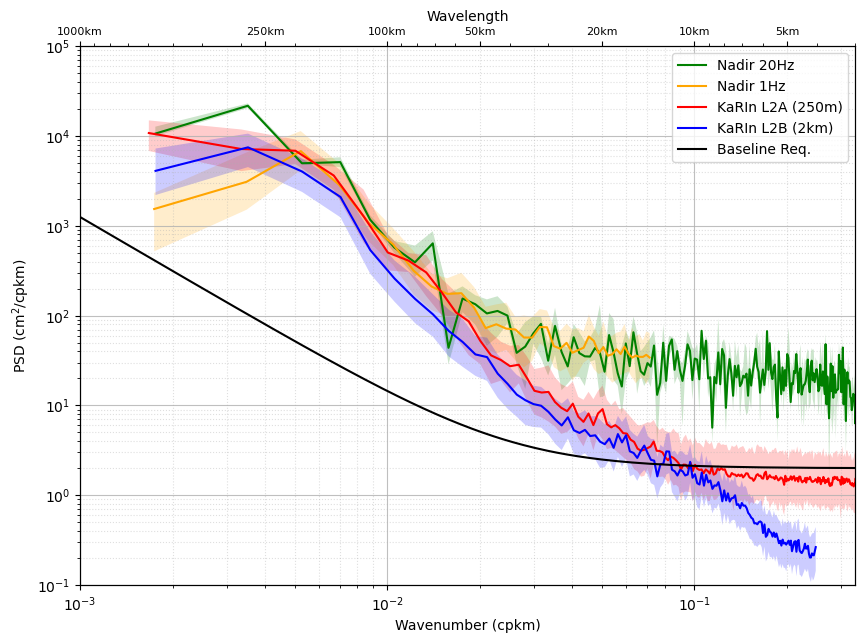

In [9]:


fig, ax = plt.subplots(figsize=(10,7))
#cycles = [560, 561]
p = 21

# KaRIn Simulated
"""
mask = np.logical_and(simkarin[cycles[0]][25]["latitude"][:,0]>36,
                      simkarin[cycles[0]][25]["latitude"][:,0]<41)
stack = np.zeros(simkarin[cycles[0]][25]["ssh_mss"][mask].shape)
for c in cycles:
    stack = np.dstack([stack, simkarin[c][25]["ssh_mss"][mask]])
stack = stack[:,:,1:]
psd, k, sd = periodogram(stack, axis=0, conf_lvl=68, tapering_f="boxcar", sampling=2000, stacked_data=True, unit="cm")
ax.loglog(k, psd, 'cyan')
ax.fill_between(k, sd[0,:], sd[1,:], color='cyan',edgecolor=None, alpha=.2,label="_nolegend_")
"""

# KaRIn Nadir 20Hz
ssh = []
for c in nadir20.keys():
    for p in nadir20[c].keys():
        mask = np.logical_and(nadir20[c][p]["latitude"]>36,
                            nadir20[c][p]["latitude"]<41)
        ssh.append(nadir20[c][p]["ssh_mss"][mask])
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=342, unit="cm")
ax.loglog(k, psd, 'green')
ax.fill_between(k, sd[0,:], sd[1,:], color='green',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn Nadir 1Hz
ssh = []
for c in nadir1.keys():
    for p in nadir1[c].keys():
        mask = np.logical_and(nadir1[c][p]["latitude"]>36,
                            nadir1[c][p]["latitude"]<41)
        ssh.append(nadir1[c][p]["ssh_mss"][mask])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")
ax.loglog(k, psd, 'orange')
ax.fill_between(k, sd[0,:], sd[1,:], color='orange',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2A
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            for i in range(karin250[c][p][s]["ssh_mss"].shape[1]):
                mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                      karin250[c][p][s]["latitude"][:,0]<41)
                ssh.append(karin250[c][p][s]["ssh_mss"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=250, unit="cm",skip_n=10)
ax.loglog(k, psd, 'r')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                              karin2[c][p]["latitude"][:,0]<41)
        for i in range(karin2[c][p]["ssh_mss"].shape[1]):
            ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k, psd, 'b')
ax.fill_between(k, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")

# Baseline
k_synth = np.arange(2, 1000.0)**(-1)
ax.plot(k_synth, (2+0.00125*(k_synth)**(-2)), "k")
# From Global Observations of Fine-Scale Ocean Surface Topography With the Surface Water and Ocean Topography (SWOT) Mission


ax.legend(["Nadir 20Hz", "Nadir 1Hz", "KaRIn L2A (250m)", "KaRIn L2B (2km)", "Baseline Req."])

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_yticks(np.logspace(-6,6,13))
ax.set_ylim([1e-1, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 3]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 250, 100, 50, 20, 10, 5]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)

plt.show()

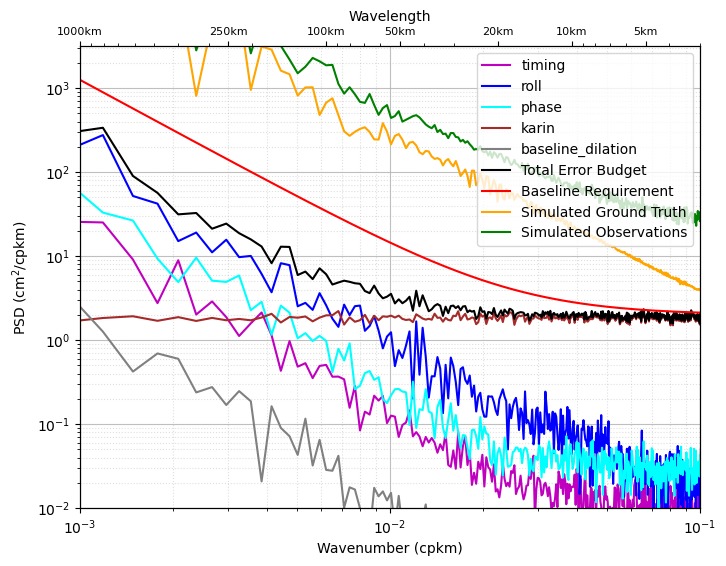

In [61]:
# Simulated errors

fig, ax = plt.subplots(figsize=(8,6))

latextent = [0, 30]
loc = 20
cols = ["m", "b", "cyan", "brown", "grey"]
keys = ["simulated_error_timing", "simulated_error_roll", "simulated_error_phase", "simulated_error_karin", "simulated_error_baseline_dilation"]

c = list(simkarin.keys())[0]
p = 25
lat_mask = np.logical_and(simkarin[c][p]["latitude"][:,loc]>latextent[0], simkarin[c][p]["latitude"][:,loc]<latextent[1])
ssh = simkarin[c][p]["simulated_error_timing"][:,loc][lat_mask]
sum_psd = np.zeros(ssh.size//2-1)

for i, k in enumerate(keys):
    
    # Determine periodogram
    mask = np.logical_and(simkarin[cycles[0]][p]["latitude"][:,0]>latextent[0],
                        simkarin[cycles[0]][p]["latitude"][:,0]<latextent[1])
    stack = np.zeros(simkarin[cycles[0]][p][k][mask].shape)
    for c in cycles:
        stack = np.dstack([stack, simkarin[c][p][k][mask]])
    stack = stack[:,:,1:]
    psd, k, sd = periodogram(stack, axis=0, conf_lvl=68, tapering_f="boxcar", sampling=2000, stacked_data=True, unit="cm")
    ax.plot(k,psd, color=cols[i])

    sum_psd += psd

ax.plot(k,sum_psd, "k")

# Baseline Reuquirement
k_synth = np.arange(10, 1000.0)**(-1)
ax.plot(k_synth, 2+0.00125*k_synth**(-2), "r")


# Real Sea Surface
mask = np.logical_and(simkarin[cycles[0]][p]["latitude"][:,0]>latextent[0],
                      simkarin[cycles[0]][p]["latitude"][:,0]<latextent[1])
stack = np.zeros(simkarin[cycles[0]][p]["simulated_true_ssh_karin"][mask].shape)
for c in cycles:
    stack = np.dstack([stack, simkarin[c][p]["simulated_true_ssh_karin"][mask]])
stack = stack[:,:,1:]
psd, k, sd = periodogram(stack, axis=0, conf_lvl=68, tapering_f="boxcar", sampling=2000, stacked_data=True, unit="cm")
ax.plot(k,psd, color="orange")

# Observed Sea Surface
mask = np.logical_and(simkarin[cycles[0]][p]["latitude"][:,0]>latextent[0],
                      simkarin[cycles[0]][p]["latitude"][:,0]<latextent[1])
stack = np.zeros(simkarin[cycles[0]][p]["ssh_karin"][mask].shape)
for c in cycles:
    stack = np.dstack([stack, simkarin[c][p]["ssh_karin"][mask]])
stack = stack[:,:,1:]
psd, k, sd = periodogram(stack, axis=0, conf_lvl=68, tapering_f="boxcar", sampling=2000, stacked_data=True, unit="cm")
ax.plot(k,psd, color="green")

keys = ["{}".format(k[16:]) for k in keys]
keys.append("Total Error Budget")
keys.append("Baseline Requirement")
keys.append("Simulated Ground Truth")
keys.append("Simulated Observations")

ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_xlim([1e-3, 1e-1])
ax.set_ylim([1e-2, 10**(3.5)])

plt.legend(keys, loc="upper right")
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 250, 100, 50, 20, 10, 5]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)

plt.show()

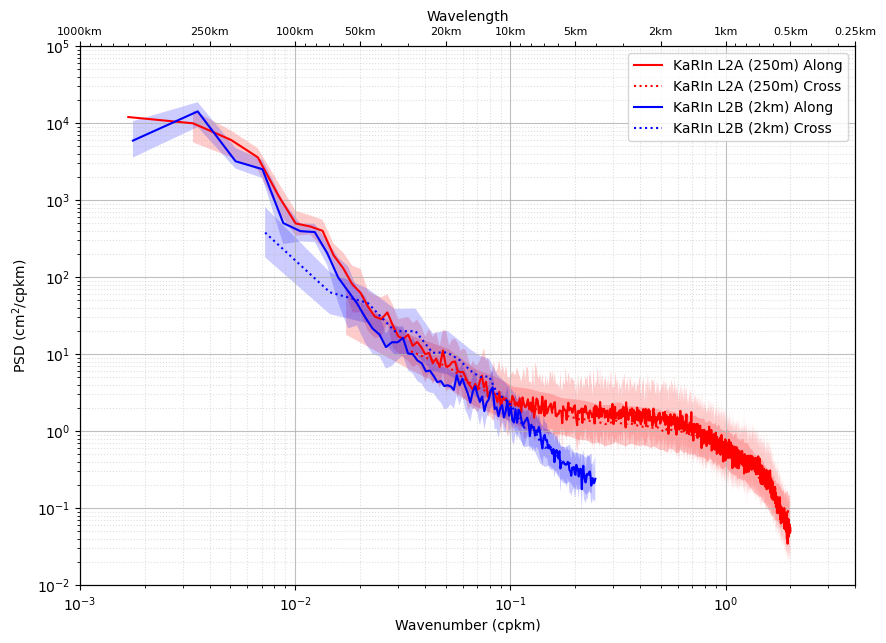

In [14]:


fig, ax = plt.subplots(figsize=(10,7))
#cycles = [560, 561]
p = 21

# KaRIn L2A
ssh_cross = []
ssh_along = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():

            mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                karin250[c][p][s]["latitude"][:,0]<41)
            for i in range(0,karin250[c][p][s]["ssh_mss"][mask].shape[0],20):
                ssh_cross.append(karin250[c][p][s]["ssh_mss"][mask][i,:])
                
            for i in range(0,karin250[c][p][s]["ssh_mss"][mask].shape[1],20):
                mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                    karin250[c][p][s]["latitude"][:,0]<41)
                ssh_along.append(karin250[c][p][s]["ssh_mss"][mask][:,i])
                
psd, k, sd = periodogram_list(ssh_along, conf_lvl=68, tapering_f="tukey", tapering=10, sampling=250, unit="cm")
ax.loglog(k, psd, 'r')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")
psd, k, sd = periodogram_list(ssh_cross, conf_lvl=68, tapering_f="tukey", tapering=10, sampling=250, unit="cm")
ax.loglog(k[1:], psd[1:], 'r:')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")


# KaRIn L2B
mask = np.logical_and(karin2[cycles[0]][p]["latitude"][:,0]>36,
                      karin2[cycles[0]][p]["latitude"][:,0]<41)
ssh_along = []
ssh_cross = []
for c in karin2.keys():
    for p in karin2[c].keys():
        for i in range(karin2[c][p]["ssh_mss"][mask].shape[1]):
            ssh_along.append(karin2[c][p]["ssh_mss"][mask][:,i])
        for i in range(karin2[c][p]["ssh_mss"][mask].shape[0]):
            ssh_cross.append(karin2[c][p]["ssh_mss"][mask][i,:])
psd, k, sd = periodogram_list(ssh_along, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k, psd, 'b')
ax.fill_between(k, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")

psd, k, sd = periodogram_list(ssh_cross, conf_lvl=68, tapering_f="tukey", tapering=10, sampling=2000, unit="cm")
ax.loglog(k, psd, 'b:')
ax.fill_between(k, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")


ax.legend(["KaRIn L2A (250m) Along", "KaRIn L2A (250m) Cross", 
           "KaRIn L2B (2km) Along", "KaRIn L2B (2km) Cross"])

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_yticks(np.logspace(-6,6,13))
ax.set_ylim([1e-2, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 0.25]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 250, 100, 50, 20, 10, 5, 2, 1, 0.5, 0.25]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)

plt.show()

In [10]:
def haversine_dist(lat1, lon1, lat2, lon2):
    # Distance between coordinates using the haversine equation
    # Approximates the earth as a sphere
    R = 6373.0

    lat1 = np.deg2rad(lat1)
    lon1 = np.deg2rad(lon1)
    lat2 = np.deg2rad(lat2)
    lon2 = np.deg2rad(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c
    
    return distance

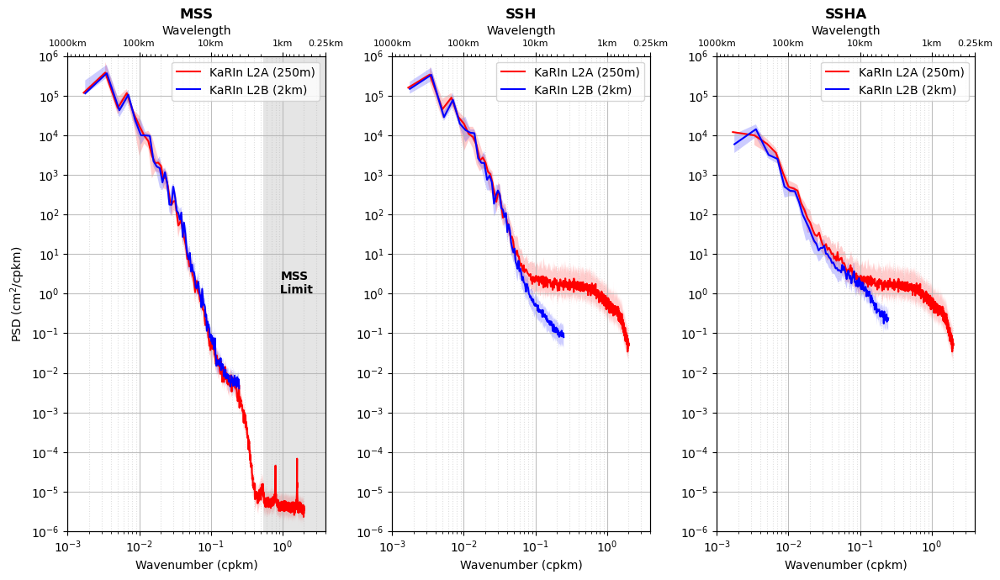

In [21]:


fig = plt.figure(figsize=(12,7))

ax = fig.add_subplot(1,3,1)
#cycles = [560, 561]
p = 21

# KaRIn L2A
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                  karin250[c][p][s]["latitude"][:,0]<41)
            for i in range(0,karin250[c][p][s]["latitude"][mask].shape[1],20):
                ssh.append(karin250[c][p][s]["mean_sea_surface_cnescls"][mask][:,i])
                
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", tapering=10, sampling=250, unit="cm")
ax.loglog(k, psd, 'r')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                      karin2[c][p]["latitude"][:,0]<41)
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["mean_sea_surface_cnescls"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k, psd, 'b')
ax.fill_between(k, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")

def_mss_lim = haversine_dist(karin2[c][p]["latitude"][0,0], karin2[c][p]["longitude"][0,0], karin2[c][p]["latitude"][0,0]+1/60, karin2[c][p]["longitude"][0,0])
ax.fill_between(np.array([def_mss_lim, 0.25])**(-1), np.ones(2)*1e-10, np.ones(2)*1e10, color='gray',edgecolor=None, alpha=.2,label="_nolegend_")
ax.text((10**(np.log10(np.array([def_mss_lim, 0.25])).mean()))**(-1), 1e0, "MSS\n Limit", fontweight="bold", horizontalalignment='center')

ax.legend(["KaRIn L2A (250m)", 
           "KaRIn L2B (2km)"])

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_yticks(np.logspace(-6,8,15))
ax.set_ylim([1e-6, 1e6])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 0.25]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 100, 10, 1, 0.25]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)
ax.set_title("MSS", fontweight="bold")


ax = fig.add_subplot(1,3,2)
#cycles = [560, 561]
p = 21

# KaRIn L2A
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                  karin250[c][p][s]["latitude"][:,0]<41)
            for i in range(0,karin250[c][p][s]["latitude"][mask].shape[1],20):
                ssh.append(karin250[c][p][s]["ssh_ellip"][mask][:,i])
                
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", tapering=10, sampling=250, unit="cm")
ax.loglog(k, psd, 'r')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                      karin2[c][p]["latitude"][:,0]<41)
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["ssh_ellip"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k, psd, 'b')
ax.fill_between(k, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")


ax.legend(["KaRIn L2A (250m)", 
           "KaRIn L2B (2km)"])

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_yticks(np.logspace(-6,8,15))
ax.set_ylim([1e-6, 1e6])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 0.25]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 100, 10, 1, 0.25]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)
ax.set_title("SSH", fontweight="bold")


ax = fig.add_subplot(1,3,3)
#cycles = [560, 561]
p = 21

# KaRIn L2A
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                  karin250[c][p][s]["latitude"][:,0]<41)
            for i in range(0,karin250[c][p][s]["latitude"][mask].shape[1],20):
                ssh.append(karin250[c][p][s]["ssh_mss"][mask][:,i])
                
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", tapering=10, sampling=250, unit="cm")
ax.loglog(k, psd, 'r')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                      karin2[c][p]["latitude"][:,0]<41)
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k, psd, 'b')
ax.fill_between(k, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")

ax.legend(["KaRIn L2A (250m)", 
           "KaRIn L2B (2km)"])

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_yticks(np.logspace(-6,8,15))
ax.set_ylim([1e-6, 1e6])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 0.25]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 100, 10, 1, 0.25]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)
ax.set_title("SSHA", fontweight="bold")


plt.tight_layout()
plt.show()

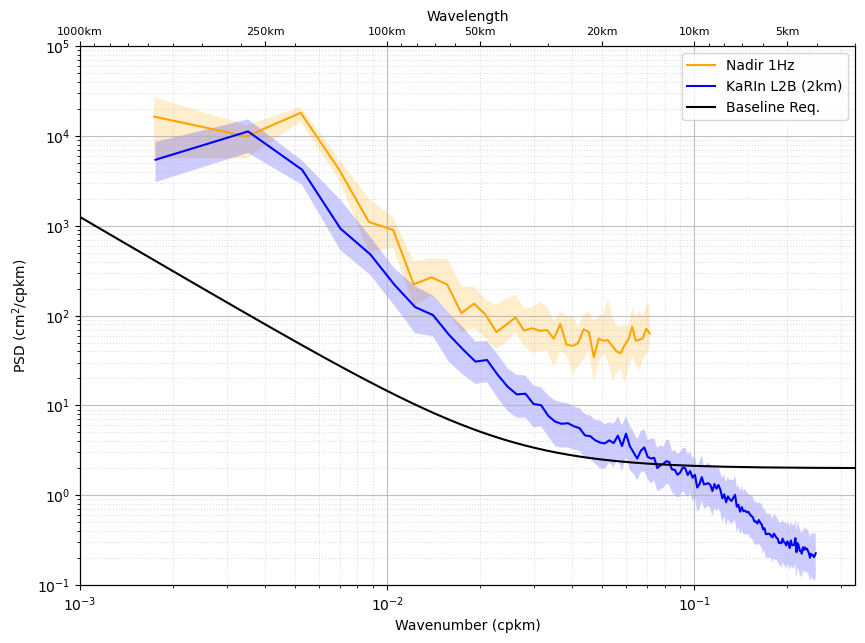

In [11]:


fig, ax = plt.subplots(figsize=(10,7))
#cycles = [560, 561]
p = 21


# KaRIn Nadir 1Hz
c = list(nadir1.keys())[0]
p = list(nadir1[c].keys())[0]
ssh = []
for c in nadir1.keys():
    for p in nadir1[c].keys():
        mask = np.logical_and(nadir1[c][p]["latitude"]>36,
                                nadir1[c][p]["latitude"]<41)
        ssh.append(nadir1[c][p]["ssh_mss"][mask])
ssh.sort(key=len, reverse=True)
psd_nadir1, k_nadir1, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")
ax.loglog(k_nadir1, psd_nadir1, 'orange')
ax.fill_between(k_nadir1, sd[0,:], sd[1,:], color='orange',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                              karin2[c][p]["latitude"][:,0]<41)
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
ssh.sort(key=len, reverse=True)
psd_karin2, k_karin2, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k_karin2, psd_karin2, 'b')
ax.fill_between(k_karin2, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")

# Baseline
k_synth = np.arange(2, 1000.0)**(-1)
ax.plot(k_synth, (2+0.00125*(k_synth)**(-2)), "k")
# From Global Observations of Fine-Scale Ocean Surface Topography With the Surface Water and Ocean Topography (SWOT) Mission


ax.legend(["Nadir 1Hz", "KaRIn L2B (2km)", "Baseline Req."])

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_yticks(np.logspace(-6,6,13))
ax.set_ylim([1e-1, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 3]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 250, 100, 50, 20, 10, 5]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)

plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_16040\220654831.py:30: RuntimeWarning: Mean of empty slice
  y = np.nanmean(ssh,axis=0)


Data from p21: 2023-04-26 11:18:32.363989
Data from p6: 2023-04-25 22:09:28.894358


C:\Users\bjark\AppData\Local\Temp\ipykernel_16040\220654831.py:30: RuntimeWarning: Mean of empty slice
  y = np.nanmean(ssh,axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_16040\220654831.py:79: RuntimeWarning: Mean of empty slice
  y = np.nanmean(ssh,axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_16040\220654831.py:79: RuntimeWarning: Mean of empty slice
  y = np.nanmean(ssh,axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_16040\220654831.py:127: RuntimeWarning: Mean of empty slice
  y = np.nanmean(ssh,axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_16040\220654831.py:127: RuntimeWarning: Mean of empty slice
  y = np.nanmean(ssh,axis=0)


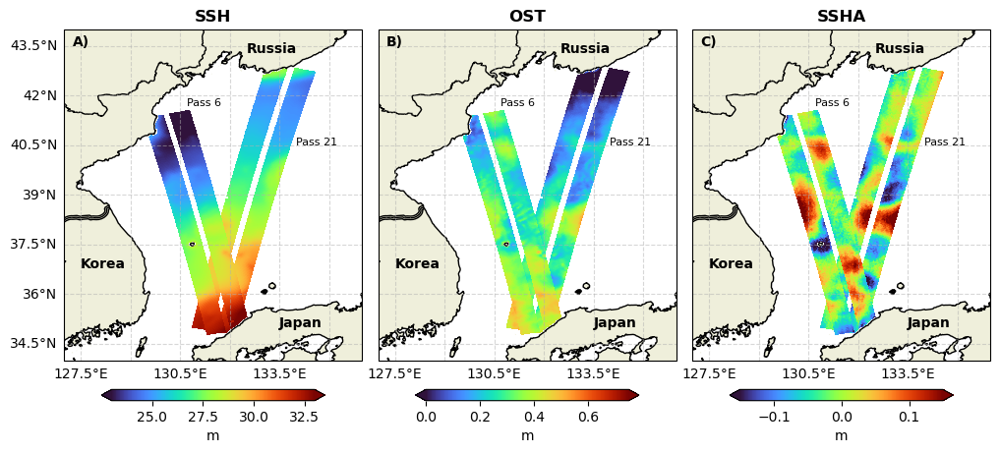

In [3]:
AOI = [128, 135, 35, 43]

c = 502#list(karin2.keys())[0]
detrend = True

fig = plt.figure(figsize=(10,6))

ax = fig.add_subplot(1,3,1, projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = karin2[c][p]["ssh_ellip"][mask]
    # Detrend
    if detrend == True:
        #ssh_mean = np.nanmean(ssh)
        #nanmask = np.isnan(ssh)
        #ssh[nanmask] = ssh_mean
        #ssh = scipy.signal.detrend(ssh,axis=0)
        #ssh[nanmask] = np.nan
        #ssh += ssh_mean

        x = np.arange(ssh.shape[1])
        y = np.nanmean(ssh,axis=0)
        y_mean = np.nanmean(y)
        not_nan_ind = ~np.isnan(y)
        m, b, r_val, p_val, std_err = scipy.stats.linregress(x[not_nan_ind],y[not_nan_ind]-y_mean)
        detrend_y = y - (m*x + b)
        ssh = ssh - (m*x + b)
    sc=ax.pcolormesh(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask], ssh, cmap="turbo", vmin=23, vmax=33)
    print("Data from p{}: {}".format(p,datetime.datetime(2000,1,1)+datetime.timedelta(seconds=np.nanmean(karin2[c][p]["time"][mask]))))

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.75, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "A)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSH", fontweight="bold")


ax = fig.add_subplot(1,3,2, projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = karin2[c][p]["ssh_geoid"][mask]
    # Detrend
    if detrend == True:
        #ssh_mean = np.nanmean(ssh)
        #nanmask = np.isnan(ssh)
        #ssh[nanmask] = ssh_mean
        #ssh = scipy.signal.detrend(ssh,axis=0)
        #ssh[nanmask] = np.nan
        #ssh += ssh_mean

        x = np.arange(ssh.shape[1])
        y = np.nanmean(ssh,axis=0)
        y_mean = np.nanmean(y)
        not_nan_ind = ~np.isnan(y)
        m, b, r_val, p_val, std_err = scipy.stats.linregress(x[not_nan_ind],y[not_nan_ind]-y_mean)
        detrend_y = y - (m*x + b)
        ssh = ssh - (m*x + b)
    sc=ax.pcolormesh(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask], ssh, cmap="turbo", vmin=0, vmax=0.75)

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.75, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "B)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST", fontweight="bold")


ax = fig.add_subplot(1,3,3, projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = karin2[c][p]["ssh_mss"][mask]
    # Detrend
    if detrend == True:
        #ssh_mean = np.nanmean(ssh)
        #nanmask = np.isnan(ssh)
        #ssh[nanmask] = ssh_mean
        #ssh = scipy.signal.detrend(ssh,axis=0)
        #ssh[nanmask] = np.nan
        #ssh += ssh_mean

        x = np.arange(ssh.shape[1])
        y = np.nanmean(ssh,axis=0)
        y_mean = np.nanmean(y)
        not_nan_ind = ~np.isnan(y)
        m, b, r_val, p_val, std_err = scipy.stats.linregress(x[not_nan_ind],y[not_nan_ind]-y_mean)
        detrend_y = y - (m*x + b)
        ssh = ssh - (m*x + b)
    sc=ax.pcolormesh(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask],ssh, cmap="turbo", vmin=-0.15, vmax=0.15)

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.75, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "C)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSHA", fontweight="bold")

plt.tight_layout(pad=0.1)
plt.show()


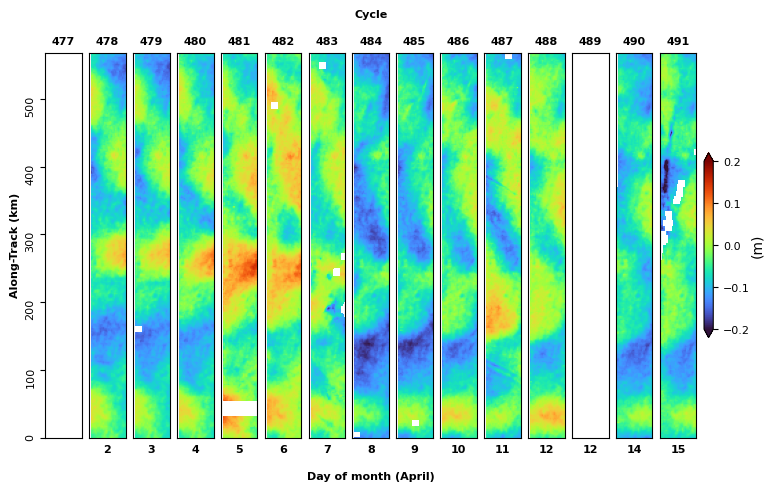

In [620]:
AOI = [128, 135, 36, 41]

c = 477#507#538#477#list(karin2.keys())[0]
p_here = 21
detrend = True

fig = plt.figure(figsize=(10,6))

N = 15
for i in range(N):
    ax = fig.add_subplot(1,N,i+1)

    # KaRIn
    ax.set_title("{}".format(c), fontweight="bold", fontsize=8)
    
    mask = np.logical_and(karin2[500][p_here]["latitude"][:,0]>AOI[2], karin2[500][p_here]["latitude"][:,0]<AOI[3])
    array_shape = karin2[500][p_here]["latitude"][mask][:,3:30].shape
    X = np.zeros(array_shape)
    X[:] = np.nan
    ax.imshow(X, extent=[0, array_shape[1]*2, 0, array_shape[0]*2], vmin=-0.25, vmax=0.25)
    ax.set_xticks([])
    if i > 0:
        ax.set_yticks([])
    else:
        ax.set_ylabel("Along-Track (km)", fontsize=8, fontweight="bold")
        ax.tick_params(axis='y', labelsize=8, labelrotation=90)

    if (c in list(karin2.keys())) == False:
        c += 1
        continue
    for p in karin2[c].keys():
        if p != p_here:
            continue
        mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
        # Get time
        time = karin2[c][p]["time"][mask]
        time[time>1e15] = np.nan
        time = np.nanmean(time)
        if np.isnan(np.nanmean(time)):
            date = np.nan
        else:
            date = datetime.datetime(2000,1,1)+datetime.timedelta(seconds=time)
        ssh = karin2[c][p]["ssh_mss"][mask]
        # Detrend
        if detrend == True:
            ssh_mean = np.nanmean(ssh)
            nanmask = np.isnan(ssh)
            ssh[nanmask] = 0
            ssh = scipy.signal.detrend(ssh,axis=0)
            ssh[nanmask] = np.nan
            ssh += ssh_mean

            #x = np.arange(ssh.shape[1])
            #y = np.nanmean(ssh,axis=0)
            #y_mean = np.nanmean(y)
            #not_nan_ind = ~np.isnan(y)
            #if not_nan_ind.sum()==0:
            #    continue
            #m, b, r_val, p_val, std_err = scipy.stats.linregress(x[not_nan_ind],y[not_nan_ind]-y_mean)
            #detrend_y = y - (m*x + b)
            #ssh = ssh - (m*x + b)
        # Plot
        sc=ax.imshow(ssh[:,3:30], cmap="turbo", vmin=-0.2, vmax=0.2)
        #print("Data from p{}: {}".format(p,datetime.datetime(2000,1,1)+datetime.timedelta(seconds=np.nanmean(karin2[c][p]["time"][mask]))))

    try:
        ax.text(0.5, -0.03, '{}'.format(date.day), fontweight="bold", fontsize=8, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
    except:
        []
    c += 1

axes = fig.get_axes()
axes[len(axes)//2].text(0.5, 1.1, "Cycle", fontweight="bold", fontsize=8, horizontalalignment='center', verticalalignment='center', transform=axes[len(axes)//2].transAxes)
axes[len(axes)//2].text(0.5, -0.1, "Day of month (April)", fontweight="bold", fontsize=8, horizontalalignment='center', verticalalignment='center', transform=axes[len(axes)//2].transAxes)

cbar = fig.colorbar(sc, ax=axes, orientation="vertical", shrink=0.4, pad=0.01, extend="both")
cbar.set_label('(m)', labelpad=0, rotation=90)
cbar.ax.tick_params(labelsize=8)

#plt.tight_layout(pad=0.1)
plt.show()


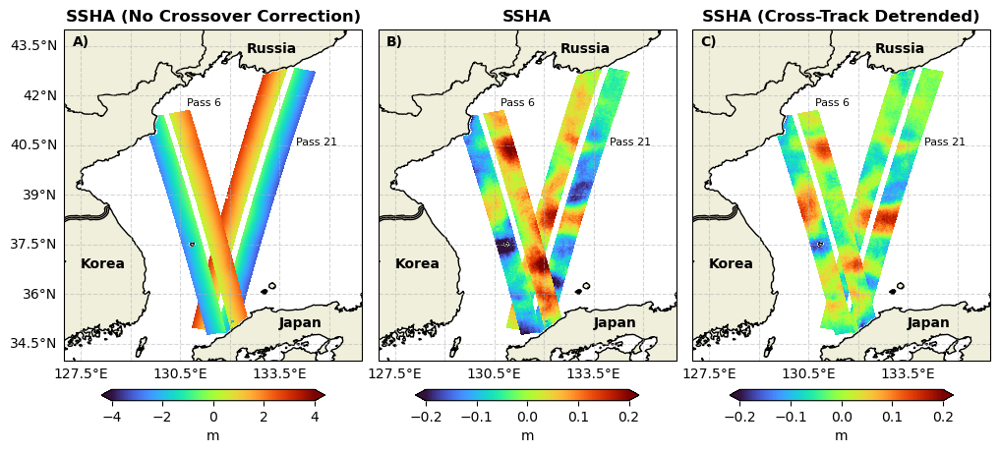

In [733]:
AOI = [128, 135, 35, 43]

c = 502#list(karin2.keys())[0]

fig = plt.figure(figsize=(10,6))

ax = fig.add_subplot(1,3,1, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = karin2[c][p]["ssh_mss"][mask] + karin2[c][p]["height_cor_xover"][mask]
    # Detrend
    if detrend == True:
        x = np.arange(ssh.shape[1])
        y = np.nanmean(ssh,axis=0)
        y_mean = np.nanmean(y)
        not_nan_ind = ~np.isnan(y)
        m, b, r_val, p_val, std_err = scipy.stats.linregress(x[not_nan_ind],y[not_nan_ind]-y_mean)
        detrend_y = y - (m*x + b)
        ssh = ssh - (m*x + b)
    sc=ax.pcolormesh(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask], ssh, cmap="turbo", vmin=-4, vmax=4)

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.75, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "A)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSHA (No Crossover Correction)", fontweight="bold")


ax = fig.add_subplot(1,3,2, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = karin2[c][p]["ssh_mss"][mask]
    # Detrend
    if detrend == True:
        x = np.arange(ssh.shape[1])
        y = np.nanmean(ssh,axis=0)
        y_mean = np.nanmean(y)
        not_nan_ind = ~np.isnan(y)
        m, b, r_val, p_val, std_err = scipy.stats.linregress(x[not_nan_ind],y[not_nan_ind]-y_mean)
        detrend_y = y - (m*x + b)
        ssh = ssh - (m*x + b)
    sc=ax.pcolormesh(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask], ssh, cmap="turbo", vmin=-0.2, vmax=0.2)

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.75, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "B)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSHA", fontweight="bold")


ax = fig.add_subplot(1,3,3, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = karin2[c][p]["ssh_mss"][mask]
    # Detrend
    if detrend == True:
        ssh_mean = np.nanmean(ssh)
        nanmask = np.isnan(ssh)
        ssh[nanmask] = ssh_mean
        ssh = scipy.signal.detrend(ssh,axis=0)
        ssh[nanmask] = np.nan
        ssh += ssh_mean
    sc=ax.pcolormesh(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask], ssh, cmap="turbo", vmin=-0.2, vmax=0.2)

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.75, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "C)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSHA (Cross-Track Detrended)", fontweight="bold")

plt.tight_layout(pad=0.1)
plt.show()


c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\function_base.py:4823: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


Cycle 500
rms: 257.25 cm
Cycle 501
rms: 271.69 cm
Cycle 502
rms: 278.39 cm
Cycle 503
rms: 280.24 cm
All
rms: 272.04 cm


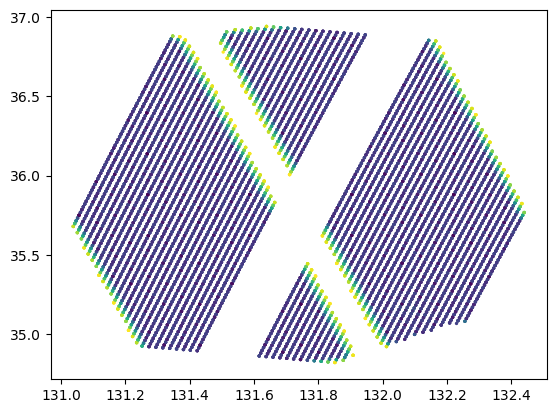

In [747]:
# Interpolate SSH to determine crossover error
AOI = [130.5, 133, 35, 37]
detrend = False
use_xover_corr = False

# For kriging
import pykrige.kriging_tools as kt
from pykrige.ok import OrdinaryKriging

#diffs = np.array([])
c = 502
# ===========================================================
p = 6
mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
points6 = np.c_[karin2[c][p]["longitude"][mask].reshape(-1), karin2[c][p]["latitude"][mask].reshape(-1)]
ssh = karin2[c][p]["ssh_mss"][mask]
# Remove xover_corr
if use_xover_corr == False:
    ssh -= karin2[c][p]["height_cor_xover"][mask]
# Detrend
if detrend == True:
    ssh_mean = np.nanmean(ssh)
    nanmask = np.isnan(ssh)
    ssh[nanmask] = ssh_mean
    ssh = scipy.signal.detrend(ssh,axis=0)
    ssh[nanmask] = np.nan
    ssh += ssh_mean
values6 = ssh.reshape(-1)

# Remove NaNs
mask = ~np.isnan(values6)
points6 = points6[mask,:]
values6 = values6[mask]

interp = OrdinaryKriging(points6[:,0],
                        points6[:,1],
                        values6,
                        variogram_model="spherical", #variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},
                        verbose=False,
                        enable_plotting=False)

# ========================
p = 21
mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
points21 = np.c_[karin2[c][p]["longitude"][mask].reshape(-1), karin2[c][p]["latitude"][mask].reshape(-1)]
ssh = karin2[c][p]["ssh_mss"][mask]
# Remove xover_corr
if use_xover_corr == False:
    ssh -= karin2[c][p]["height_cor_xover"][mask]
# Detrend
if detrend == True:
    ssh_mean = np.nanmean(ssh)
    nanmask = np.isnan(ssh)
    ssh[nanmask] = ssh_mean
    ssh = scipy.signal.detrend(ssh,axis=0)
    ssh[nanmask] = np.nan
    ssh += ssh_mean
values21 = ssh.reshape(-1)

# Remove NaNs
mask = ~np.isnan(karin2[c][p]["ssh_mss"][mask].reshape(-1))
points21 = points21[mask,:]
values21 = values21[mask]

values6_intrp, values6_intrp_var = interp.execute("points", points21[:,0], points21[:,1])#, backend="C", n_closest_points = 100)

# ========================
variance_mask = values6_intrp_var<np.percentile(values6_intrp_var, 75)
plt.scatter(points21[variance_mask,0], points21[variance_mask,1],2, values6_intrp_var[variance_mask])
#plt.scatter(points6[:,0], points6[:,1],2, values6)
#plt.colorbar()

# ========================
difference = values21[variance_mask] - values6_intrp[variance_mask]
#diffs = np.r_[diffs, difference]
rms = np.sqrt( np.mean( difference**2 ) ) * 100
print("Cycle {}".format(c))
print("rms: {:.2f} cm".format(rms))

#diffs = np.array(diffs).reshape(-1)
#rms = np.sqrt( np.mean( diffs**2 ) ) * 100
#print("All")
#print("rms: {:.2f} cm".format(rms))

## Spectral Slopes and Noise Levels

In [6]:
# Sentinel-6
# Note for S6a: What is intermission bias?
EXTERNAL_DATA_PATH = "D:\MasterThesis\S6Anrt\.*"

all_files = glob.glob(EXTERNAL_DATA_PATH)

# Only use the first n
#all_files = all_files[:100]


# Initialize dict
file = nc.Dataset(all_files[0], "r")
s6a = {}
for c in range(len(all_files)):
    s6a[c] = {}
    for k in file.variables.keys():
        s6a[c][k] = np.array([])

for c, filename in enumerate(all_files):
    print("File {}/{}".format(c+1, len(all_files)),end="\r")

    file = nc.Dataset(filename, "r")

    # Extract elements
    lon = file["longitude"][:] # convert 0 360 to -180 180
    lat = file["latitude"][:]
    lon[lon>180] -= 360
    mask = np.logical_and(lat > 36, lat < 41)
    mask = np.logical_and(mask, lon > 130)
    mask = np.logical_and(mask, lon < 135)
    mask = np.logical_and(mask, file["validation_flag"][:] == 0)

    if mask.sum() == 0:
        s6a.pop(c)
        continue

    for k in file.variables.keys():
        s6a[c][k] = np.r_[s6a[c][k], np.ma.getdata(file.variables[k][mask])]

In [7]:
# Sentinel-3
# Note for S6a: What is intermission bias?
EXTERNAL_DATA_PATH = "D:\MasterThesis\Sentinel-3A\.*"

all_files = glob.glob(EXTERNAL_DATA_PATH)

# Only use the first n
#all_files = all_files[:100]


# Initialize dict
file = nc.Dataset(all_files[0], "r")
s3a = {}
for c in range(len(all_files)):
    s3a[c] = {}
    for k in file.variables.keys():
        s3a[c][k] = np.array([])

for c, filename in enumerate(all_files):
    print("File {}/{}".format(c+1, len(all_files)),end="\r")

    file = nc.Dataset(filename, "r")

    # Extract elements
    lon = file["longitude"][:] # convert 0 360 to -180 180
    lat = file["latitude"][:]
    lon[lon>180] -= 360
    mask = np.logical_and(lat > 36, lat < 41)
    mask = np.logical_and(mask, lon > 130)
    mask = np.logical_and(mask, lon < 135)
    mask = np.logical_and(mask, file["validation_flag"][:] == 0)

    if mask.sum() == 0:
        s3a.pop(c)
        continue

    for k in file.variables.keys():
        s3a[c][k] = np.r_[s3a[c][k], np.ma.getdata(file.variables[k][mask])]

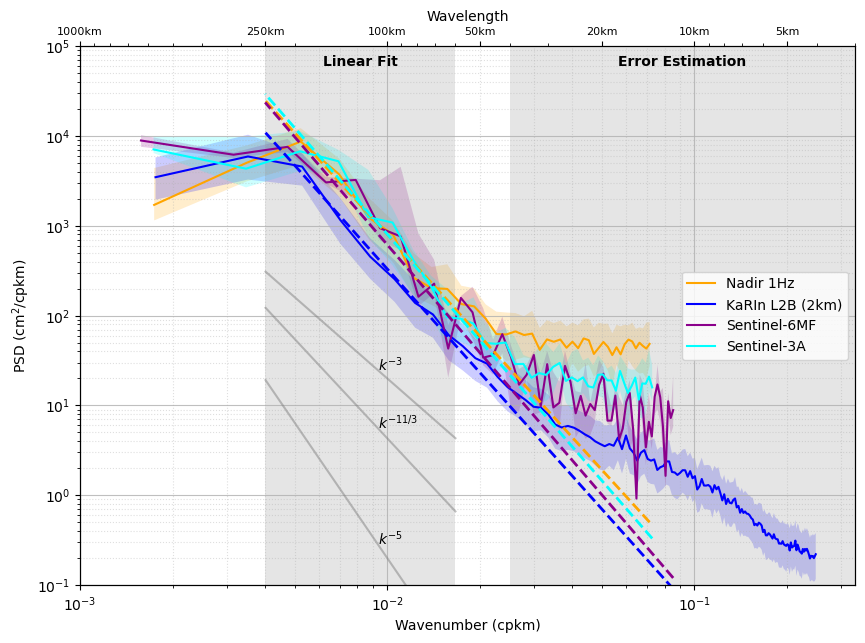

In [17]:
AOI = [130, 135, 36, 41]#[130, 135, 35, 42.5]

fig, ax = plt.subplots(figsize=(10,7))
#cycles = [560, 561]
p = list(nadir1[cycles[0]].keys())[0]


# KaRIn Nadir 1Hz
c = list(nadir1.keys())[0]
p = list(nadir1[c].keys())[0]
ssh = []
for c in nadir1.keys():
    for p in nadir1[c].keys():
        mask = np.logical_and(nadir1[c][p]["latitude"]>36,
                                nadir1[c][p]["latitude"]<41)
        ssh.append(nadir1[c][p]["ssh_mss"][mask])
ssh.sort(key=len, reverse=True)
psd_nadir1, k_nadir1, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")
ax.loglog(k_nadir1, psd_nadir1, 'orange')
ax.fill_between(k_nadir1, sd[0,:], sd[1,:], color='orange',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                              karin2[c][p]["latitude"][:,0]<41)
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
ssh.sort(key=len, reverse=True)
psd_karin2, k_karin2, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")
ax.loglog(k_karin2, psd_karin2, 'b')
ax.fill_between(k_karin2, sd[0,:], sd[1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")


# Sentinel-6
ssh = []
for c in s6a.keys():
    x = s6a[c]["sea_level_anomaly"]
    if x.size < 100:
        continue
    ssh.append(s6a[c]["sea_level_anomaly"])
psd_s6, k_s6, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=5757, unit="cm")
ax.loglog(k_s6, psd_s6, 'darkmagenta')
ax.fill_between(k_s6, sd[0,:], sd[1,:], color='darkmagenta',edgecolor=None, alpha=.2,label="_nolegend_")

# Sentinel-3A
ssh = []
for c in s3a.keys():
    x = s3a[c]["sea_level_anomaly"]
    if x.size < 80:
        continue
    ssh.append(s3a[c]["sea_level_anomaly"])
psd_s3, k_s3, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6704, unit="cm")
ax.loglog(k_s3, psd_s3, 'cyan')
ax.fill_between(k_s3, sd[0,:], sd[1,:], color='cyan',edgecolor=None, alpha=.2,label="_nolegend_")


# Baseline
#k_synth = np.arange(2, 1000.0)**(-1)
#ax.plot(k_synth, (2+0.00125*(k_synth)**(-2)), "k")
# From Global Observations of Fine-Scale Ocean Surface Topography With the Surface Water and Ocean Topography (SWOT) Mission


# Fitlines
fit_lims = [60.0, 250.0]#[60.0, 250.0]

mask = np.logical_and(k_karin2<fit_lims[0]**(-1), k_karin2>fit_lims[1]**(-1))
fit_karin2 = scipy.stats.linregress(np.log10(k_karin2[mask]), np.log10(psd_karin2[mask]))

mask = np.logical_and(k_nadir1<fit_lims[0]**(-1), k_nadir1>fit_lims[1]**(-1))
fit_nadir1 = scipy.stats.linregress(np.log10(k_nadir1[mask]), np.log10(psd_nadir1[mask]))

mask = np.logical_and(k_s6<fit_lims[0]**(-1), k_s6>fit_lims[1]**(-1))
fit_s6 = scipy.stats.linregress(np.log10(k_s6[mask]), np.log10(psd_s6[mask]))

mask = np.logical_and(k_s3<fit_lims[0]**(-1), k_s3>fit_lims[1]**(-1))
fit_s3 = scipy.stats.linregress(np.log10(k_s3[mask]), np.log10(psd_s3[mask]))

k_synth = np.arange(k_karin2.max()**(-1), fit_lims[1])**(-1)#np.arange(fit_lims[0], fit_lims[1])**(-1)
ax.plot(k_synth, 10**(fit_karin2.intercept + fit_karin2.slope*np.log10(k_synth)), "b", linestyle="--", linewidth=2)
k_synth = np.arange(k_nadir1.max()**(-1), fit_lims[1])**(-1)#np.arange(fit_lims[0], fit_lims[1])**(-1)
ax.plot(k_synth, 10**(fit_nadir1.intercept + fit_nadir1.slope*np.log10(k_synth)), "orange", linestyle="--", linewidth=2)
k_synth = np.arange(k_s6.max()**(-1), fit_lims[1])**(-1)#np.arange(fit_lims[0], fit_lims[1])**(-1)
ax.plot(k_synth, 10**(fit_s6.intercept + fit_s6.slope*np.log10(k_synth)), "darkmagenta", linestyle="--", linewidth=2)
k_synth = np.arange(k_s3.max()**(-1), fit_lims[1])**(-1)#np.arange(fit_lims[0], fit_lims[1])**(-1)
ax.plot(k_synth, 10**(fit_s3.intercept + fit_s3.slope*np.log10(k_synth)), "cyan", linestyle="--", linewidth=2)

ax.legend(["Nadir 1Hz", "KaRIn L2B (2km)", "Sentinel-6MF", "Sentinel-3A"], loc="right")

ax.fill_between(np.array([fit_lims[0], fit_lims[1]])**(-1), np.ones(2)*1e-10, np.ones(2)*1e10, color='gray',edgecolor=None, alpha=.2,label="_nolegend_")
ax.text((10**(np.log10(np.array([fit_lims[1], fit_lims[0]])).mean()))**(-1), 6e4, "Linear Fit", fontweight="bold", horizontalalignment='center')
ax.fill_between(np.array([3.0, 40.0])**(-1), np.ones(2)*1e-10, np.ones(2)*1e10, color='gray',edgecolor=None, alpha=.2,label="_nolegend_")
ax.text((10**(np.log10(np.array([3.0, 40.0])).mean()))**(-1), 6e4, "Error Estimation", fontweight="bold", horizontalalignment='center')

k_synth = np.arange(fit_lims[0], fit_lims[1])**(-1)
for k in ["-3","-11/3", "-5"]:
    k_num = k.split("/")
    if len(k_num) > 1:
        k_num = float(k_num[0]) / float(k_num[1])
    else:
        k_num = float(k_num[0])
    ax.plot(k_synth, (1e3*k_synth)**(k_num)*2e4, "gray", alpha=0.5)
    ax.text(k_synth[k_synth.size//4], (1e3*k_synth[k_synth.size//4])**(k_num)*2e4, r"$k^{{{}}}$".format(k))

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_yticks(np.logspace(-6,6,13))
ax.set_ylim([1e-1, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 3]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 250, 100, 50, 20, 10, 5]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)

plt.show()

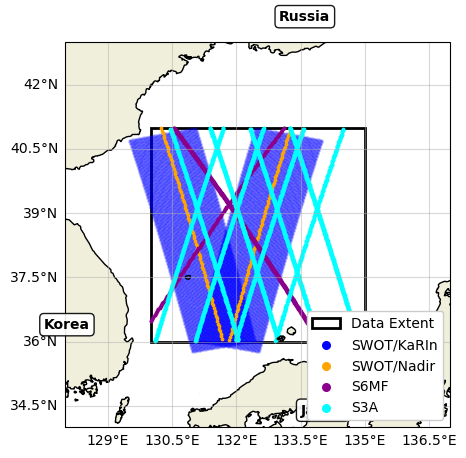

In [282]:

fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='none'))


# KaRIn
c = list(karin2.keys())[1]
for p in karin2[c].keys():
    mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ax.scatter(karin2[c][p]["longitude"][mask], karin2[c][p]["latitude"][mask],1, "blue", alpha=0.1,label="_nolegend_")
ax.scatter([],[],30, "blue")


# Nadir
c = list(nadir1.keys())[1]
for p in nadir1[c].keys():
    mask = np.logical_and(nadir1[c][p]["latitude"]>AOI[2], nadir1[c][p]["latitude"]<AOI[3])
    ax.scatter(nadir1[c][p]["longitude"][mask], nadir1[c][p]["latitude"][mask],3, "orange",label="_nolegend_")
ax.scatter([],[],30, "orange")

# Sentinel-6
for c in s6a.keys():
    if s6a[c]["longitude"].size < 100:
        continue
    ax.scatter(s6a[c]["longitude"], s6a[c]["latitude"],3, "darkmagenta",label="_nolegend_")
ax.scatter([],[],30, "darkmagenta")

# Sentinel-3
for c in s3a.keys():
    if s3a[c]["longitude"].size < 80:
        continue
    ax.scatter(s3a[c]["longitude"], s3a[c]["latitude"],3, "cyan",label="_nolegend_")
ax.scatter([],[],30, "cyan")

ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*2, crs=ccrs.PlateCarree())
ax.annotate("Japan", (133.5, 34.3), (133.5, 34.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
ax.annotate("Korea", (127.5, 36.3), (127.5, 36.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
ax.annotate("Russia", (133, 43.5), (133, 43.5), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
ax.legend(["Data Extent", "SWOT/KaRIn", "SWOT/Nadir", "S6MF", "S3A"], framealpha=1)
#ax.set_title("Data Extent", fontweight="bold")
plt.show()

In [18]:
# Determine noise floor from fitted line

wavelength_lim = 30

mask = k_nadir1>wavelength_lim**(-1)
k_seg = k_nadir1[mask]
psd_fitsignal = 10**(fit_nadir1.intercept + fit_nadir1.slope*np.log10(k_seg))
psd_noise = psd_nadir1[mask] - psd_fitsignal

rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))
print("Nadir 1Hz RMS noise: {:.2f} cm".format(rms_noise))


mask = k_karin2>wavelength_lim**(-1)
k_seg = k_karin2[mask]
psd_fitsignal = 10**(fit_karin2.intercept + fit_karin2.slope*np.log10(k_seg))
psd_noise = psd_karin2[mask] - psd_fitsignal

rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))
print("KaRIn L2B RMS noise: {:.2f} cm".format(rms_noise))


mask = k_s6>wavelength_lim**(-1)
k_seg = k_s6[mask]
psd_fitsignal = 10**(fit_s6.intercept + fit_s6.slope*np.log10(k_seg))
psd_noise = psd_s6[mask] - psd_fitsignal

rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))
print("Sentinel-6 RMS noise: {:.2f} cm".format(rms_noise))


mask = k_s3>wavelength_lim**(-1)
k_seg = k_s3[mask]
psd_fitsignal = 10**(fit_s3.intercept + fit_s3.slope*np.log10(k_seg))
psd_noise = psd_s3[mask] - psd_fitsignal

rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))
print("Sentinel-3A RMS noise: {:.2f} cm".format(rms_noise))

print("")

print("Nadir 1Hz slope: {:.2f}+-{:.2f}".format(fit_nadir1.slope, fit_nadir1.stderr))
print("KaRIn L2B slope: {:.2f}+-{:.2f}".format(fit_karin2.slope, fit_karin2.stderr))
print("Sentinel-6 slope: {:.2f}+-{:.2f}".format(fit_s6.slope, fit_s6.stderr))
print("Sentinel-3A slope: {:.2f}+-{:.2f}".format(fit_s3.slope, fit_s3.stderr))


Nadir 1Hz RMS noise: 1.28 cm
KaRIn L2B RMS noise: 0.51 cm
Sentinel-6 RMS noise: 0.68 cm
Sentinel-3A RMS noise: 0.81 cm

Nadir 1Hz slope: -3.75+-0.26
KaRIn L2B slope: -3.83+-0.15
Sentinel-6 slope: -3.98+-0.56
Sentinel-3A slope: -3.93+-0.41


Nadir 20Hz RMS noise: 2.87 cm
KaRIn L2A 250m RMS noise: 0.42 cm


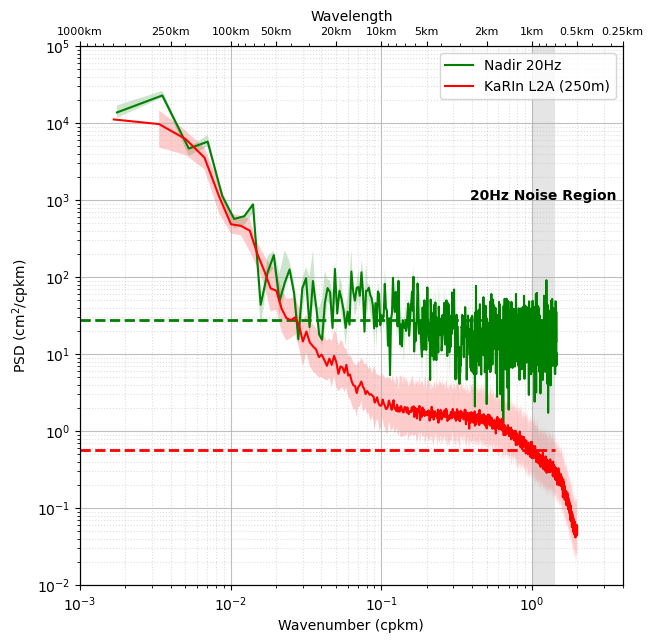

In [59]:


fig, ax = plt.subplots(figsize=(7,7))
#cycles = [560, 561]
p = 21


# KaRIn Nadir 20Hz
mask = np.logical_and(nadir20[cycles[0]][p]["latitude"]>36,
                    nadir20[cycles[0]][p]["latitude"]<41)
ssh = []
for c in nadir20.keys():
    for p in nadir20[c].keys():
        mask = np.logical_and(nadir20[c][p]["latitude"]>36,
                            nadir20[c][p]["latitude"]<41)
        ssh.append(nadir20[c][p]["ssh_mss"][mask])
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=342, unit="cm")
ax.loglog(k, psd, 'green')
ax.fill_between(k, sd[0,:], sd[1,:], color='green',edgecolor=None, alpha=.2,label="_nolegend_")

wavelength_lim = [1, 0.7]
mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("Nadir 20Hz RMS noise: {:.2f} cm".format(rms_noise))
ax.hlines(np.trapz(psd_seg, k_seg)/0.3, 1000**(-1), 0.7**(-1), color="green", linestyle="--", linewidth=2,label="_nolegend_")

# KaRIn L2A
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            for i in range(karin250[c][p][s]["ssh_mss"].shape[1]):
                mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                      karin250[c][p][s]["latitude"][:,0]<41)
                ssh.append(karin250[c][p][s]["ssh_mss"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=250, unit="cm",skip_n=10)
ax.loglog(k, psd, 'r')
ax.fill_between(k, sd[0,:], sd[1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")

wavelength_lim = [1, 0.7]
mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("KaRIn L2A 250m RMS noise: {:.2f} cm".format(rms_noise))
ax.hlines(np.trapz(psd_seg, k_seg)/0.3, 1000**(-1), 0.7**(-1), color="r", linestyle="--", linewidth=2,label="_nolegend_")

ax.legend(["Nadir 20Hz", "KaRIn L2A (250m)"])

ax.fill_between(np.array([1, 0.7])**(-1), np.ones(2)*1e-10, np.ones(2)*1e10, color='gray',edgecolor=None, alpha=.2,label="_nolegend_")
ax.text((10**(np.log10(np.array([1, 0.7])).mean()))**(-1), 1e3, "20Hz Noise Region", fontweight="bold", horizontalalignment='center')

# Setup plot settings
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
ax.set_yticks(np.logspace(-6,6,13))
ax.set_ylim([1e-2, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

# Create second axis
km_lims = [1000, 0.25]
ax.set_xlim([km_lims[0]**(-1), km_lims[1]**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim(km_lims)
ticks = [1000, 250, 100, 50, 20, 10, 5, 2, 1, 0.5, 0.25]
ax2.set_xticks(ticks)
ax2.set_xticklabels([str(t)+"km" for t in ticks], fontsize=8)

plt.show()

In [19]:
# Integrate noise

p = 21
wavelength_lim = [30, 15]

"""
# KaRIn Nadir 20Hz
ssh = []
for c in nadir20.keys():
    for p in nadir20[c].keys():
        mask = np.logical_and(nadir20[c][p]["latitude"]>36,
                            nadir20[c][p]["latitude"]<41)
        ssh.append(nadir20[c][p]["ssh_mss"][mask])
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=342, unit="cm")

mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("Nadir 20Hz RMS noise: {:.2f} cm".format(rms_noise))

# KaRIn L2A
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            for i in range(karin250[c][p][s]["ssh_mss"].shape[1]):
                mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                      karin250[c][p][s]["latitude"][:,0]<41)
                ssh.append(karin250[c][p][s]["ssh_mss"][mask][:,i])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=250, unit="cm",skip_n=10)

mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("KaRIn L2A 250m RMS noise: {:.2f} cm".format(rms_noise))
"""

# KaRIn Nadir 1Hz
c = list(nadir1.keys())[0]
p = list(nadir1[c].keys())[0]
ssh = []
for c in nadir1.keys():
    for p in nadir1[c].keys():
        mask = np.logical_and(nadir1[c][p]["latitude"]>36,
                                nadir1[c][p]["latitude"]<41)
        ssh.append(nadir1[c][p]["ssh_mss"][mask])
ssh.sort(key=len, reverse=True)
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")

mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("Nadir 1Hz RMS noise: {:.2f} cm".format(rms_noise))

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                              karin2[c][p]["latitude"][:,0]<41)
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
ssh.sort(key=len, reverse=True)
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")

mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("KaRIn L2B 2km RMS noise: {:.2f} cm".format(rms_noise))

# Sentinel-6
ssh = []
for c in s6a.keys():
    x = s6a[c]["sea_level_anomaly"]
    if x.size < 100:
        continue
    ssh.append(s6a[c]["sea_level_anomaly"])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=5757, unit="cm")

mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("Sentinel-6 RMS noise: {:.2f} cm".format(rms_noise))


# Sentinel-3A
ssh = []
for c in s3a.keys():
    x = s3a[c]["sea_level_anomaly"]
    if x.size < 80:
        continue
    ssh.append(s3a[c]["sea_level_anomaly"])
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6704, unit="cm")

mask = np.logical_and(k>wavelength_lim[0]**(-1), k<wavelength_lim[1]**(-1))
psd_seg = psd[mask]
k_seg = k[mask]
rms_noise = np.sqrt(np.trapz(psd_seg, k_seg))
print("Sentinel-3A RMS noise: {:.2f} cm".format(rms_noise))


Nadir 1Hz RMS noise: 1.21 cm
KaRIn L2B 2km RMS noise: 0.38 cm
Sentinel-6 RMS noise: 0.59 cm
Sentinel-3A RMS noise: 0.78 cm


In [8]:
# KaRIn 250 m
ssh = []
for c in karin250.keys():
    for p in karin250[c].keys():
        for s in karin250[c][p].keys():
            for i in range(karin250[c][p][s]["ssh_mss"].shape[1]):
                mask = np.logical_and(karin250[c][p][s]["latitude"][:,0]>36,
                                      karin250[c][p][s]["latitude"][:,0]<41)
                ssh.append(karin250[c][p][s]["ssh_mss"][mask][:,i])
psd_karin250, k_karin250, sd_karin250 = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=250, unit="cm",skip_n=10)

In [9]:
# KaRIn Nadir 1Hz
c = list(nadir1.keys())[0]
p = list(nadir1[c].keys())[0]
ssh = []
for c in nadir1.keys():
    for p in nadir1[c].keys():
        mask = np.logical_and(nadir1[c][p]["latitude"]>36,
                                nadir1[c][p]["latitude"]<41)
        ssh.append(nadir1[c][p]["ssh_mss"][mask])
ssh.sort(key=len, reverse=True)
psd_nadir1, k_nadir1, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")

# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]
ssh = []
for c in karin2.keys():
    for p in karin2[c].keys():
        mask = np.logical_and(karin2[c][p]["latitude"][:,0]>36,
                              karin2[c][p]["latitude"][:,0]<41)
        for i in range(karin2[c][p]["latitude"][mask].shape[1]):
            ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
ssh.sort(key=len, reverse=True)
psd_karin2, k_karin2, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")

# Sentinel-6
ssh = []
for c in s6a.keys():
    x = s6a[c]["sea_level_anomaly"]
    if x.size < 100:
        continue
    ssh.append(s6a[c]["sea_level_anomaly"])
psd_s6, k_s6, sd_s6 = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=5757, unit="cm")

In [10]:
# Functions
k1 = 250**(-1)
def S_res_nadir1(par):
    #psd = np.zeros(k_nadir1.size)
    #psd[k_nadir1<par[2]] = par[0]**2 + par[1] * par[2]**(-par[3])
    #psd[k_nadir1>par[2]] = par[0]**2 + par[1] * k_nadir1[k_nadir1>par[2]]**(-par[3])
    psd = par[0]**2 + par[1] * k_nadir1[k_nadir1>k1]**(-par[2])

    res = np.log(psd) - np.log(psd_nadir1[k_nadir1>k1])
    return res
def S_res_karin2(par):
    #psd = np.zeros(k_karin2.size)
    #psd[k_karin2<par[2]] = par[0]**2 + par[1] * par[2]**(-par[3])
    #psd[k_karin2>par[2]] = par[0]**2 + par[1] * k_karin2[k_karin2>par[2]]**(-par[3])
    k = k_karin2[k_karin2>k1]
    psd_true = psd_karin2[k_karin2>k1]

    psd_true = psd_true[k<20**(-1)]
    k = k[k<20**(-1)]
    
    psd = par[0]**2 + par[1] * k[k>k1]**(-par[2])
                                    
    res = np.log(psd) - np.log(psd_true)
    return res
def S_res_karin250(par):
    #psd = np.zeros(k_karin2.size)
    #psd[k_karin2<par[2]] = par[0]**2 + par[1] * par[2]**(-par[3])
    #psd[k_karin2>par[2]] = par[0]**2 + par[1] * k_karin2[k_karin2>par[2]]**(-par[3])
    k = k_karin250[k_karin250>k1]
    psd_true = psd_karin250[k_karin250>k1]

    psd_true = psd_true[k<2**(-1)]
    k = k[k<2**(-1)]

    psd = par[0]**2 + par[1] * k**(-par[2])
                                    
    res = np.log(psd) - np.log(psd_true)
    return res
def S_res_s6(par):
    #psd = np.zeros(k_karin2.size)
    #psd[k_karin2<par[2]] = par[0]**2 + par[1] * par[2]**(-par[3])
    #psd[k_karin2>par[2]] = par[0]**2 + par[1] * k_karin2[k_karin2>par[2]]**(-par[3])
    k = k_s6[k_s6>k1]
    psd_true = psd_s6[k_s6>k1]

    psd_true = psd_true[k<2**(-1)]
    k = k[k<2**(-1)]

    psd = par[0]**2 + par[1] * k**(-par[2])
                                    
    res = np.log(psd) - np.log(psd_true)
    return res
def S(k, sigma, C, alpha):#(k, sigma, C, k1, alpha):
    #psd = np.zeros(k.size)
    #psd[k<k1] = sigma**2 + C * k1**(-alpha)
    #psd[k>k1] = sigma**2 + C * k[k>k1]**(-alpha)
    psd = sigma**2 + C * k**(-alpha)
    return psd

In [11]:
# Fit data

# Sigma, C, K1, Alpha
nadir1_guess = np.array([2.0, 1e-3, 3.0])
karin2_guess = np.array([2.0, 1e-3, 3.0])
karin250_guess = np.array([2.0, 1e-3, 3.0])
s6_guess = np.array([2.0, 1e-3, 3.0])
opt_nadir1 = scipy.optimize.least_squares(S_res_nadir1, nadir1_guess)
opt_karin2 = scipy.optimize.least_squares(S_res_karin2, karin2_guess)
opt_karin250 = scipy.optimize.least_squares(S_res_karin250, karin250_guess)
opt_s6 = scipy.optimize.least_squares(S_res_s6, s6_guess)

print("Nadir: ",opt_nadir1.x)
print("KaRIn: ",opt_karin2.x)
print("KaRIn 250m: ",opt_karin250.x)
print("Sentinel-6: ",opt_s6.x)

Nadir:  [6.70676493e+00 1.02814690e-05 3.92618595e+00]
KaRIn:  [1.76696028e+00 1.93266225e-05 3.62125237e+00]
KaRIn 250m:  [1.18175442e+00 5.58061473e-04 3.00735452e+00]
Sentinel-6:  [2.54442108e+00 6.19119491e-05 3.51691412e+00]


C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\625963524.py:9: RuntimeWarning: invalid value encountered in log
  res = np.log(psd) - np.log(psd_nadir1[k_nadir1>k1])
C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\625963524.py:23: RuntimeWarning: invalid value encountered in log
  res = np.log(psd) - np.log(psd_true)
C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\625963524.py:51: RuntimeWarning: invalid value encountered in log
  res = np.log(psd) - np.log(psd_true)


Sentinel-6 rms: 2.54 +- 0.34
Sentinel-6 slope: 3.52 +- 0.45
Nadir 1 Hz rms: 6.71 +- 0.76
Nadir 1 Hz slope: 3.93 +- 0.87
KaRIn L2B rms: --
KaRIn L2B slope: 3.62 +- 0.63
KaRIn L2A rms: 1.18 +- 0.04
KaRIn L2A slope: 3.01 +- 0.24


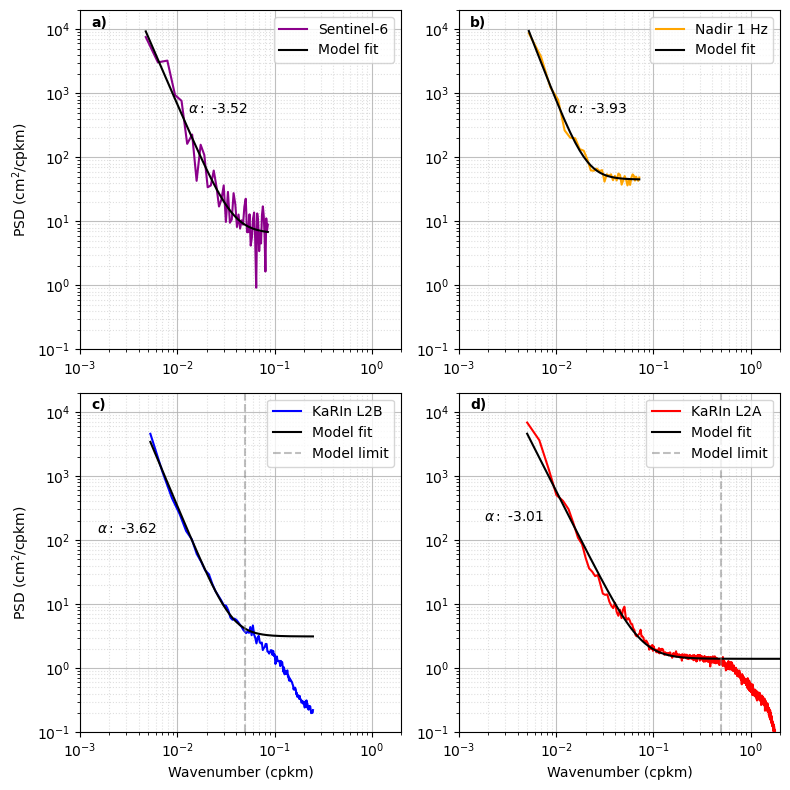

In [12]:
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(2,2,1)
ax.text(1.3e-3,1.1e4,"a)",fontweight="bold")
#plt.loglog(k_nadir1[k_nadir1>k1], S(k_nadir1[k_nadir1>k1], nadir1_guess[0], nadir1_guess[1], nadir1_guess[2]), "k")
ax.loglog(k_s6[k_s6>k1], psd_s6[k_s6>k1], 'darkmagenta')
ax.loglog(k_s6[k_s6>k1], S(k_s6[k_s6>k1], opt_s6.x[0], opt_s6.x[1], opt_s6.x[2]), "k")
ax.set_ylim([1e-1, 2e4])
ax.set_xlim([1e-3, 2e0])
ax.legend(["Sentinel-6", "Model fit"])
ax.set_ylabel(r"PSD (cm$^2$/cpkm)")
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")
ax.text(1.3e-2, 5e2, "$\\alpha:$ -{:.2f}".format(opt_s6.x[2]))
# Error level
jacobian = opt_s6["jac"]
hessian = np.dot(jacobian.T, jacobian)
covariance_matrix = np.linalg.inv(hessian)
std_parameters = np.sqrt(np.diagonal(covariance_matrix))
print("Sentinel-6 rms: {:.2f} +- {:.2f}".format(opt_s6.x[0], std_parameters[0]))
print("Sentinel-6 slope: {:.2f} +- {:.2f}".format(opt_s6.x[2], std_parameters[2]))

ax = fig.add_subplot(2,2,2)
ax.text(1.3e-3,1.1e4,"b)",fontweight="bold")
#plt.loglog(k_nadir1[k_nadir1>k1], S(k_nadir1[k_nadir1>k1], nadir1_guess[0], nadir1_guess[1], nadir1_guess[2]), "k")
ax.loglog(k_nadir1[k_nadir1>k1], psd_nadir1[k_nadir1>k1], 'orange')
ax.loglog(k_nadir1[k_nadir1>k1], S(k_nadir1[k_nadir1>k1], opt_nadir1.x[0], opt_nadir1.x[1], opt_nadir1.x[2]), "k")
ax.set_ylim([1e-1, 2e4])
ax.set_xlim([1e-3, 2e0])
ax.legend(["Nadir 1 Hz", "Model fit"])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")
ax.text(1.3e-2, 5e2, "$\\alpha:$ -{:.2f}".format(opt_nadir1.x[2]))
# Error level
jacobian = opt_nadir1["jac"]
hessian = np.dot(jacobian.T, jacobian)
covariance_matrix = np.linalg.inv(hessian)
std_parameters = np.sqrt(np.diagonal(covariance_matrix))
print("Nadir 1 Hz rms: {:.2f} +- {:.2f}".format(opt_nadir1.x[0], std_parameters[0]))
print("Nadir 1 Hz slope: {:.2f} +- {:.2f}".format(opt_nadir1.x[2], std_parameters[2]))

ax = fig.add_subplot(2,2,3)
ax.text(1.3e-3,1.1e4,"c)",fontweight="bold")
#plt.loglog(k_karin2[k_karin2>k1], S(k_karin2[k_karin2>k1], karin2_guess[0], karin2_guess[1], karin2_guess[2]), "k")
ax.loglog(k_karin2[k_karin2>k1], psd_karin2[k_karin2>k1], 'blue')
ax.loglog(k_karin2[k_karin2>k1], S(k_karin2[k_karin2>k1], opt_karin2.x[0], opt_karin2.x[1], opt_karin2.x[2]), "k")
ax.set_ylim([1e-1, 2e4])
ax.set_xlim([1e-3, 2e0])
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel(r"PSD (cm$^2$/cpkm)")
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")
ax.text(1.5e-3, 1.3e2, "$\\alpha:$ -{:.2f}".format(opt_karin2.x[2]))
ax.vlines(20**(-1), 1e-1, 1e5, colors="gray", linestyle="--", alpha=0.5)
ax.legend(["KaRIn L2B", "Model fit", "Model limit"])
# Error level
jacobian = opt_karin2["jac"]
hessian = np.dot(jacobian.T, jacobian)
covariance_matrix = np.linalg.inv(hessian)
std_parameters = np.sqrt(np.diagonal(covariance_matrix))
print("KaRIn L2B rms: --")
print("KaRIn L2B slope: {:.2f} +- {:.2f}".format(opt_karin2.x[2], std_parameters[2]))

ax = fig.add_subplot(2,2,4)
ax.text(1.3e-3,1.1e4,"d)",fontweight="bold")
#plt.loglog(k_karin250[k_karin250>k1], S(k_karin250[k_karin250>k1], karin250_guess[0], karin250_guess[1], karin250_guess[2]), "k")
ax.loglog(k_karin250[k_karin250>k1], psd_karin250[k_karin250>k1], 'r')
ax.loglog(k_karin250[k_karin250>k1], S(k_karin250[k_karin250>k1], opt_karin250.x[0], opt_karin250.x[1], opt_karin250.x[2]), "k")
ax.set_ylim([1e-1, 2e4])
ax.set_xlim([1e-3, 2e0])
ax.set_xlabel("Wavenumber (cpkm)")
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")
ax.text(1.8e-3, 2e2, "$\\alpha:$ -{:.2f}".format(opt_karin250.x[2]))
ax.vlines(2**(-1), 1e-1, 1e5, colors="gray", linestyle="--", alpha=0.5)
ax.legend(["KaRIn L2A", "Model fit", "Model limit"])
# Error level
jacobian = opt_karin250["jac"]
hessian = np.dot(jacobian.T, jacobian)
covariance_matrix = np.linalg.inv(hessian)
std_parameters = np.sqrt(np.diagonal(covariance_matrix))
print("KaRIn L2A rms: {:.2f} +- {:.2f}".format(opt_karin250.x[0], std_parameters[0]))
print("KaRIn L2A slope: {:.2f} +- {:.2f}".format(opt_karin250.x[2], std_parameters[2]))

plt.tight_layout()
plt.show()

In [13]:
# Nadir and setup
AOI = [128, 135, 36, 41]#[128, 135, 35, 42.5]

avg_len = 14*2
avg_skip = 2
fit_lims = [70.0, 200.0]#[80.0, 280.0]
noise_wavelength_lim = 30

# KaRIn Nadir 1Hz
c = list(nadir1.keys())[0]
p = list(nadir1[c].keys())[0]

nadir1_times = []
nadir1_slopes = []
nadir1_slopes_sd = []
nadir1_noise = []
nadir1_noisefloor = []
nadir1_swh = []
c_keys = list(nadir1.keys())
for i in range(0, len(c_keys)-avg_len, avg_skip):
    ssh = []
    time_list = []
    swh = []
    for c in c_keys[i:i+avg_len]:
        for p in nadir1[c].keys():
            mask = np.logical_and(nadir1[c][p]["latitude"]>AOI[2],
                                    nadir1[c][p]["latitude"]<AOI[3])
            if mask.sum() == 0:
                continue
            ssh_ = nadir1[c][p]["ssh_mss"][mask]
             # Remove subsequent data where the difference is larger than 0.5 m
            outlier_mask = abs(np.diff(nadir1[c][p]["ssh_mss"][mask])) < 0.5
            outlier_mask = np.r_[outlier_mask, 1]
            ssh_[outlier_mask == False] = np.nan
            ssh.append(ssh_)
            time_list.append(np.nanmean(nadir1[c][p]["time"][mask]))
            swh_ = nadir1[c][p]["swh_ocean"][mask]
            swh_[swh_ > 50] = np.nan
            swh.append(np.nanmean(swh_))
    ssh.sort(key=len, reverse=True)
    psd_nadir1, k_nadir1, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")

    # Fit line
    mask = np.logical_and(k_nadir1<fit_lims[0]**(-1), k_nadir1>fit_lims[1]**(-1))
    fit_nadir1 = scipy.stats.linregress(np.log10(k_nadir1[mask]), np.log10(psd_nadir1[mask]))

    # SD
    slopes = []
    ranges_min = np.linspace(50, 90, 10)
    ranges_max = np.linspace(150, 250, 10)
    for i in range(10):
        for j in range(10):
            mask = np.logical_and(k_nadir1<(ranges_min[i])**(-1), k_nadir1>(ranges_max[j])**(-1))
            fit_nadir1_high = scipy.stats.linregress(np.log10(k_nadir1[mask]), np.log10(psd_nadir1[mask]))
            slopes.append(fit_nadir1_high.slope)
    #sd = np.std(slopes)
    sd = np.percentile(slopes, [10, 50, 90])

    # Determine noise
    mask = k_nadir1>noise_wavelength_lim**(-1)
    k_seg = k_nadir1[mask]
    psd_fitsignal = 10**(fit_nadir1.intercept + fit_nadir1.slope*np.log10(k_seg))
    psd_noise = psd_nadir1[mask] - psd_fitsignal
    rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))

    # Noise floor
    psd_seg = psd_nadir1[mask]
    rms_noisefloor = np.sqrt(np.trapz(psd_seg, k_seg))
    
    nadir1_noise.append(rms_noise)
    nadir1_noisefloor.append(rms_noisefloor)
    nadir1_swh.append(np.nanmean(swh))
    nadir1_times.append(np.nanmean(time_list))
    nadir1_slopes.append(fit_nadir1.slope)
    #nadir1_slopes_sd.append(fit_nadir1.stderr)
    nadir1_slopes_sd.append(sd)
time_list = np.array(time_list)
nadir1_times = np.array(nadir1_times)
nadir1_slopes = np.array(nadir1_slopes)
nadir1_slopes_sd = np.array(nadir1_slopes_sd)



In [14]:
# NADIR Parametric

# KaRIn Nadir 1Hz
c = list(nadir1.keys())[0]
p = list(nadir1[c].keys())[0]

nadir1_times_model = []
nadir1_slopes_model = []
nadir1_slopes_sd_model = []
nadir1_noise_model = []
c_keys = list(nadir1.keys())
for i in range(0, len(c_keys)-avg_len, avg_skip):
    ssh = []
    time_list = []
    for c in c_keys[i:i+avg_len]:
        for p in nadir1[c].keys():
            mask = np.logical_and(nadir1[c][p]["latitude"]>AOI[2],
                                    nadir1[c][p]["latitude"]<AOI[3])
            if mask.sum() == 0:
                continue
            ssh_ = nadir1[c][p]["ssh_mss"][mask]
             # Remove subsequent data where the difference is larger than 0.5 m
            outlier_mask = abs(np.diff(nadir1[c][p]["ssh_mss"][mask])) < 0.5
            outlier_mask = np.r_[outlier_mask, 1]
            ssh_[outlier_mask == False] = np.nan
            ssh.append(ssh_)
            time_list.append(np.nanmean(nadir1[c][p]["time"][mask]))
    ssh.sort(key=len, reverse=True)
    psd_nadir1, k_nadir1, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=6832, unit="cm")

    # Fit model
    nadir1_guess = np.array([1.0, 1e-3, 3.0])
    opt_nadir1 = scipy.optimize.least_squares(S_res_nadir1, nadir1_guess)

    # Determine slope
    slope = -opt_nadir1.x[2]

    # Determine noise
    rms_noise = opt_nadir1.x[0]

    # Uncertainty
    jacobian = opt_nadir1["jac"]
    hessian = np.dot(jacobian.T, jacobian)
    covariance_matrix = np.linalg.inv(hessian)
    std_parameters = np.sqrt(np.diagonal(covariance_matrix))
    #print(std_parameters)
    
    nadir1_noise_model.append(rms_noise)
    nadir1_times_model.append(np.nanmean(time_list))
    nadir1_slopes_model.append(slope)
    nadir1_slopes_sd_model.append(std_parameters[2])
time_list = np.array(time_list)
nadir1_times_model = np.array(nadir1_times_model)
nadir1_slopes_model = np.array(nadir1_slopes_model)
nadir1_noise_model = np.array(nadir1_noise_model)
nadir1_slopes_sd_model = np.array(nadir1_slopes_sd_model)



C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\625963524.py:9: RuntimeWarning: invalid value encountered in log
  res = np.log(psd) - np.log(psd_nadir1[k_nadir1>k1])


In [16]:
# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]

karin2_times = []
karin2_slopes = []
karin2_slopes_sd = []
karin2_noise = []
karin2_noisefloor = []
c_keys = list(karin2.keys())
for i in range(0, len(c_keys)-avg_len, avg_skip):#avg_skip):
    ssh = []
    time_list = []
    for c in c_keys[i:i+avg_len]:
        for p in karin2[c].keys():
            mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2],
                                  karin2[c][p]["latitude"][:,0]<AOI[3])
            for i in range(karin2[c][p]["latitude"][mask].shape[1]):
                ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
            time = karin2[c][p]["time"][mask]
            time[time>1e15] = np.nan
            time_list.append(np.nanmean(time))
    ssh.sort(key=len, reverse=True)
    psd_karin2, k_karin2, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")

    mask = np.logical_and(k_karin2<fit_lims[0]**(-1), k_karin2>fit_lims[1]**(-1))
    fit_karin2 = scipy.stats.linregress(np.log10(k_karin2[mask]), np.log10(psd_karin2[mask]))

    # SD
    slopes = []
    ranges_min = np.linspace(50, 90, 10)
    ranges_max = np.linspace(150, 250, 10)
    for i in range(10):
        for j in range(10):
            mask = np.logical_and(k_karin2<(ranges_min[i])**(-1), k_karin2>(ranges_max[j])**(-1))
            fit_karin2_high = scipy.stats.linregress(np.log10(k_karin2[mask]), np.log10(psd_karin2[mask]))
            slopes.append(fit_karin2_high.slope)
    #sd = np.std(slopes)
    sd = np.percentile(slopes, [10, 50, 90])

    # Determine noise
    mask = k_karin2>noise_wavelength_lim**(-1)
    k_seg = k_karin2[mask]
    psd_fitsignal = 10**(fit_karin2.intercept + fit_karin2.slope*np.log10(k_seg))
    psd_noise = psd_karin2[mask] - psd_fitsignal
    rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))

    # Noise floor
    psd_seg = psd_karin2[mask]
    rms_noisefloor = np.sqrt(np.trapz(psd_seg, k_seg))

    karin2_noise.append(rms_noise)
    karin2_noisefloor.append(rms_noisefloor)
    karin2_times.append(np.nanmean(time_list))
    karin2_slopes.append(fit_karin2.slope)
    #karin2_slopes_sd.append(fit_karin2.stderr)
    karin2_slopes_sd.append(sd)
    
karin2_times = np.array(karin2_times)
karin2_slopes = np.array(karin2_slopes)
karin2_slopes_sd = np.array(karin2_slopes_sd)

C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\271735184.py:22: RuntimeWarning: Mean of empty slice
  time_list.append(np.nanmean(time))


In [17]:
# KaRIn parametric
# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]

karin2_times = []
karin2_slopes_model = []
karin2_slopes_sd_model = []
karin2_noise_model = []
karin2_noise_sd_model = []
c_keys = list(karin2.keys())
for i in range(0, len(c_keys)-avg_len, avg_skip):#avg_skip):
    ssh = []
    time_list = []
    for c in c_keys[i:i+avg_len]:
        for p in karin2[c].keys():
            mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2],
                                  karin2[c][p]["latitude"][:,0]<AOI[3])
            for i in range(karin2[c][p]["latitude"][mask].shape[1]):
                ssh.append(karin2[c][p]["ssh_mss"][mask][:,i])
            time = karin2[c][p]["time"][mask]
            time[time>1e15] = np.nan
            time_list.append(np.nanmean(time))
    ssh.sort(key=len, reverse=True)
    psd_karin2, k_karin2, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=2000, unit="cm")

    # Fit model
    karin2_guess = np.array([1.0, 1e-3, 3.0])
    opt_karin2 = scipy.optimize.least_squares(S_res_karin2, karin2_guess)

    # Determine slope
    slope = -opt_karin2.x[2]

    # Determine noise
    rms_noise = opt_karin2.x[0]

    # Uncertainty
    jacobian = opt_karin2["jac"]
    hessian = np.dot(jacobian.T, jacobian)
    covariance_matrix = np.linalg.inv(hessian)
    std_parameters = np.sqrt(np.diagonal(covariance_matrix))
    #print(std_parameters)

    karin2_noise_model.append(rms_noise)
    karin2_noise_sd_model.append(std_parameters[0])
    karin2_times.append(np.nanmean(time_list))
    karin2_slopes_model.append(slope)
    karin2_slopes_sd_model.append(std_parameters[2])
    
karin2_times_model = np.array(karin2_times)
karin2_slopes_model = np.array(karin2_slopes_model)
karin2_noise_model = np.array(karin2_noise_model)
karin2_noise_sd_model = np.array(karin2_noise_sd_model)
karin2_slopes_sd_model = np.array(karin2_slopes_sd_model)

C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\2831657318.py:23: RuntimeWarning: Mean of empty slice
  time_list.append(np.nanmean(time))
C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\625963524.py:23: RuntimeWarning: invalid value encountered in log
  res = np.log(psd) - np.log(psd_true)


In [325]:
""" Sen6
# KaRIn L2B
c = list(karin2.keys())[0]
p = list(karin2[c].keys())[0]

s6_times = []
s6_slopes = []
s6_slopes_sd = []
s6_noise = []
s6_noisefloor = []
c_keys = list(s6a.keys())
for i in range(0, len(c_keys)-avg_len, avg_skip):
    ssh = []
    time_list = []
    for c in c_keys[i:i+avg_len]:
        x = s6a[c]["sea_level_anomaly"]
        if x.size < 100:
            continue
        ssh.append(s6a[c]["sea_level_anomaly"])
        time_list.append(np.nanmean(s6a[c]["time"]))
    if ssh == []:
        continue
    psd_s6, k_s6, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=5757, unit="cm")

    mask = np.logical_and(k_s6<fit_lims[0]**(-1), k_s6>fit_lims[1]**(-1))
    fit_karin2 = scipy.stats.linregress(np.log10(k_s6[mask]), np.log10(psd_s6[mask]))

    # Determine noise
    mask = k_s6>noise_wavelength_lim**(-1)
    k_seg = k_s6[mask]
    psd_fitsignal = 10**(fit_s6.intercept + fit_s6.slope*np.log10(k_seg))
    psd_noise = psd_s6[mask] - psd_fitsignal
    rms_noise = np.sqrt(np.trapz(psd_noise, k_seg))

    # Noise floor
    psd_seg = psd_s6[mask]
    rms_noisefloor = np.sqrt(np.trapz(psd_seg, k_seg))

    s6_noise.append(rms_noise)
    s6_noisefloor.append(rms_noisefloor)
    s6_times.append(np.nanmean(time_list))
    s6_slopes.append(fit_karin2.slope)
    s6_slopes_sd.append(fit_karin2.stderr)
    
s6_times = np.array(s6_times)
s6_slopes = np.array(s6_slopes)
s6_slopes_sd = np.array(s6_slopes_sd)
"""

In [18]:
# Dates
nadir1_dates = np.array([datetime.datetime(2000,1,1) + datetime.timedelta(seconds=t) for t in nadir1_times])
karin2_dates = np.array([datetime.datetime(2000,1,1) + datetime.timedelta(seconds=t) for t in karin2_times])
#s6_dates = np.array([datetime.datetime(2000,1,1) + datetime.timedelta(seconds=t) for t in s6_times])

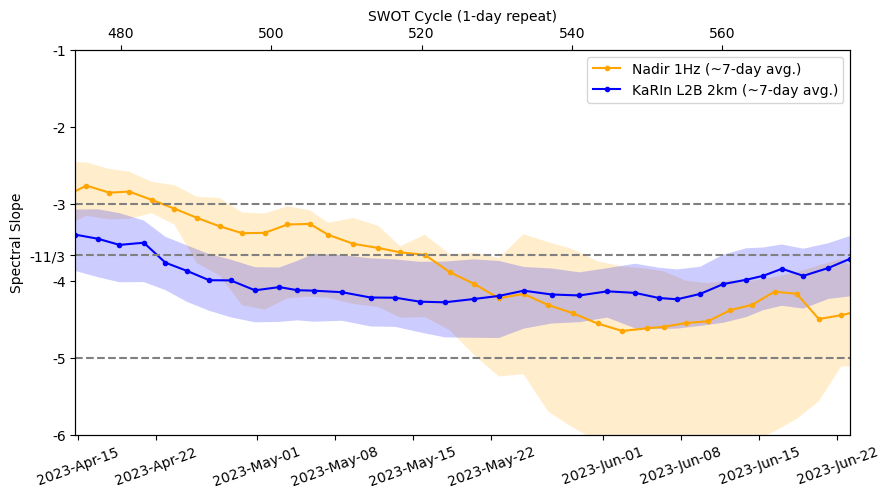

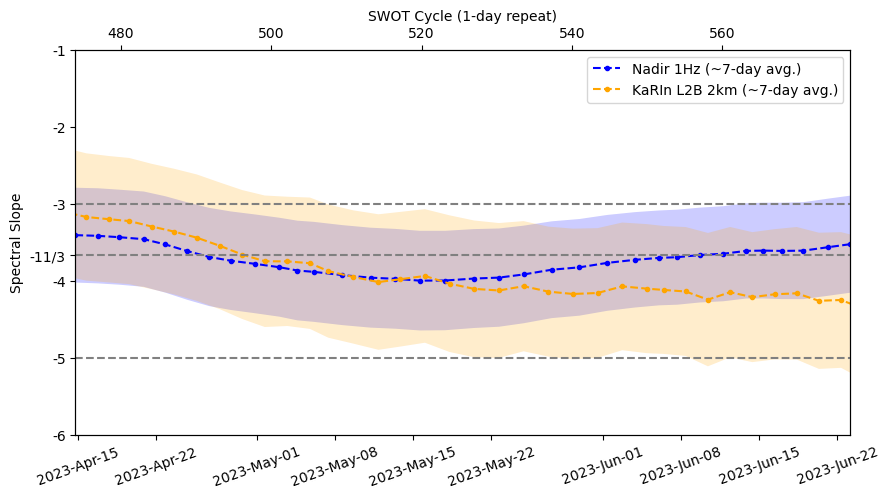

In [19]:
fig, ax = plt.subplots(figsize=(10,5))

#ax.plot(nadir1_dates, nadir1_slopes, color="orange", marker=".")
ax.plot(nadir1_dates, nadir1_slopes_sd[:,1], color="orange", marker=".")
#ax.fill_between(nadir1_dates, nadir1_slopes-nadir1_slopes_sd, nadir1_slopes+nadir1_slopes_sd, alpha=0.2, color="orange", edgecolor=None,label="_nolegend_")
ax.fill_between(nadir1_dates, nadir1_slopes_sd[:,0], nadir1_slopes_sd[:,2], alpha=0.2, color="orange", edgecolor=None,label="_nolegend_")

#ax.plot(karin2_dates, karin2_slopes, color="b", marker=".")
ax.plot(karin2_dates, karin2_slopes_sd[:,1], color="b", marker=".")
#ax.fill_between(karin2_dates, karin2_slopes-karin2_slopes_sd, karin2_slopes+karin2_slopes_sd, alpha=0.2, color="b", edgecolor=None,label="_nolegend_")
ax.fill_between(karin2_dates, karin2_slopes_sd[:,0], karin2_slopes_sd[:,2], alpha=0.2, color="b", edgecolor=None,label="_nolegend_")

#ax.plot(s6_dates, s6_slopes, color="darkmagenta", marker=".")
#ax.fill_between(s6_dates, s6_slopes-s6_slopes_sd, s6_slopes+s6_slopes_sd, alpha=0.2, color="darkmagenta", edgecolor=None,label="_nolegend_")

ax.hlines(-11/3, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -11/3-0.25, "-11/3", color="gray", fontsize=8)
ax.hlines(-3, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -3-0.25, "-3", color="gray", fontsize=8)
ax.hlines(-5, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -5-0.25, "-5", color="gray", fontsize=8)
ax.tick_params(axis='x', labelsize=10, labelrotation=20)

ax.set_ylabel("Spectral Slope")

ax.legend(["Nadir 1Hz (~7-day avg.)", "KaRIn L2B 2km (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([-6, -1])
ax.set_yticks([-6,-5,-4,-11/3,-3,-2,-1])
ax.set_yticklabels(["-6","-5","-4","-11/3","-3","-2","-1"])#, fontsize=8)

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b-%d'))

# Create second axis
cycles = list(karin2.keys())
ax2 = ax.twiny()
ax2.set_xlim([cycles[0], cycles[-1]])
ax2.set_xlabel("SWOT Cycle (1-day repeat)")

plt.show()

fig, ax = plt.subplots(figsize=(10,5))

ax.plot(karin2_dates, karin2_slopes_model, "b", linestyle="--", marker=".")
ax.fill_between(karin2_dates, karin2_slopes_model-karin2_slopes_sd_model, karin2_slopes_model+karin2_slopes_sd_model, alpha=0.2, color="b", edgecolor=None,label="_nolegend_")

ax.plot(nadir1_dates, nadir1_slopes_model, "orange", linestyle="--", marker=".")
ax.fill_between(nadir1_dates, nadir1_slopes_model-nadir1_slopes_sd_model, nadir1_slopes_model+nadir1_slopes_sd_model, alpha=0.2, color="orange", edgecolor=None,label="_nolegend_")

#ax.plot(s6_dates, s6_slopes, color="darkmagenta", marker=".")
#ax.fill_between(s6_dates, s6_slopes-s6_slopes_sd, s6_slopes+s6_slopes_sd, alpha=0.2, color="darkmagenta", edgecolor=None,label="_nolegend_")

ax.hlines(-11/3, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -11/3-0.25, "-11/3", color="gray", fontsize=8)
ax.hlines(-3, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -3-0.25, "-3", color="gray", fontsize=8)
ax.hlines(-5, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -5-0.25, "-5", color="gray", fontsize=8)
ax.tick_params(axis='x', labelsize=10, labelrotation=20)

ax.set_ylabel("Spectral Slope")

ax.legend(["Nadir 1Hz (~7-day avg.)", "KaRIn L2B 2km (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([-6, -1])
ax.set_yticks([-6,-5,-4,-11/3,-3,-2,-1])
ax.set_yticklabels(["-6","-5","-4","-11/3","-3","-2","-1"])#, fontsize=8)

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b-%d'))

# Create second axis
cycles = list(karin2.keys())
ax2 = ax.twiny()
ax2.set_xlim([cycles[0], cycles[-1]])
ax2.set_xlabel("SWOT Cycle (1-day repeat)")

plt.show()

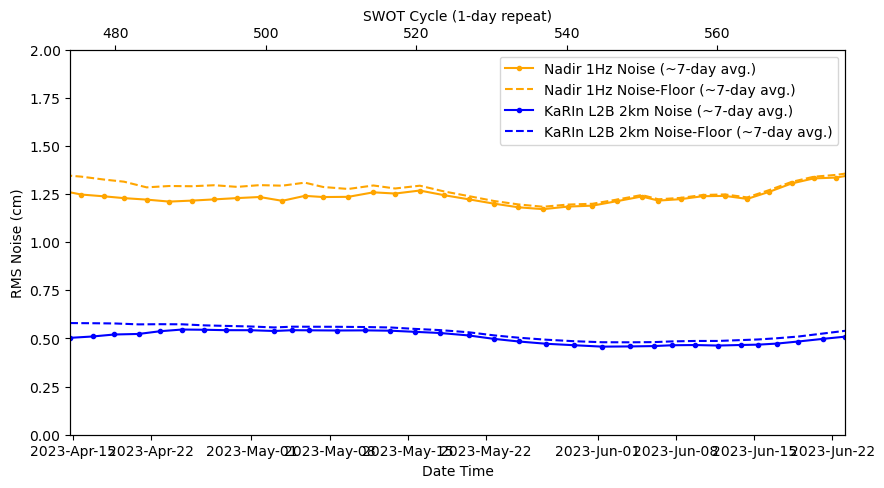

In [20]:
fig, ax = plt.subplots(figsize=(10,5))

ax.plot(nadir1_dates, nadir1_noise, color="orange", marker=".")
ax.plot(nadir1_dates, nadir1_noisefloor, color="orange", linestyle="--")

ax.plot(karin2_dates, karin2_noise, color="b", marker=".")
ax.plot(karin2_dates, karin2_noisefloor, color="b", linestyle="--")


ax.set_xlabel("Date Time")
ax.set_ylabel("RMS Noise (cm)")

ax.legend(["Nadir 1Hz Noise (~7-day avg.)", "Nadir 1Hz Noise-Floor (~7-day avg.)", 
           "KaRIn L2B 2km Noise (~7-day avg.)", "KaRIn L2B 2km Noise-Floor (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([0, 2])

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b-%d'))

# Create second axis
cycles = list(karin2.keys())
ax2 = ax.twiny()
ax2.set_xlim([cycles[0], cycles[-1]])
ax2.set_xlabel("SWOT Cycle (1-day repeat)")

plt.show()

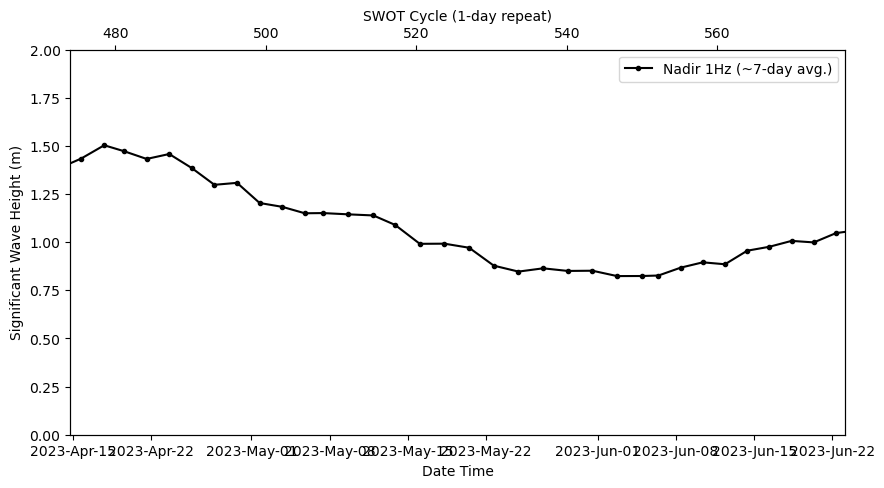

In [21]:
fig, ax = plt.subplots(figsize=(10,5))

ax.plot(nadir1_dates, nadir1_swh, color="k", marker=".")

ax.set_xlabel("Date Time")
ax.set_ylabel("Significant Wave Height (m)")

ax.legend(["Nadir 1Hz (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([0, 2])

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b-%d'))

# Create second axis
cycles = list(karin2.keys())
ax2 = ax.twiny()
ax2.set_xlim([cycles[0], cycles[-1]])
ax2.set_xlabel("SWOT Cycle (1-day repeat)")

plt.show()

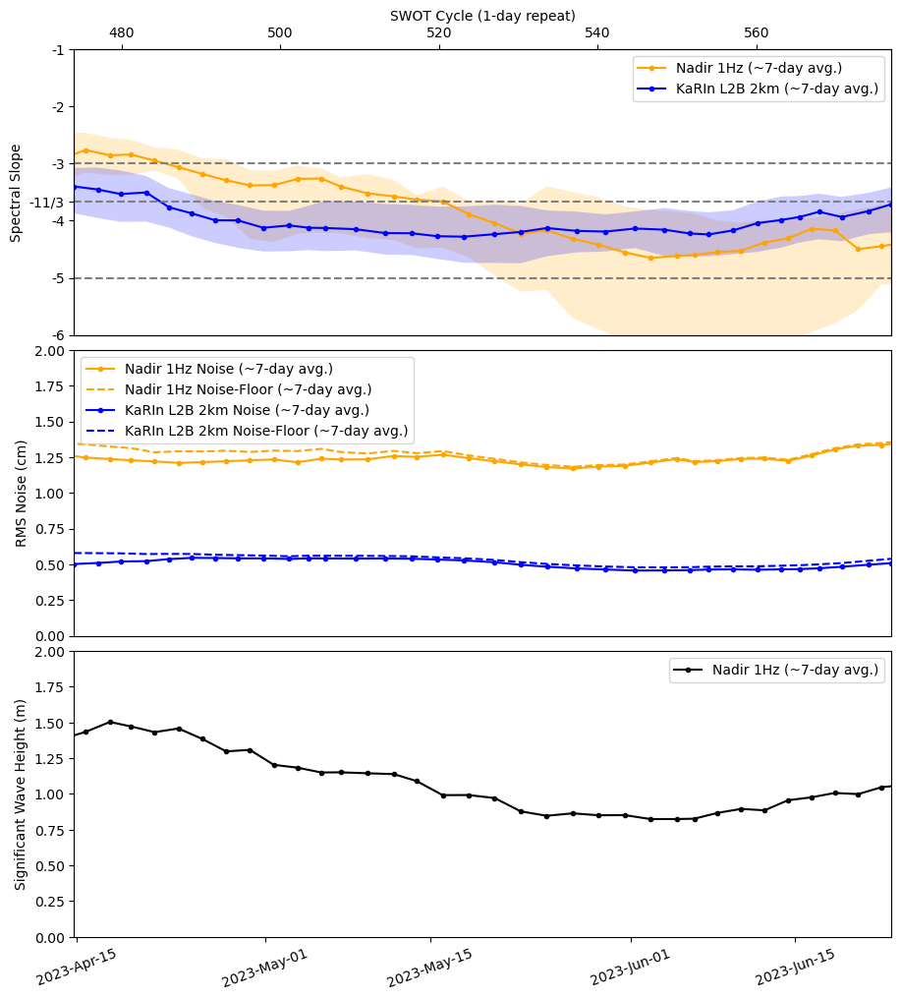

In [22]:
fig = plt.figure(figsize=(9,10))

ax = fig.add_subplot(3,1,1)

#ax.plot(nadir1_dates, nadir1_slopes, color="orange", marker=".")
ax.plot(nadir1_dates, nadir1_slopes_sd[:,1], color="orange", marker=".")
#ax.fill_between(nadir1_dates, nadir1_slopes-nadir1_slopes_sd, nadir1_slopes+nadir1_slopes_sd, alpha=0.2, color="orange", edgecolor=None,label="_nolegend_")
ax.fill_between(nadir1_dates, nadir1_slopes_sd[:,0], nadir1_slopes_sd[:,2], alpha=0.2, color="orange", edgecolor=None,label="_nolegend_")

#ax.plot(karin2_dates, karin2_slopes, color="b", marker=".")
ax.plot(karin2_dates, karin2_slopes_sd[:,1], color="b", marker=".")
#ax.fill_between(karin2_dates, karin2_slopes-karin2_slopes_sd, karin2_slopes+karin2_slopes_sd, alpha=0.2, color="b", edgecolor=None,label="_nolegend_")
ax.fill_between(karin2_dates, karin2_slopes_sd[:,0], karin2_slopes_sd[:,2], alpha=0.2, color="b", edgecolor=None,label="_nolegend_")

ax.hlines(-11/3, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -11/3-0.25, "-11/3", color="gray", fontsize=8)
ax.hlines(-3, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -3-0.25, "-3", color="gray", fontsize=8)
ax.hlines(-5, karin2_dates[0], karin2_dates[-1], color="gray", linestyle="--")
#ax.text(karin2_dates[1], -5-0.25, "-5", color="gray", fontsize=8)
#ax.tick_params(axis='x', labelsize=10, labelrotation=20)
ax.set_yticks([-6,-5,-4,-11/3,-3,-2,-1])
ax.set_yticklabels(["-6","-5","-4","-11/3","-3","-2","-1"])#, fontsize=8)


ax.set_ylabel("Spectral Slope")
ax.set_xticks([])
ax.legend(["Nadir 1Hz (~7-day avg.)", "KaRIn L2B 2km (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([-6, -1])


# Create second axis
cycles = list(karin2.keys())
ax2 = ax.twiny()
ax2.set_xlim([cycles[0], cycles[-1]])
ax2.set_xlabel("SWOT Cycle (1-day repeat)")

#########
ax = fig.add_subplot(3,1,2)

ax.plot(nadir1_dates, nadir1_noise, color="orange", marker=".")
ax.plot(nadir1_dates, nadir1_noisefloor, color="orange", linestyle="--")

ax.plot(karin2_dates, karin2_noise, color="b", marker=".")
ax.plot(karin2_dates, karin2_noisefloor, color="b", linestyle="--")

ax.set_ylabel("RMS Noise (cm)")
ax.set_xticks([])

ax.legend(["Nadir 1Hz Noise (~7-day avg.)", "Nadir 1Hz Noise-Floor (~7-day avg.)", 
           "KaRIn L2B 2km Noise (~7-day avg.)", "KaRIn L2B 2km Noise-Floor (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([0, 2])


#########
ax = fig.add_subplot(3,1,3)
ax.plot(nadir1_dates, nadir1_swh, color="k", marker=".")

ax.set_ylabel("Significant Wave Height (m)")
ax.legend(["Nadir 1Hz (~7-day avg.)"])

ax.set_xlim([karin2_dates[0], karin2_dates[-1]])
ax.set_ylim([0, 2])

import matplotlib.dates as mdates
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonthday=[1, 15]))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b-%d'))
ax.tick_params(axis='x', labelsize=10, labelrotation=20)

plt.tight_layout(pad=0.1)
plt.show()

## Correlation

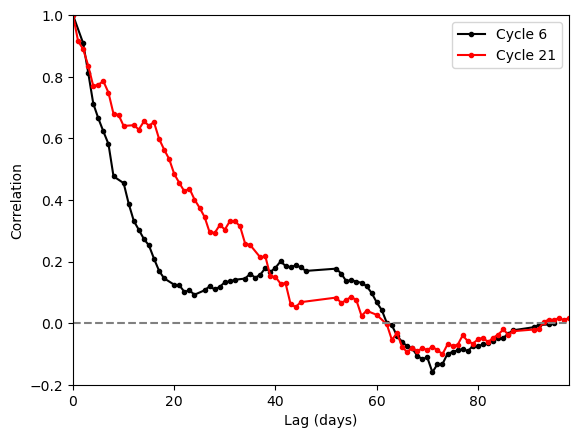

In [23]:
# Determine autocorrelation

fig, ax = plt.subplots()

#############
p = 6
c = list(karin2.keys())
#p = list(karin2[c[0]].keys())
c = np.array([(c_ if p in list(karin2[c_].keys()) else -1 ) for c_ in c])
c = c[c>0]
mask = np.logical_and(karin2[c[0]][p]["latitude"][:,0]>36, karin2[c[0]][p]["latitude"][:,0]<41)
ssh_stack = np.array([karin2[c_][p]["ssh_mss"][mask] for c_ in c])
ssh_stack = ssh_stack[1:] # Remove first element
ssh_stack = np.moveaxis(ssh_stack, 0, 2)

N = ssh_stack.shape[-1]-1
corr_sum = np.zeros(N)
cycles = c
for i in range(0,ssh_stack.shape[0],2):
    for j in range(0,ssh_stack.shape[1],2):
        a = ssh_stack[i,j,:]
        if (~np.isnan(a)).sum() == 0:
            continue
            
        # Interpolate gaps
        mask = np.isnan(a)
        a[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), a[~mask])
        
        corr = scipy.signal.correlate(a, a, mode="full", method="fft")[N+1:]
        corr_sum = np.vstack((corr_sum, corr))
corr_sum = corr_sum[1:]
corr = np.nanmean(corr_sum, axis=0)
corr /= np.nanmax(corr)

days = np.cumsum(np.diff(cycles[:-1]))
days -= days[0]

ax.plot(days, corr, color="k", marker=".")

##########
p = 21
c = list(karin2.keys())
#p = list(karin2[c[0]].keys())
c = np.array([(c_ if p in list(karin2[c_].keys()) else -1 ) for c_ in c])
c = c[c>0]
mask = np.logical_and(karin2[c[0]][p]["latitude"][:,0]>36, karin2[c[0]][p]["latitude"][:,0]<41)
ssh_stack = np.array([karin2[c_][p]["ssh_mss"][mask] for c_ in c])
ssh_stack = ssh_stack[1:] # Remove first element
ssh_stack = np.moveaxis(ssh_stack, 0, 2)

N = ssh_stack.shape[-1]-1
corr_sum = np.zeros(N)
cycles = c
for i in range(0,ssh_stack.shape[0],2):
    for j in range(0,ssh_stack.shape[1],2):
        a = ssh_stack[i,j,:]
        if (~np.isnan(a)).sum() == 0:
            continue
            
        # Interpolate gaps
        mask = np.isnan(a)
        a[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), a[~mask])
        
        corr = scipy.signal.correlate(a, a, mode="full", method="fft")[N+1:]
        corr_sum = np.vstack((corr_sum, corr))
corr_sum = corr_sum[1:]
corr = np.nanmean(corr_sum, axis=0)
corr /= np.nanmax(corr)

days = np.cumsum(np.diff(cycles[:-1]))
days -= days[0]

ax.plot(days, corr, color="r", marker=".")

ax.set_xlim([0, days[-1]])
ax.set_ylim([-0.2, 1])
ax.set_xlabel("Lag (days)")
ax.set_ylabel("Correlation")
ax.hlines(0, 0, days[-1], color="gray", linestyle="--")

ax.legend(["Cycle 6", "Cycle 21"])

plt.show()

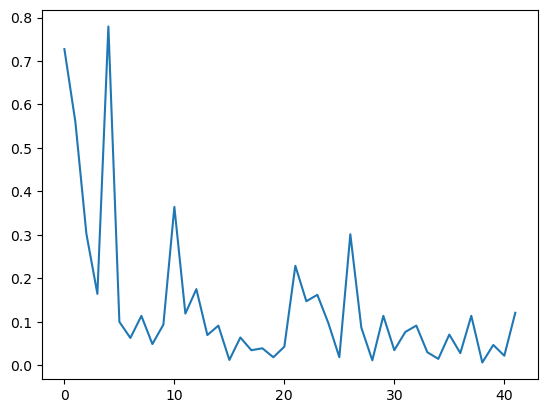

(0.0, 20.0)

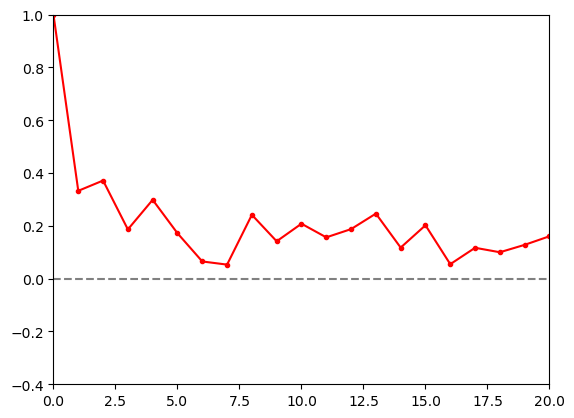

In [578]:
ssh_over_time = []
for i in range(ssh_stack.shape[0]):
    for j in range(ssh_stack.shape[1]):
        ssh_over_time.append(ssh_stack[i,j,:])
psd_karin2, f_karin2, sd = periodogram_list(ssh_over_time, conf_lvl=68, tapering_f="tukey", sampling=1, unit="cm")
lag_karin2 = f_karin2
lag_karin2 /= f_karin2[0]
lag_karin2 -= lag_karin2[0]

N = f_karin2.size
plt.plot(f_karin2, psd_karin2)
plt.show()
fft_corr = abs(scipy.fft.ifft(psd_karin2))
fft_corr /= fft_corr.max()
plt.plot(lag_karin2[:N//2], fft_corr[:N//2], color="r", marker=".")
plt.hlines(0, 0, (lag_karin2[:N//2])[-1], color="gray", linestyle="--")
plt.ylim([-0.4, 1])
plt.xlim([0, (lag_karin2[:N//2])[-1]])

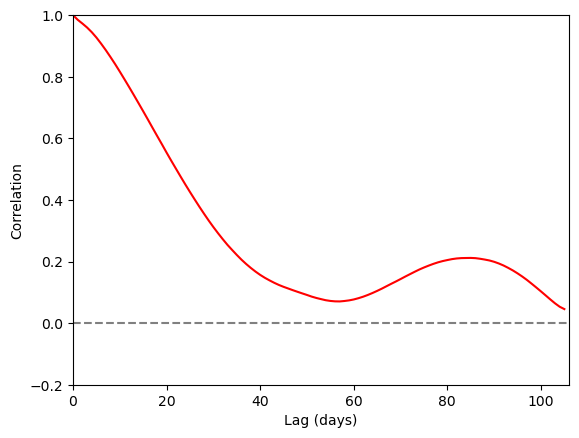

In [148]:
fig, ax = plt.subplots()

#ax.plot(corr, color="k")
N = fft_corr.size
ax.plot(fft_corr[:N//2], color="r")
ax.set_xlim([0, fft_corr[:N//2].size])
ax.set_ylim([-0.2, 1])
ax.set_xlabel("Lag (days)")
ax.set_ylabel("Correlation")
ax.hlines(0, 0, fft_corr[:N//2].size, color="gray", linestyle="--")

plt.show()

## Spatial Filtering

In [6]:
# Window functions
def boxcar(n):
    return np.ones(n)
def cosine(n):
    return np.cos(np.pi*np.arange(n)/n - np.pi/2)
def hanning(n):
    return 0.5 * ( 1 - np.cos(2*np.pi*np.arange(n)/n) )
def tukey(n, alpha):
    w = np.zeros(n)
    w[:int(alpha*n//2)] = 0.5 * ( 1 - np.cos(2*np.pi*np.arange(int(alpha*n//2))/(alpha*n)) )
    w[int(alpha*n//2):n//2] = np.ones(n//2 - int(alpha*n//2))
    w[n//2:] = np.flip(w[:n//2])
    return w

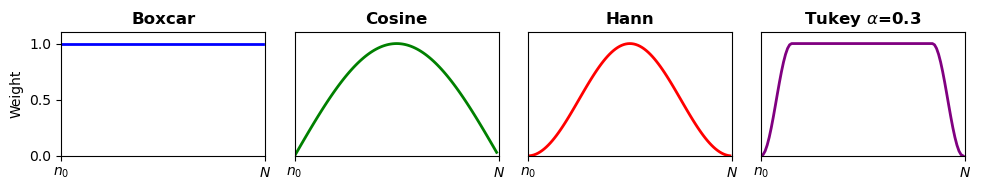

In [7]:
fig = plt.figure(figsize=(10,2))
n = 100

ax = fig.add_subplot(1,4,1)
ax.plot(boxcar(n), 'b', linewidth=2)
ax.set_ylim([0,1.1])
ax.set_xlim([0,n])
ax.set_title("Boxcar", fontweight="bold")
ax.set_ylabel("Weight")
ax.set_xticks([0, n])
ax.set_xticklabels([r"$n_0$", r"$N$"])

ax = fig.add_subplot(1,4,2)
ax.plot(cosine(n), 'g', linewidth=2)
ax.set_ylim([0,1.1])
ax.set_xlim([0,n])
ax.set_yticks([])
ax.set_title("Cosine", fontweight="bold")
ax.set_xticks([0, n])
ax.set_xticklabels([r"$n_0$", r"$N$"])

ax = fig.add_subplot(1,4,3)
ax.plot(hanning(n), 'r', linewidth=2)
ax.set_ylim([0,1.1])
ax.set_xlim([0,n])
ax.set_yticks([])
ax.set_title("Hann", fontweight="bold")
ax.set_xticks([0, n])
ax.set_xticklabels([r"$n_0$", r"$N$"])

ax = fig.add_subplot(1,4,4)
ax.plot(tukey(100, 0.3), 'purple', linewidth=2)
ax.set_ylim([0,1.1])
ax.set_xlim([0,n])
ax.set_yticks([])
ax.set_title(r"Tukey $\alpha$=0.3", fontweight="bold")
ax.set_xticks([0, n])
ax.set_xticklabels([r"$n_0$", r"$N$"])

plt.tight_layout()
plt.show()

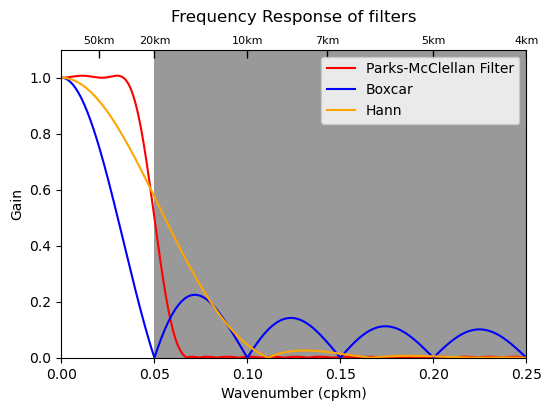

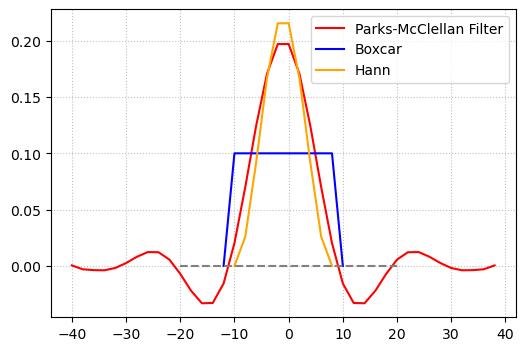

In [20]:
fig, ax = plt.subplots(figsize=(6,4))

fs = 2**(-1)
fac = 4
filtn = int(20/2)
pmf = scipy.signal.remez(int(filtn*fac), [0, 30**(-1), 15**(-1), 0.5*fs], [1, 0], fs=fs)
#pmf = pmf[1:-1]
pmf /= pmf.sum()
w,h = scipy.signal.freqz(pmf, [1], worN=5000, fs=fs)
ax.plot(w,abs(h),"r")

filtn = int(20/2)
boxcar = np.ones(filtn)/filtn
w,h = scipy.signal.freqz(boxcar, [1], worN=5000, fs=fs)
ax.plot(w,abs(h), "b")

filtn = int(20/2)
hann = scipy.signal.windows.hann(filtn)/scipy.signal.windows.hann(filtn).sum()
w,h = scipy.signal.freqz(hann, [1], worN=5000, fs=fs)
ax.plot(w,abs(h), "orange")

# Shaded area
ax.fill_between(np.linspace(20**(-1), 0.25,2), np.ones(2)*0, np.ones(2)*1.1, color="black", alpha=0.4, edgecolor=None)

ax.set_xlim([0, 0.25])
ax.set_ylim([0, 1.1])
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Gain")

ticks = [0.02, 0.05, 0.1, 7**(-1), 0.2, 0.25]
for t in ticks:
    ax.text(t, 1.13, "{:.0f}km".format(t**(-1)), fontsize=8, horizontalalignment="center", verticalalignment="center")
    ax.vlines(t, 1.07, 1.15, "black", linewidth=1)

ax.legend(["Parks-McClellan Filter", "Boxcar", "Hann"])

ax.set_title("Frequency Response of filters", pad=20)
plt.show()


fig, ax = plt.subplots(figsize=(6,4))

N = pmf.size
ax.plot((np.arange(N)-N//2)*fs**(-1), pmf, "r")

N = boxcar.size + 2
ax.plot((np.arange(N)-N//2)*fs**(-1), [0]+boxcar.tolist()+[0], "b")

N = hann.size
ax.plot((np.arange(N)-N//2)*fs**(-1), hann, "orange")
#ax.set_ylim([-0.01, 0.04])

ax.grid(which="major", alpha=0.8, linestyle=":")
ax.hlines(0, -20, 20, color="gray", linestyle="--")

ax.legend(["Parks-McClellan Filter", "Boxcar", "Hann"])
#ax.set_xlim([-20, 20])
plt.show()

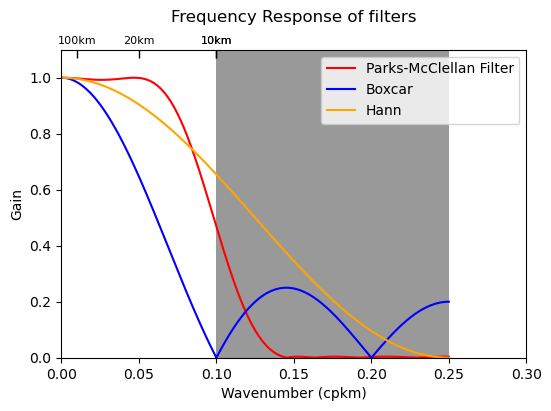

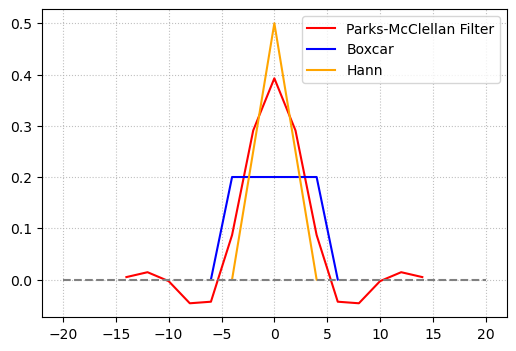

In [35]:
fig, ax = plt.subplots(figsize=(6,4))
goal_km = 10

fs = 2**(-1)
fac = 3
filtn = int(goal_km/2)
pmf = scipy.signal.remez(int(filtn*fac), [0, 18**(-1), 7**(-1), 0.5*fs], [1, 0], fs=fs)
#pmf = pmf[1:-1]
pmf /= pmf.sum()
w,h = scipy.signal.freqz(pmf, [1], worN=5000, fs=fs)
ax.plot(w,abs(h),"r")

filtn = int(goal_km/2)
boxcar = np.ones(filtn)/filtn
w,h = scipy.signal.freqz(boxcar, [1], worN=5000, fs=fs)
ax.plot(w,abs(h), "b")

filtn = int(goal_km/2)
hann = scipy.signal.windows.hann(filtn)/scipy.signal.windows.hann(filtn).sum()
w,h = scipy.signal.freqz(hann, [1], worN=5000, fs=fs)
ax.plot(w,abs(h), "orange")

# Shaded area
ax.fill_between(np.linspace(goal_km**(-1), 0.25,2), np.ones(2)*0, np.ones(2)*1.1, color="black", alpha=0.4, edgecolor=None)

ax.set_xlim([0, 0.3])
ax.set_ylim([0, 1.1])
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Gain")

ticks = [0.01, goal_km**(-1), 0.05, 0.1]
for t in ticks:
    ax.text(t, 1.13, "{:.0f}km".format(t**(-1)), fontsize=8, horizontalalignment="center", verticalalignment="center")
    ax.vlines(t, 1.07, 1.15, "black", linewidth=1)

ax.legend(["Parks-McClellan Filter", "Boxcar", "Hann"])

ax.set_title("Frequency Response of filters", pad=20)
plt.show()


fig, ax = plt.subplots(figsize=(6,4))

N = pmf.size
ax.plot((np.arange(N)-N//2)*fs**(-1), pmf, "r")

N = boxcar.size + 2
ax.plot((np.arange(N)-N//2)*fs**(-1), [0]+boxcar.tolist()+[0], "b")

N = hann.size
ax.plot((np.arange(N)-N//2)*fs**(-1), hann, "orange")
#ax.set_ylim([-0.01, 0.04])

ax.grid(which="major", alpha=0.8, linestyle=":")
ax.hlines(0, -20, 20, color="gray", linestyle="--")

ax.legend(["Parks-McClellan Filter", "Boxcar", "Hann"])
#ax.set_xlim([-20, 20])
plt.show()

Parks-McClellan 90\%-gain wavelength: 26.18km
Parks-McClellan halfgain wavelength: 20.06km


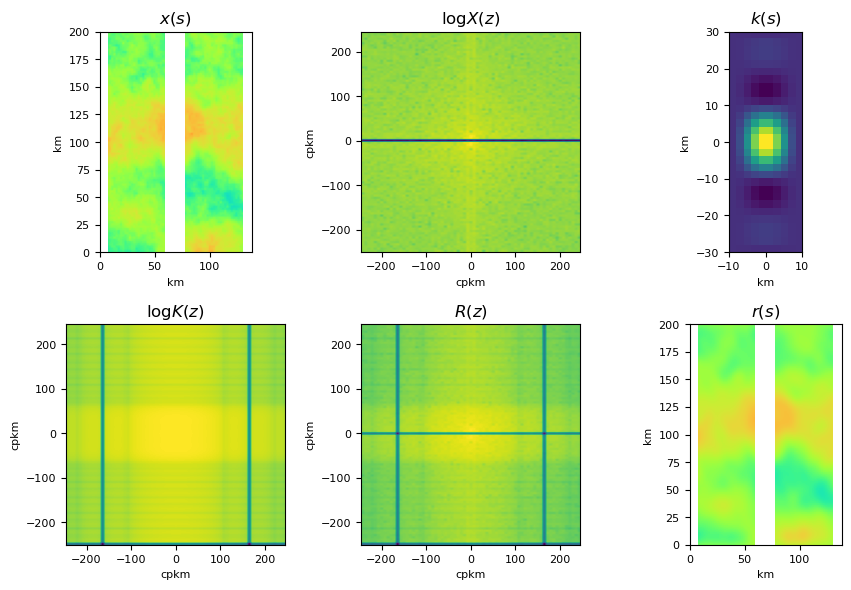

In [124]:
mask = np.logical_and(karin2[500][21]["latitude"][:,0]>36, karin2[500][21]["latitude"][:,0]<42)
x = karin2[500][21]["ssh_mss"][mask][:100,:70]
#x[nanmask] = 0
nanmask = np.isnan(x)

# Interpolate gaps
for i in range(x.shape[0]):
    x[i,nanmask[i,:]] = np.interp(np.flatnonzero(nanmask[i,:]), np.flatnonzero(~nanmask[i,:]), x[i,~nanmask[i,:]])

x = scipy.signal.detrend(x, axis=0)

F_ssh_mean = scipy.fft.fft2(x)
N, M = F_ssh_mean.shape
F_ssh_mean = scipy.fft.fftshift(F_ssh_mean)
F_freq1, F_freq2 = scipy.fft.fftfreq(N, 2), scipy.fft.fftfreq(M, 2)
F_freq1, F_freq2 = scipy.fft.fftshift(F_freq1), scipy.fft.fftshift(F_freq2)
F_freq1 *= 1000
F_freq2 *= 1000

lowF_ssh_mean = np.zeros(F_ssh_mean.shape)
#lowF_ssh_mean[700:1852, 700:1500] = F_ssh_mean[700:1852, 700:1500]
#lowF_ssh_mean[:1000, :800] = F_ssh_mean[:1000, :800]
# 
filter_size_km = 20
filter_size = int(filter_size_km/2)
# Hann
#kern = np.outer(np.hanning(filter_size), np.hanning(filter_size))
#kern[(N//2-filter_size//2):(N//2+filter_size//2), (M//2-filter_size//2):(M//2+filter_size//2)] = np.outer(np.hanning(filter_size), np.hanning(filter_size))
# Boxcar
#kern[(N//2-filter_size//2):(N//2+filter_size//2), (M//2-filter_size//2):(M//2+filter_size//2)] = np.ones((filter_size, filter_size))
# Gaussian
#kern[(N//2-filter_size*4//2):(N//2+filter_size*4//2), (M//2-filter_size*4//2):(M//2+filter_size*4//2)] = np.outer(scipy.signal.windows.gaussian(filter_size*4, filter_size*0.68), 
#                                                                                                                  scipy.signal.windows.gaussian(filter_size*4, filter_size*0.68))
# PM Filter
#kern[(N//2-filter_size*4//2):(N//2+filter_size*4//2), (M//2-filter_size*4//2):(M//2+filter_size*4//2)] = np.outer(scipy.signal.windows.gaussian(filter_size*4, filter_size*0.68), 
#                                                                                                                  scipy.signal.windows.gaussian(filter_size*4, filter_size*0.68))
filter_tailfactor = 3
pmf = scipy.signal.remez(int(filter_size*filter_tailfactor), [0, 30**(-1), 15**(-1), 0.5*fs], [1, 0], fs=fs)
#pmf = pmf[1:-1]
pmf /= pmf.sum()
#kern[(N//2-filter_size//2):(N//2+filter_size//2), (M//2-filter_size//2):(M//2+filter_size//2)] = np.outer(pmf, pmf)
#kern = np.outer(pmf, pmf)

# Combine hann and PM filter
kern = np.outer(pmf, np.hanning(filter_size))

kern /= kern.sum()
F_kern = scipy.fft.fftshift(scipy.fft.fft2(kern, s=F_ssh_mean.shape))


# Determine location in km at 0.5 gain
w,h = scipy.signal.freqz(pmf, [1], worN=5000, fs=fs)
arg_halfgain = np.argmin(abs(abs(h)-0.9))
cuttoff_freq = w[arg_halfgain]
cuttoff_wavelength_km = cuttoff_freq**(-1)
print("Parks-McClellan 90\%-gain wavelength: {:.2f}km".format(cuttoff_wavelength_km))
arg_halfgain = np.argmin(abs(abs(h)-0.5))
cuttoff_freq = w[arg_halfgain]
cuttoff_wavelength_km = cuttoff_freq**(-1)
print("Parks-McClellan halfgain wavelength: {:.2f}km".format(cuttoff_wavelength_km))

lowF_ssh_mean = F_ssh_mean * F_kern
#lowF_ssh_mean = scipy.fft.ifftshift(lowF_ssh_mean)
low_ssh_mean = scipy.fft.ifftshift(lowF_ssh_mean)
low_ssh_mean = np.real(scipy.fft.ifft2(low_ssh_mean))
low_ssh_mean[nanmask] = np.nan

r = scipy.signal.fftconvolve(x, kern, mode="same")
r[nanmask] = np.nan

fig = plt.figure(figsize=(9,6))

ax = fig.add_subplot(2,3,1)
N, M = x.shape
plotextent = [0, M*2, 0, N*2]
x_plot = x
x_plot[nanmask] = np.nan
ax.imshow(x_plot, extent=plotextent, origin="lower", cmap="turbo", vmin=-0.25, vmax=0.25)
ax.set_title(r"$x(s)$")
ax.tick_params(axis='both', labelsize=8)
ax.set_xlabel("km", fontsize=8)
ax.set_ylabel("km", fontsize=8)

ax = fig.add_subplot(2,3,2)
ax.imshow(np.log10(abs(F_ssh_mean)), extent=[F_freq2[0], F_freq2[-1], F_freq1[0], F_freq1[-1]], origin="lower")
ax.set_title(r"log$X(z)$")
ax.tick_params(axis='both', labelsize=8)
ax.set_xlabel("cpkm", fontsize=8)
ax.set_ylabel("cpkm", fontsize=8)

ax = fig.add_subplot(2,3,3)
ax.imshow(kern, extent=[-filter_size_km/2, filter_size_km/2,
                         -filter_size_km/2*filter_tailfactor, filter_size_km/2*filter_tailfactor], origin="lower")#, vmin=2, vmax=4)
ax.set_title(r"$k(s)$")
ax.tick_params(axis='both', labelsize=8)
ax.set_xlabel("km", fontsize=8)
ax.set_ylabel("km", fontsize=8)
#ax.set_xlim([-30*filter_tailfactor, 30*filter_tailfactor])
#ax.set_ylim([-30*filter_tailfactor, 30*filter_tailfactor])

ax = fig.add_subplot(2,3,4)
ax.imshow(np.log10(abs(F_kern)), extent=[F_freq2[0], F_freq2[-1], F_freq1[0], F_freq1[-1]], origin="lower")#, vmin=2, vmax=4)
ax.set_title(r"log$K(z)$")
ax.tick_params(axis='both', labelsize=8)
ax.set_xlabel("cpkm", fontsize=8)
ax.set_ylabel("cpkm", fontsize=8)

ax = fig.add_subplot(2,3,5)
ax.imshow(np.log10(abs(lowF_ssh_mean)), extent=[F_freq2[0], F_freq2[-1], F_freq1[0], F_freq1[-1]], origin="lower")
ax.set_title(r"$R(z)$")
ax.tick_params(axis='both', labelsize=8)
ax.set_xlabel("cpkm", fontsize=8)
ax.set_ylabel("cpkm", fontsize=8)

ax = fig.add_subplot(2,3,6)
sc=ax.imshow(r, extent=plotextent, origin="lower", cmap="turbo", vmin=-0.25, vmax=0.25)
ax.set_title(r"$r(s)$")
ax.tick_params(axis='both', labelsize=8)
ax.set_xlabel("km", fontsize=8)
ax.set_ylabel("km", fontsize=8)

plt.tight_layout()
plt.show()

In [248]:
AOI = [125, 135, 35, 42]
karin2 = karin_l2b_filtering(karin2,AOI,20,2,detrend=False)

Cycle: 557


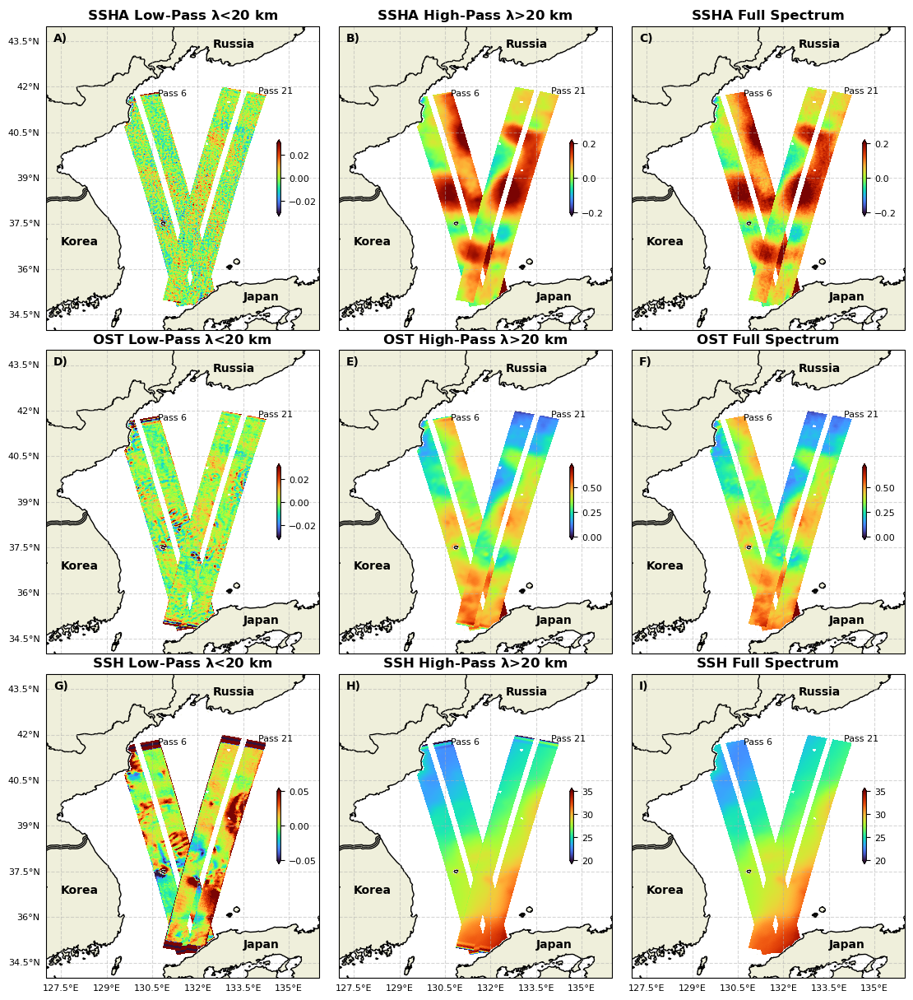

In [27]:
AOI = [128, 135, 35, 43]

c = list(karin2.keys())[1]
print("Cycle:",c)

fig = plt.figure(figsize=(11,12))

#########################################################


ax = fig.add_subplot(3,3,1, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_mss_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.03, vmax=0.03)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "A)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title(r"SSHA Low-Pass $\mathbf{\lambda}$<20 km", fontweight="bold")


ax = fig.add_subplot(3,3,2, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_mss_long"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.2, vmax=0.2)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "B)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title(r"SSHA High-Pass $\mathbf{\lambda}$>20 km", fontweight="bold")


ax = fig.add_subplot(3,3,3, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_mss_full"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.2, vmax=0.2)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "C)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSHA Full Spectrum", fontweight="bold")


#########################################################


ax = fig.add_subplot(3,3,4, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.03, vmax=0.03)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "D)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title(r"OST Low-Pass $\mathbf{\lambda}$<20 km", fontweight="bold")


ax = fig.add_subplot(3,3,5, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_long"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=0, vmax=0.7)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "E)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title(r"OST High-Pass $\mathbf{\lambda}$>20 km", fontweight="bold")


ax = fig.add_subplot(3,3,6, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_full"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=0, vmax=0.7)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "F)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST Full Spectrum", fontweight="bold")



#########################################################


ax = fig.add_subplot(3,3,7, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_ellip_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.05, vmax=0.05)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "G)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title(r"SSH Low-Pass $\mathbf{\lambda}$<20 km", fontweight="bold")


ax = fig.add_subplot(3,3,8, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_ellip_long"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=20, vmax=35)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "H)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title(r"SSH High-Pass $\mathbf{\lambda}$>20 km", fontweight="bold")


ax = fig.add_subplot(3,3,9, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.left_labels = False
gl.ylabel_style = {'size': 8}
gl.xlabel_style = {'size': 8}
ax.add_feature(cartopy.feature.BORDERS)

# KaRIn
for p in karin2[c].keys():
    key = "ssh_ellip_full"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=20, vmax=35)

cb = fig.colorbar(sc, orientation="vertical", shrink=0.25, pad=-0.15, extend="both")
cb.ax.tick_params(labelsize=8)

ax.text(134.0, 41.8, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "I)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
ax.text(127.5, 36.8, "Korea", fontweight="bold")
ax.text(132.5, 43.3, "Russia", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSH Full Spectrum", fontweight="bold")

plt.tight_layout(pad=0.15)
plt.show()


In [4]:
EXTERNAL_DATA_PATH = "D:\MasterThesis\GEBCO\*n45*.nc"

data_path = glob.glob(EXTERNAL_DATA_PATH)
file = nc.Dataset(data_path[0], "r")
keys = file.variables.keys()
gebco = {}
for k in keys:
    gebco[k] = np.ma.getdata(file.variables[k][:])
gebco_extent = [gebco["lon"].min(), gebco["lon"].max(), gebco["lat"].min(), gebco["lat"].max()]

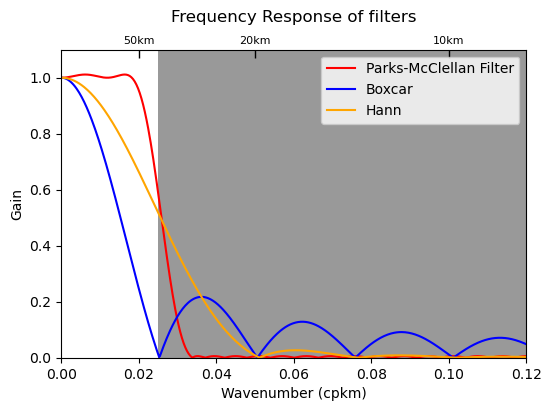

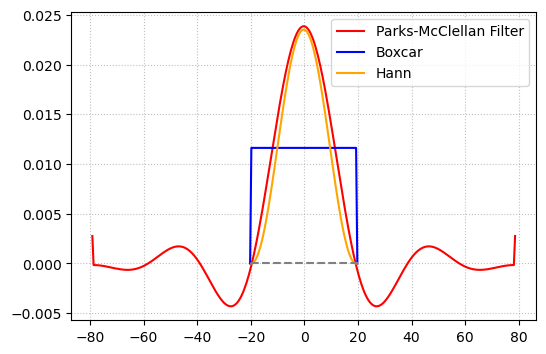

In [187]:
fig, ax = plt.subplots(figsize=(6,4))

goal = 40
ds = 0.46
fs = ds**(-1)
fac = 4
filtn = int(goal/ds)
pmf = scipy.signal.remez(int(filtn*fac), [0, 55**(-1), 30**(-1), 0.5*fs], [1, 0], fs=fs)
#pmf = pmf[1:-1]
pmf /= pmf.sum()
w,h = scipy.signal.freqz(pmf, [1], worN=5000, fs=fs)
ax.plot(w,abs(h),"r")

filtn = int(goal/ds)
boxcar = np.ones(filtn)/filtn
w,h = scipy.signal.freqz(boxcar, [1], worN=5000, fs=fs)
ax.plot(w,abs(h), "b")

filtn = int(goal/ds)
hann = scipy.signal.windows.hann(filtn)/scipy.signal.windows.hann(filtn).sum()
w,h = scipy.signal.freqz(hann, [1], worN=5000, fs=fs)
ax.plot(w,abs(h), "orange")

# Shaded area
ax.fill_between(np.linspace(goal**(-1), 0.12,2), np.ones(2)*0, np.ones(2)*1.1, color="black", alpha=0.4, edgecolor=None)

ax.set_xlim([0, 0.12])
ax.set_ylim([0, 1.1])
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Gain")

ticks = [0.02, 0.05, 0.1]
for t in ticks:
    ax.text(t, 1.13, "{:.0f}km".format(t**(-1)), fontsize=8, horizontalalignment="center", verticalalignment="center")
    ax.vlines(t, 1.07, 1.15, "black", linewidth=1)

ax.legend(["Parks-McClellan Filter", "Boxcar", "Hann"])

ax.set_title("Frequency Response of filters", pad=20)
plt.show()


fig, ax = plt.subplots(figsize=(6,4))

N = pmf.size
ax.plot((np.arange(N)-N//2)*fs**(-1), pmf, "r")

N = boxcar.size + 2
ax.plot((np.arange(N)-N//2)*fs**(-1), [0]+boxcar.tolist()+[0], "b")

N = hann.size
ax.plot((np.arange(N)-N//2)*fs**(-1), hann, "orange")
#ax.set_ylim([-0.01, 0.04])

ax.grid(which="major", alpha=0.8, linestyle=":")
ax.hlines(0, -20, 20, color="gray", linestyle="--")

ax.legend(["Parks-McClellan Filter", "Boxcar", "Hann"])
#ax.set_xlim([-20, 20])
plt.show()

In [188]:
# Filter GEBCO data
x = gebco["elevation"]

# Setup kernel for filtering

filt_length_km = 40
ds = 0.46
fs = ds**(-1)
fac = 4
filtn = int(filt_length_km/ds)
if filt_length_km == 20:
    pm_kern = scipy.signal.remez(int(filtn*fac), [0, 30**(-1), 15**(-1), 0.5*fs], [1, 0], fs=fs)
elif filt_length_km == 40:
    pm_kern = scipy.signal.remez(int(filtn*fac), [0, 55**(-1), 30**(-1), 0.5*fs], [1, 0], fs=fs)
pm_hann = np.hanning(filtn)
pm_box = np.ones(filtn)
# Combine hann and PM filter
kern = np.outer(pm_kern, pm_kern)
kern /= kern.sum()
r = scipy.signal.fftconvolve(x, kern, mode="same")

gebco["long"] = r
gebco["short"] = gebco["elevation"] - r

Cycle 501


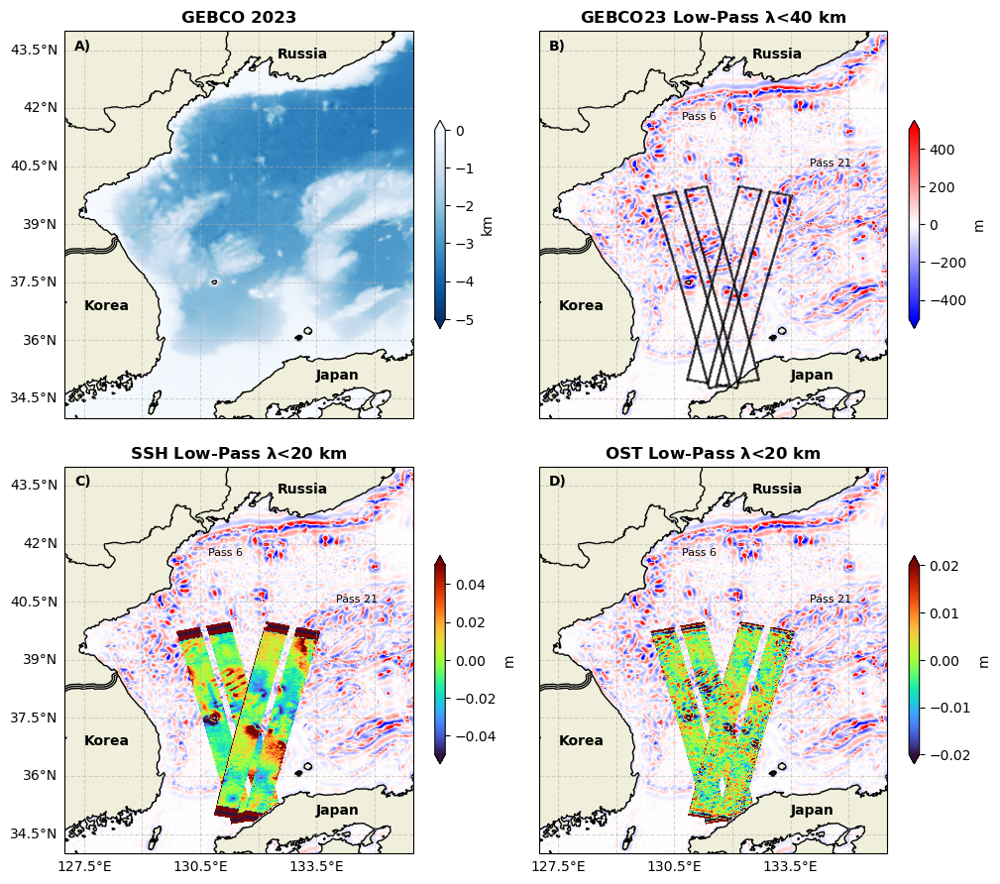

In [287]:
AOI = [128, 135, 35, 43]

c = list(karin2.keys())[1]
print("Cycle",c)

fig = plt.figure(figsize=(10,9))

ax = fig.add_subplot(2,2,1, projection=ccrs.PlateCarree())
detrend = False
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS)

# Gebco
sc=ax.imshow(gebco["elevation"]/1e3, origin="lower", extent=gebco_extent, cmap="Blues_r", vmin=-5, vmax=0)

fig.colorbar(sc, label=r"km", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

ax.text(AOI[0]-0.75, AOI[3]+0.5, "A)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("GEBCO 2023", fontweight="bold")


ax = fig.add_subplot(2,2,2, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# Gebco short wavelength
sc=ax.imshow(gebco["short"], vmin=-500, vmax=500, origin="lower", cmap="bwr", extent=gebco_extent)

fig.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

for p in [6, 21]:
    key = "ssh_ellip_short"
    thickness = 0.1
    if p == 6:
        color = "k"
    elif p == 21:
        color = "k"

    # edges
    ax.scatter(karin2[c][p][key]["lon"][:,1], karin2[c][p][key]["lat"][:,1], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][:,61], karin2[c][p][key]["lat"][:,61], thickness, color)
    
    # center
    ax.scatter(karin2[c][p][key]["lon"][:,26], karin2[c][p][key]["lat"][:,26], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][:,36], karin2[c][p][key]["lat"][:,36], thickness, color)

    # ends
    ax.scatter(karin2[c][p][key]["lon"][0,1:27], karin2[c][p][key]["lat"][0,1:27], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][-1,1:27], karin2[c][p][key]["lat"][-1,1:27], thickness, color)
    
    ax.scatter(karin2[c][p][key]["lon"][0,36:62], karin2[c][p][key]["lat"][0,36:62], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][-1,36:62], karin2[c][p][key]["lat"][-1,36:62], thickness, color)

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "B)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("GEBCO23 Low-Pass $\mathbf{\lambda}}$<40 km", fontweight="bold")


ax = fig.add_subplot(2,2,3, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cartopy.feature.BORDERS)

ax.imshow(gebco["short"], vmin=-500, vmax=500, origin="lower", cmap="bwr", extent=gebco_extent)
# KaRIn
for p in karin2[c].keys():
    key = "ssh_ellip_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.05, vmax=0.05)

fig.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "C)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSH Low-Pass $\mathbf{\lambda}}$<20 km", fontweight="bold")


ax = fig.add_subplot(2,2,4, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
ax.add_feature(cartopy.feature.BORDERS)

ax.imshow(gebco["short"], vmin=-500, vmax=500, origin="lower", cmap="bwr", extent=gebco_extent)
# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.02, vmax=0.02)

fig.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "D)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST Low-Pass $\mathbf{\lambda}}$<20 km", fontweight="bold")

plt.tight_layout(pad=0.0)
plt.show()


NameError: name 'gebco' is not defined

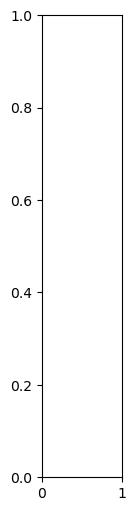

In [24]:
fig = plt.figure(figsize=(6,6))

ylims = [36, 39]

ax = fig.add_subplot(1,5,1)

p = 6
key = "ssh_mss_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]

shape = lat.shape
fn = scipy.interpolate.RegularGridInterpolator((gebco["lon"], gebco["lat"]), gebco["elevation"].T, method="cubic")
intp_val = fn(np.c_[lon.reshape(-1), lat.reshape(-1)]).reshape(lat.shape)
#intp_val = np.flipud(np.fliplr(intp_val))

sc=ax.imshow(intp_val/1e3, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="Blues_r", vmin=-3, vmax=0)
ax.set_xticks([])
ax.set_ylim(ylims)
ax.set_title("GEBCO", fontweight="bold")
ax.set_ylabel("Latitude (deg N)")

fig.colorbar(sc, label=r"km", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")


ax = fig.add_subplot(1,5,2)

p = 6
key = "ssh_mss_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]

shape = lat.shape
fn = scipy.interpolate.RegularGridInterpolator((gebco["lon"], gebco["lat"]), gebco["short"].T, method="cubic")
intp_val = fn(np.c_[lon.reshape(-1), lat.reshape(-1)]).reshape(lat.shape)
#intp_val = np.flipud(np.fliplr(intp_val))

sc=ax.imshow(intp_val, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="bwr", vmin=-500, vmax=500)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("GEBCO \n $\lambda<40km$", fontweight="bold")

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

ax = fig.add_subplot(1,5,3)

p = 6
key = "ssh_ellip_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]
sc=ax.imshow(ssh*100, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="turbo", vmin=-5, vmax=5)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("SSH \n $\lambda<20km$", fontweight="bold")

fig.colorbar(sc, label=r"cm", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

ax = fig.add_subplot(1,5,4)

p = 6
key = "ssh_geoid_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]
sc=ax.imshow(ssh*100, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="turbo", vmin=-5, vmax=5)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("OST \n $\lambda<20km$", fontweight="bold")

fig.colorbar(sc, label=r"cm", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

ax = fig.add_subplot(1,5,5)

p = 6
key = "ssh_mss_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]
sc=ax.imshow(ssh*100, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="turbo", vmin=-5, vmax=5)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("SSHA \n $\lambda<20km$", fontweight="bold")

fig.colorbar(sc, label=r"cm", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

plt.tight_layout()
plt.show()

## Model Comparison

In [4]:

EXTERNAL_DATA_PATH = "D:/MasterThesis/PT1H-m/*"

all_files = glob.glob(EXTERNAL_DATA_PATH)

file = nc.Dataset(all_files[0], "r")

CMEMS = {}
for k in file.variables.keys():
    CMEMS[k] = np.ma.getdata(file.variables[k][:])

In [5]:
AOI = [128, 135, 35, 43]

In [6]:
# Filter data
lon_mask = np.logical_and(CMEMS["longitude"]>AOI[0], CMEMS["longitude"]<AOI[1])
lat_mask = np.logical_and(CMEMS["latitude"]>AOI[2], CMEMS["latitude"]<AOI[3])

model_zos = CMEMS["zos"][:,0,:,:] # sea_surface_height_above_geoid aka OST
model_zos = model_zos[:,lat_mask,:]
model_zos = model_zos[:,:,lon_mask]
model_zos[model_zos>1e10] = np.nan


model_ssc = np.sqrt( CMEMS["uo"][:,0,:,:]**2 + CMEMS["vo"][:,0,:,:]**2 ) # SSC m/s
model_ssc = model_ssc[:,lat_mask,:]
model_ssc = model_ssc[:,:,lon_mask]
model_ssc[model_ssc>1e10] = np.nan


model_lat, model_lon = np.meshgrid(CMEMS["latitude"][lat_mask], CMEMS["longitude"][lon_mask])


C:\Users\bjark\AppData\Local\Temp\ipykernel_2852\2030611377.py:11: RuntimeWarning: overflow encountered in square
  model_ssc = np.sqrt( CMEMS["uo"][:,0,:,:]**2 + CMEMS["vo"][:,0,:,:]**2 ) # SSC m/s


Cycle 500
Date model 2023-04-24 12:00:00
Date SWOT 2023-04-24 11:33:57.165446


C:\Users\bjark\AppData\Local\Temp\ipykernel_2852\1245002347.py:199: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0)


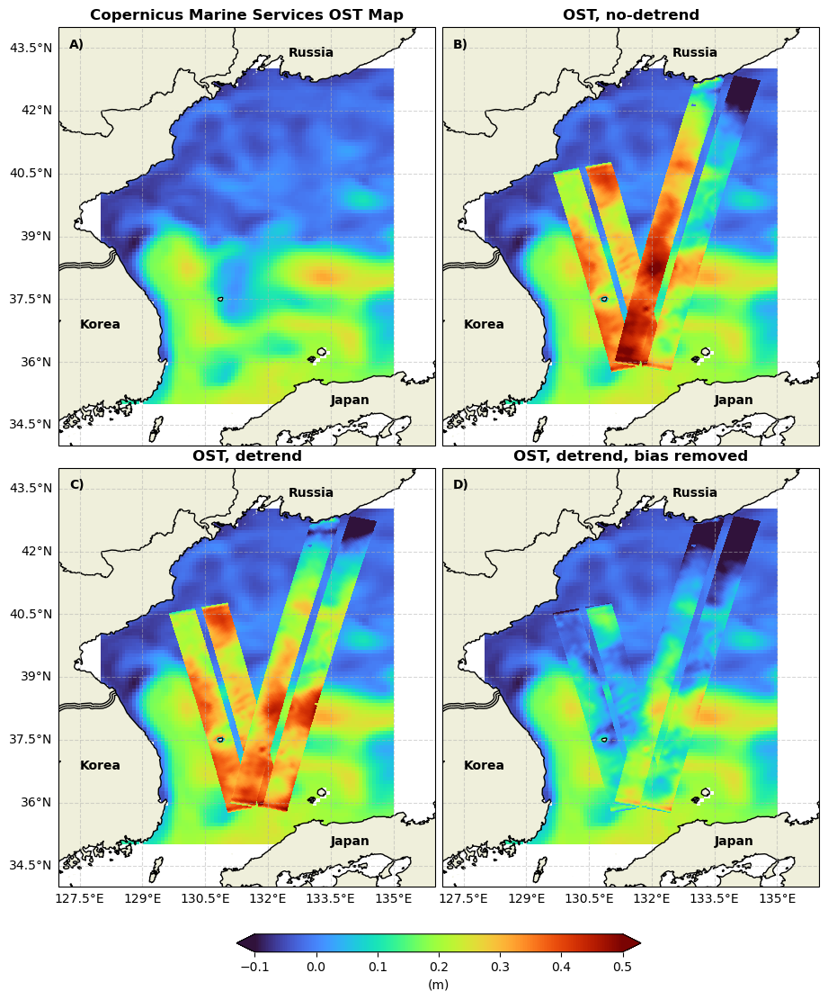

In [8]:

c = 500
p = 21
print("Cycle",c)

print("Date model", datetime.datetime(1950,1,1) + datetime.timedelta(hours=int(CMEMS["time"].mean())))
print("Date SWOT",datetime.datetime(2000,1,1) + datetime.timedelta(seconds=np.nanmedian(karin2[c][p]["time"])))

cmap_lims = [-0.1, 0.5]

fig = plt.figure(figsize=(9,10))

###################################

ax = fig.add_subplot(2,2,1, projection=ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS)

# Gebco
sc=ax.imshow(model_zos.mean(axis=0), origin="lower", extent=AOI, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])


ax.text(AOI[0]-0.75, AOI[3]+0.5, "A)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("Copernicus Marine Services OST Map", fontweight="bold")


###################################

ax = fig.add_subplot(2,2,2, projection=ccrs.PlateCarree())

karin2 = karin_l2b_filtering(karin2,[129, 134, 36, 43],20,2,detrend=False)

gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
gl.left_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS)

# Gebco
sc=ax.imshow(model_zos.mean(axis=0), origin="lower", extent=AOI, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])

# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_long"
    #mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = np.copy(karin2[c][p][key]["ssh"])
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])


ax.text(AOI[0]-0.75, AOI[3]+0.5, "B)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST, no-detrend", fontweight="bold")


###################################

ax = fig.add_subplot(2,2,3, projection=ccrs.PlateCarree())

karin2 = karin_l2b_filtering(karin2,[129, 134, 36, 43],20,2,detrend=True)

gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = True
gl.bottom_labels = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS)

# Gebco
sc=ax.imshow(model_zos.mean(axis=0), origin="lower", extent=AOI, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])

# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_long"
    #mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = np.copy(karin2[c][p][key]["ssh"])
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])


ax.text(AOI[0]-0.75, AOI[3]+0.5, "C)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST, detrend", fontweight="bold")


###################################
ax = fig.add_subplot(2,2,4, projection=ccrs.PlateCarree())

karin2 = karin_l2b_filtering(karin2,[129, 134, 36, 43],20,2,detrend=True)

gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS)

# Gebco
sc=ax.imshow(model_zos.mean(axis=0), origin="lower", extent=AOI, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])

# KaRIn
"""
for p in karin2[c].keys():
    key = "ssh_geoid_long"

    for side in ["left", "right"]:
        match side:
            case "left":
                ssh = karin2[c][p][key]["ssh"][:,:35]
                lat = karin2[c][p][key]["lat"][:,:35]
                lon = karin2[c][p][key]["lon"][:,:35]
            case "right":
                ssh = karin2[c][p][key]["ssh"][:,40:]
                lat = karin2[c][p][key]["lat"][:,40:]
                lon = karin2[c][p][key]["lon"][:,40:]

        #ssh = np.copy(karin2[c][p][key]["ssh"])
                
        args_swot_mean = np.argwhere( np.sqrt( (lat - lat.mean())**2 + (lon - lon.mean())**2 ) < 0.5)
        swot_nanmedian = np.nanmedian(ssh[args_swot_mean])

        args_model_mean = np.argwhere( np.sqrt( (model_lat - lat.mean())**2 + (model_lon - lon.mean())**2 ) < 0.5)
        model_nanmedian = np.nanmedian(model_zos.mean(axis=0)[args_model_mean])

        bias = swot_nanmedian - model_nanmedian
        ssh -= bias

        #ssh_mean = np.nanmean(ssh)
        #nanmask = np.isnan(ssh)
        #ssh[nanmask] = 0
        #ssh = scipy.signal.detrend(ssh, axis=0)
        #ssh += ssh_mean
        #ssh[nanmask] = np.nan

        sc=ax.pcolormesh(lon, lat, ssh, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])
"""
# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_long"
    #mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = np.copy(karin2[c][p][key]["ssh"])
    bias = np.nanmean(ssh) - np.nanmean(model_zos)
    ssh -= bias

    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=cmap_lims[0], vmax=cmap_lims[1])


ax.text(AOI[0]-0.75, AOI[3]+0.5, "D)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST, detrend, bias removed", fontweight="bold")

cax = fig.add_axes([0.28, -0.05, 0.5, 0.02])  # [left, bottom, width, height]
cb = plt.colorbar(sc, cax=cax, orientation="horizontal", shrink=0.4, pad=0.5, extend="both")
cb.set_label('(m)')

plt.tight_layout(pad=0)
plt.show()


In [25]:
c = 500
p = 21

bias_corr = True

model_z_mean = model_zos.mean(axis=0).T

karin2 = karin_l2b_filtering(karin2,[129, 134, 36, 42],20,2,detrend=True)
key = "ssh_geoid_long"

# KaRIn
for p in karin2[c].keys():
    print("Pass: {}".format(p))
    
    #mask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    ssh = np.copy(karin2[c][p][key]["ssh"])
    lat = np.copy(karin2[c][p][key]["lat"])
    lon = np.copy(karin2[c][p][key]["lon"])

    #ssh = np.copy(karin2[c][p][key]["ssh"])
            
    #args_swot_mean = np.argwhere( np.sqrt( (lat - lat.mean())**2 + (lon - lon.mean())**2 ) < 0.5)
    #swot_nanmedian = np.nanmedian(ssh[args_swot_mean])

    #args_model_mean = np.argwhere( np.sqrt( (model_lat - lat.mean())**2 + (model_lon - lon.mean())**2 ) < 0.5)
    #model_nanmedian = np.nanmedian(model_z_mean[args_model_mean])

    #bias = swot_nanmedian - model_nanmedian
    #ssh -= bias



    fn = scipy.interpolate.LinearNDInterpolator(np.array([lon.reshape(-1),lat.reshape(-1)]).T, ssh.reshape(-1))
    grid_integrated_karin = fn(model_lon, model_lat)

    if bias_corr == True:
        # Bias correction
        integrated_karin = grid_integrated_karin
        mask = np.logical_and( (~np.isnan(integrated_karin)), (~np.isnan(model_z_mean)) )
        bias = np.nanmean(integrated_karin[mask]) - np.nanmean(model_z_mean[mask])
        integrated_karin -= bias
    else:
        ssh -= 0

    integrated_karin = grid_integrated_karin
    mask = np.logical_and( (~np.isnan(integrated_karin)), (~np.isnan(model_z_mean)) )
    bias = np.nanmean(integrated_karin[mask]) - np.nanmean(model_z_mean[mask])
    print(" Bias: {:.2f} cm".format(bias*100))

    #plt.scatter(grid_lon, grid_lat, 10, grid_integrated_karin)
    #plt.colorbar()

    # Correlation
    mask = np.logical_and(~np.isnan(model_z_mean),~np.isnan(grid_integrated_karin))
    corr = np.corrcoef(model_z_mean[mask].reshape(-1), grid_integrated_karin[mask].reshape(-1))[0,1]
    print(" Corr: {:.2f}".format(corr))
    rms = np.sqrt( np.mean( (model_z_mean[mask].reshape(-1) - grid_integrated_karin[mask].reshape(-1))**2 ) )
    print(" rms: {:.2f} cm".format(rms*100))

Pass: 6
 Bias: -0.00 cm
 Corr: 0.68
 rms: 6.13 cm
Pass: 21
 Bias: -0.00 cm
 Corr: 0.80
 rms: 5.79 cm


In [27]:
# Load gauges

GAUGE_FILES_PATH = "D:\MasterThesis\Gauges\*"
gauge_filenames = glob.glob(GAUGE_FILES_PATH)
gauge_filenames

['D:\\MasterThesis\\Gauges\\h345_JA.nc',
 'D:\\MasterThesis\\Gauges\\h348_JA.nc',
 'D:\\MasterThesis\\Gauges\\h349_JA.nc',
 'D:\\MasterThesis\\Gauges\\h355_JA.nc',
 'D:\\MasterThesis\\Gauges\\h359_JA.nc',
 'D:\\MasterThesis\\Gauges\\h362_JA.nc',
 'D:\\MasterThesis\\Gauges\\h363_JA.nc',
 'D:\\MasterThesis\\Gauges\\h381_VN.nc',
 'D:\\MasterThesis\\Gauges\\h826_SE.nc']

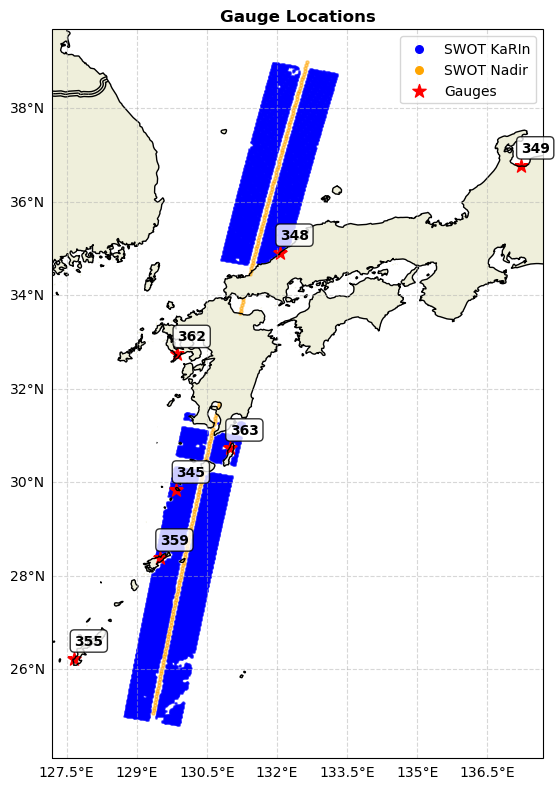

In [130]:

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = True
gl.bottom_labels = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
    
for c in [552]:#gdr.keys():
    for p in [21]:
        lat_mask = np.logical_and(karin2[c][p]["latitude"][:,0]>25,karin2[c][p]["latitude"][:,0]<39)
        ssh = karin2[c][p]["ssh_ellip"][lat_mask]
        lon = karin2[c][p]["longitude"][lat_mask]
        lon[np.isnan(ssh)] = np.nan
        lat = karin2[c][p]["latitude"][lat_mask]
        lat[np.isnan(ssh)] = np.nan
        sc=ax.scatter(lon, lat, 1, "b", alpha=0.5,label="_nolegend_")
ax.scatter([],[],30,"b")

for c in [552]:#gdr.keys():
    for p in [21]:
        lat_mask = np.logical_and(nadir1[c][p]["latitude"]>25,nadir1[c][p]["latitude"]<39) 
        lat_mask = np.logical_and(lat_mask,nadir1[c][p]["surface_classification_flag"]==0) 
        sc=ax.scatter(nadir1[c][p]["longitude"][lat_mask], nadir1[c][p]["latitude"][lat_mask], 5, "orange", alpha=0.5,label="_nolegend_")
ax.scatter([],[],30,"orange")

for i, gauge_filename in enumerate(gauge_filenames):
    if i >= 7:
        continue
    gauge_file = nc.Dataset(gauge_filename, "r")
    keys = gauge_file.variables.keys()
    gauge = {}
    for k in keys:
        gauge[k] = np.ma.getdata(gauge_file[k][:])
    ax.scatter(gauge["lon"], gauge["lat"], 100, "r", marker="*")
    ax.annotate(gauge["uhslc_id"][0], (gauge["lon"], gauge["lat"]), (gauge["lon"], gauge["lat"]+0.3),
                fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
ax.set_title("Gauge Locations", fontweight="bold")

plt.legend(["SWOT KaRIn", "SWOT Nadir", "Gauges"])

plt.tight_layout()
plt.show()

In [72]:
def run_gauge_analysis(gauge_ID, passes):

    # Variables
    REGION_OF_INTEREST = 1
    
    # Load gauges
    # =========================================================================================
    gauge_file = nc.Dataset(gauge_filenames[gauge_ID], "r")
    keys = gauge_file.variables.keys()

    gauge = {}
    for k in keys:
        gauge[k] = np.ma.getdata(gauge_file[k][:])

    gauge["sea_level"] = gauge["sea_level"][0]
    gauge["sea_level"] = gauge["sea_level"] / 1000 # To meters
    gauge["sea_level"][gauge["sea_level"]<-20] = np.nan

    # To datetime
    gauge["datetime"] = np.array([datetime.datetime(1800,1,1) + datetime.timedelta(days=t) for t in gauge["time"]])
    # =========================================================================================

    # Show location of tracks and gauges
    # =========================================================================================
    fig = plt.figure(figsize=(10,4))
    ax = fig.add_subplot(1, 2, 1, projection=ccrs.PlateCarree())
    ax.coastlines(resolution='10m')
    ax.scatter(gauge["lon"], gauge["lat"], 100, "b")
    ax.plot([gauge["lon"],gauge["lon"]], 
            [gauge["lat"]-REGION_OF_INTEREST,gauge["lat"]+REGION_OF_INTEREST], "b")

    for c in [550]:#gdr.keys():
        for p in passes:
            lat_mask = np.logical_and(karin2[c][p]["latitude"][:,0]>gauge["lat"]-5,karin2[c][p]["latitude"][:,0]<gauge["lat"]+5) 
            sc=ax.scatter(karin2[c][p]["longitude"][lat_mask], karin2[c][p]["latitude"][lat_mask], 5, "r")
    #ax.set_extent(EXTENT, crs=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    ax.legend(["Gauge", "Data area", "GDR SWOT"])
    # =========================================================================================

    # Create SSH
    # =========================================================================================
    
    # =========================================================================================

        
    ax2 = fig.add_subplot(1, 2, 2)
    mask = gauge["datetime"]>datetime.datetime(2023,3,1)
    zero_gauge_height = np.nanmean(gauge["sea_level"][mask])
    ax2.plot(gauge["datetime"][mask], gauge["sea_level"][mask]-zero_gauge_height)

    times = np.array([])
    times_seconds = np.array([])
    heights = np.array([])

    ENDTIME_SECONDS = (datetime.datetime(2023,12,1)-datetime.datetime(2000,1,1)).total_seconds()
    for c in karin2.keys():
        for i, p in enumerate(passes):
            if (p in list(karin2[c].keys())) == False:
                continue
            gdr_mask = np.logical_and(karin2[c][p]["latitude"][:,0]>gauge["lat"]-REGION_OF_INTEREST, 
                                      karin2[c][p]["latitude"][:,0]<gauge["lat"]+REGION_OF_INTEREST)
            t = karin2[c][p]["time"]
            t[t>1e20] = np.nan
            karin_datetime = datetime.datetime(2000,1,1) + datetime.timedelta(seconds=np.nanmean(t))
            gdr_mask = np.logical_and(gdr_mask, karin_datetime < datetime.datetime(2023,7,1))

            time = np.nanmean(karin2[c][p]["time"][gdr_mask])
            if ~np.isnan(time):
                time = datetime.datetime(2000,1,1) + datetime.timedelta(seconds=time)
            times = np.r_[times, time]
            corr = karin2[c][p]["ocean_tide_fes"][gdr_mask] + karin2[c][p]["dac"][gdr_mask] + karin2[c][p]["internal_tide_hret"][gdr_mask]
            corr[corr>1e10] = np.nan
            h = karin2[c][p]["ssh_geoid"][gdr_mask] + corr
            height = np.nanmedian(h)
            heights = np.r_[heights, height]
            time_seconds = np.nanmean(karin2[c][p]["time"][gdr_mask])
            times_seconds = np.r_[times_seconds, time_seconds]

    mean_diff = np.nanmean(heights) - np.nanmean(gauge["sea_level"][mask])
    ax2.plot(times, heights - mean_diff-zero_gauge_height, "o-k")

    # Match gauge and GDR
    # =========================================================================================
    gauge_times_seconds = np.array([(t-datetime.datetime(2000,1,1)).total_seconds() for t in gauge["datetime"]])
    # Remove nans
    heights = heights[~np.isnan(times_seconds)]
    times_seconds = times_seconds[~np.isnan(times_seconds)]

    argmins = np.nanargmin(abs(gauge_times_seconds[:,np.newaxis] - times_seconds[:,np.newaxis].T), axis=0)

    # Add margin of three closest encounters
    margin = 1
    gauge_best_times = np.mean( np.array([gauge_times_seconds[argmins+i] for i in range(-margin,margin+1)]) ,axis=0)
    gauge_best_heights = np.mean( np.array([gauge["sea_level"][argmins+i] for i in range(-margin,margin+1)]) ,axis=0)
    # =========================================================================================

    gauge_best_times_dates = np.array([(datetime.datetime(2000,1,1) + datetime.timedelta(seconds=t)) for t in gauge_best_times])
    ax2.plot(gauge_best_times_dates, gauge_best_heights-zero_gauge_height, "o-b")

    ax2.tick_params(axis='x', labelrotation = 45)
    ax2.set_xlabel("Time UTC")
    ax2.set_ylabel("Height [m]")
    ax2.legend(["Gauge", "GDR SWOT (mean subtracted)", "Gauge@SWOT"])
    plt.show()

    print("Gauge id",gauge["uhslc_id"])

    rmse = np.sqrt( np.nanmean( (gauge_best_heights - (heights - mean_diff))**2 ) ) * 100
    print("RMSE: {:.3} cm".format(rmse))

    mask = np.logical_and( (~np.isnan(gauge_best_heights)), (~np.isnan(heights)))
    corr = np.corrcoef(gauge_best_heights[mask], heights[mask] - mean_diff)[1,0]
    print("Corr: {:.3}".format(corr))

    std = np.nanstd(gauge_best_heights - (heights - mean_diff)) * 100
    print("STD: {:.3} cm".format(std))

0


C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\453385970.py:70: RuntimeWarning: Mean of empty slice
  time = np.nanmean(karin2[c][p]["time"][gdr_mask])
C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\453385970.py:77: RuntimeWarning: All-NaN slice encountered
  height = np.nanmedian(h)
C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\453385970.py:79: RuntimeWarning: Mean of empty slice
  time_seconds = np.nanmean(karin2[c][p]["time"][gdr_mask])
c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


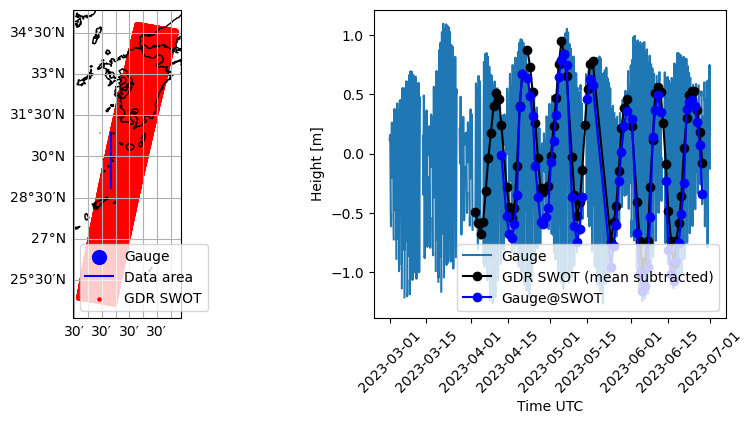

Gauge id [345]
RMSE: 19.6 cm
Corr: 0.987
STD: 10.0 cm
1


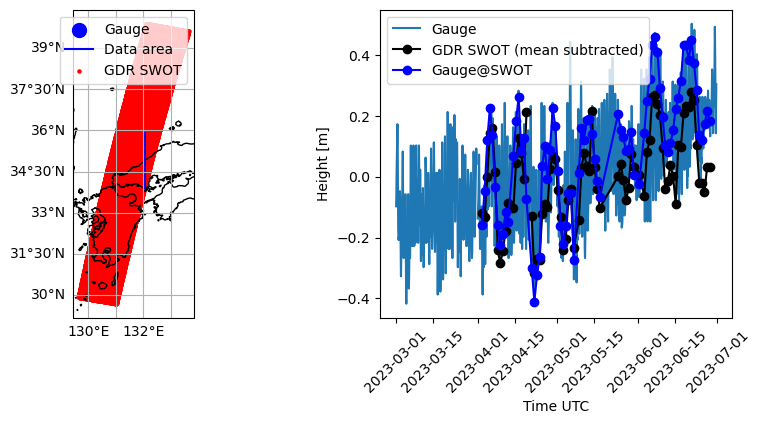

Gauge id [348]
RMSE: 13.5 cm
Corr: 0.872
STD: 9.97 cm
2


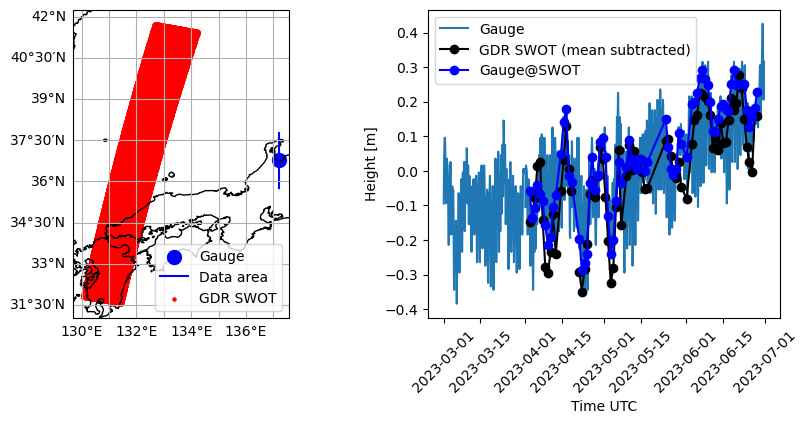

Gauge id [349]
RMSE: 7.09 cm
Corr: 0.941
STD: 5.17 cm
3


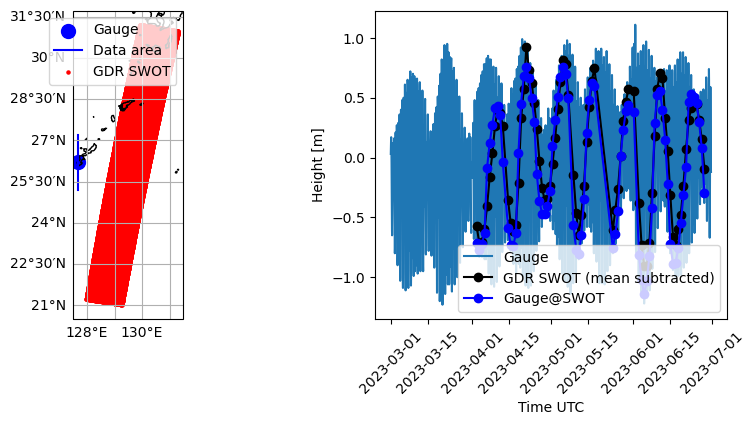

Gauge id [355]
RMSE: 18.1 cm
Corr: 0.959
STD: 16.0 cm
4


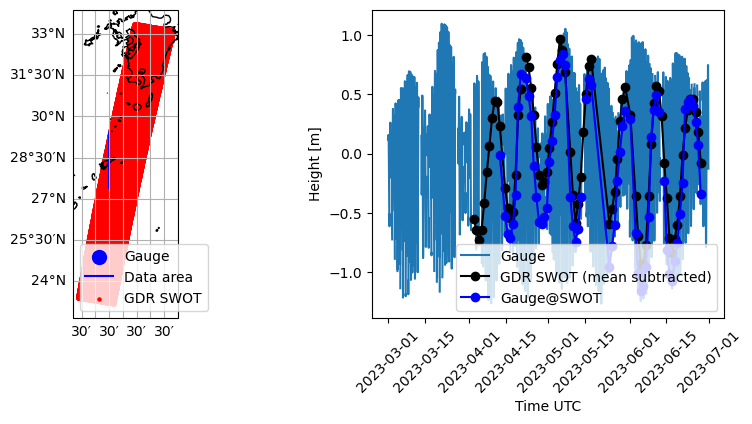

Gauge id [359]
RMSE: 22.3 cm
Corr: 0.978
STD: 13.1 cm
5


C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\453385970.py:82: RuntimeWarning: Mean of empty slice
  mean_diff = np.nanmean(heights) - np.nanmean(gauge["sea_level"][mask])


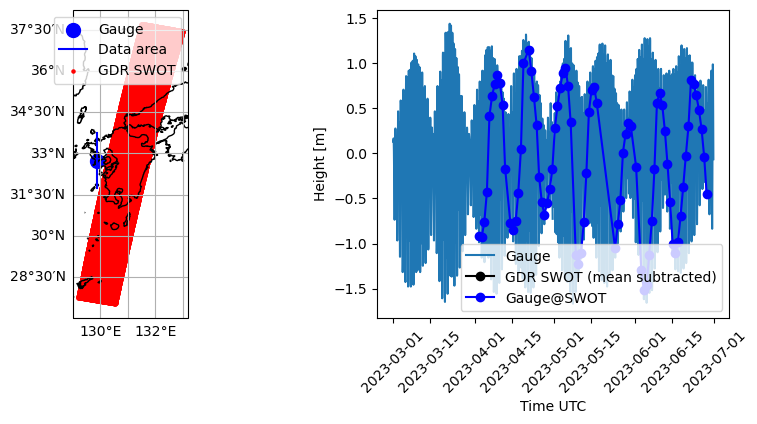

Gauge id [362]
RMSE: nan cm
Corr: nan
STD: nan cm
6


C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\453385970.py:111: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt( np.nanmean( (gauge_best_heights - (heights - mean_diff))**2 ) ) * 100
c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning

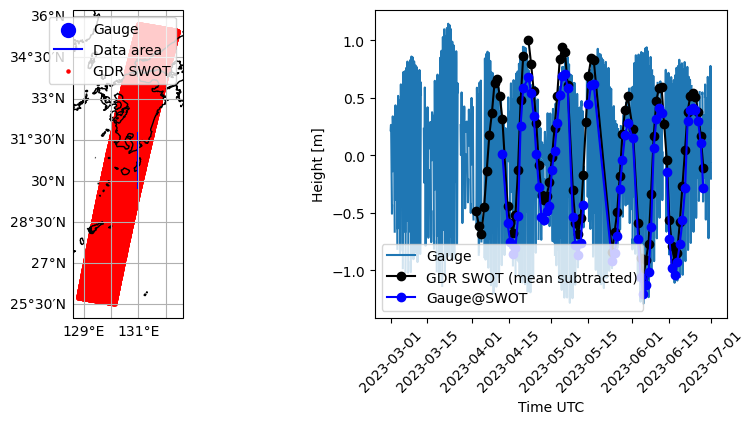

Gauge id [363]
RMSE: 20.6 cm
Corr: 0.992
STD: 7.38 cm
7
8


In [73]:
for i in range(9):
    print(i)
    p = 21
    if i >= 7:
        continue
    run_gauge_analysis(i, [p])

In [78]:
def run_gauge_analysis(gauge_ID, passes):

    # Variables
    REGION_OF_INTEREST = 1
    
    # Load gauges
    # =========================================================================================
    gauge_file = nc.Dataset(gauge_filenames[gauge_ID], "r")
    keys = gauge_file.variables.keys()

    gauge = {}
    for k in keys:
        gauge[k] = np.ma.getdata(gauge_file[k][:])

    gauge["sea_level"] = gauge["sea_level"][0]
    gauge["sea_level"] = gauge["sea_level"] / 1000 # To meters
    gauge["sea_level"][gauge["sea_level"]<-20] = np.nan

    # To datetime
    gauge["datetime"] = np.array([datetime.datetime(1800,1,1) + datetime.timedelta(days=t) for t in gauge["time"]])
    # =========================================================================================

    # Show location of tracks and gauges
    # =========================================================================================
    fig = plt.figure(figsize=(10,4))
    ax = fig.add_subplot(1, 2, 1, projection=ccrs.PlateCarree())
    ax.coastlines(resolution='10m')
    ax.scatter(gauge["lon"], gauge["lat"], 100, "b")
    ax.plot([gauge["lon"],gauge["lon"]], 
            [gauge["lat"]-REGION_OF_INTEREST,gauge["lat"]+REGION_OF_INTEREST], "b")

    for c in [550]:#gdr.keys():
        for p in passes:
            lat_mask = np.logical_and(nadir1[c][p]["latitude"]>gauge["lat"]-5,nadir1[c][p]["latitude"]<gauge["lat"]+5) 
            sc=ax.scatter(nadir1[c][p]["longitude"][lat_mask], nadir1[c][p]["latitude"][lat_mask], 5, "r")
    #ax.set_extent(EXTENT, crs=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    ax.legend(["Gauge", "Data area", "GDR SWOT"])
    # =========================================================================================

    # Create SSH
    # =========================================================================================
    
    # =========================================================================================

        
    ax2 = fig.add_subplot(1, 2, 2)
    mask = gauge["datetime"]>datetime.datetime(2023,3,1)
    zero_gauge_height = np.nanmean(gauge["sea_level"][mask])
    ax2.plot(gauge["datetime"][mask], gauge["sea_level"][mask]-zero_gauge_height)

    times = np.array([])
    times_seconds = np.array([])
    heights = np.array([])

    ENDTIME_SECONDS = (datetime.datetime(2023,12,1)-datetime.datetime(2000,1,1)).total_seconds()
    for c in nadir1.keys():
        for i, p in enumerate(passes):
            if (p in list(nadir1[c].keys())) == False:
                continue
            gdr_mask = np.logical_and(nadir1[c][p]["latitude"]>gauge["lat"]-REGION_OF_INTEREST, 
                                      nadir1[c][p]["latitude"]<gauge["lat"]+REGION_OF_INTEREST)
            t = nadir1[c][p]["time"]
            t[t>1e20] = np.nan
            karin_datetime = datetime.datetime(2000,1,1) + datetime.timedelta(seconds=np.nanmean(t))
            gdr_mask = np.logical_and(gdr_mask, karin_datetime < datetime.datetime(2023,7,1))
            gdr_mask = np.logical_and(gdr_mask, nadir1[c][p]["surface_classification_flag"]==0)

            time = np.nanmean(nadir1[c][p]["time"][gdr_mask])
            if ~np.isnan(time):
                time = datetime.datetime(2000,1,1) + datetime.timedelta(seconds=time)
            times = np.r_[times, time]
            corr = nadir1[c][p]["ocean_tide_fes"][gdr_mask] + nadir1[c][p]["dac"][gdr_mask] + nadir1[c][p]["internal_tide_hret"][gdr_mask]
            corr[corr>1e10] = np.nan
            #h = nadir1[c][p]["height_test"][gdr_mask]# + corr
            h = nadir1[c][p]["ssh_geoid"][gdr_mask] + corr
            height = np.nanmedian(h)
            heights = np.r_[heights, height]
            time_seconds = np.nanmean(nadir1[c][p]["time"][gdr_mask])
            times_seconds = np.r_[times_seconds, time_seconds]

    mean_diff = np.nanmean(heights) - np.nanmean(gauge["sea_level"][mask])
    ax2.plot(times, heights - mean_diff-zero_gauge_height, "o-k")

    # Match gauge and GDR
    # =========================================================================================
    gauge_times_seconds = np.array([(t-datetime.datetime(2000,1,1)).total_seconds() for t in gauge["datetime"]])
    # Remove nans
    heights = heights[~np.isnan(times_seconds)]
    times_seconds = times_seconds[~np.isnan(times_seconds)]

    argmins = np.nanargmin(abs(gauge_times_seconds[:,np.newaxis] - times_seconds[:,np.newaxis].T), axis=0)

    # Add margin of three closest encounters
    margin = 1
    gauge_best_times = np.mean( np.array([gauge_times_seconds[argmins+i] for i in range(-margin,margin+1)]) ,axis=0)
    gauge_best_heights = np.mean( np.array([gauge["sea_level"][argmins+i] for i in range(-margin,margin+1)]) ,axis=0)
    # =========================================================================================

    gauge_best_times_dates = np.array([(datetime.datetime(2000,1,1) + datetime.timedelta(seconds=t)) for t in gauge_best_times])
    ax2.plot(gauge_best_times_dates, gauge_best_heights-zero_gauge_height, "o-b")

    ax2.tick_params(axis='x', labelrotation = 45)
    ax2.set_xlabel("Time UTC")
    ax2.set_ylabel("Height [m]")
    ax2.legend(["Gauge", "GDR SWOT (mean subtracted)", "Gauge@SWOT"])
    plt.show()

    print("Gauge id",gauge["uhslc_id"])

    rmse = np.sqrt( np.nanmean( (gauge_best_heights - (heights - mean_diff))**2 ) ) * 100
    print("RMSE: {:.3} cm".format(rmse))

    mask = np.logical_and( (~np.isnan(gauge_best_heights)), (~np.isnan(heights)))
    corr = np.corrcoef(gauge_best_heights[mask], heights[mask] - mean_diff)[1,0]
    print("Corr: {:.3}".format(corr))

    std = np.nanstd(gauge_best_heights - (heights - mean_diff)) * 100
    print("STD: {:.3} cm".format(std))

0


C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\3241793668.py:71: RuntimeWarning: Mean of empty slice
  time = np.nanmean(nadir1[c][p]["time"][gdr_mask])
C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\3241793668.py:81: RuntimeWarning: Mean of empty slice
  time_seconds = np.nanmean(nadir1[c][p]["time"][gdr_mask])


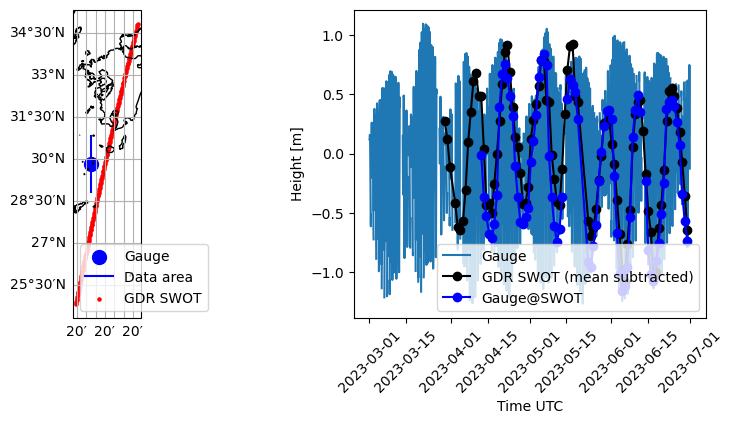

Gauge id [345]
RMSE: 22.0 cm
Corr: 0.957
STD: 16.7 cm
1


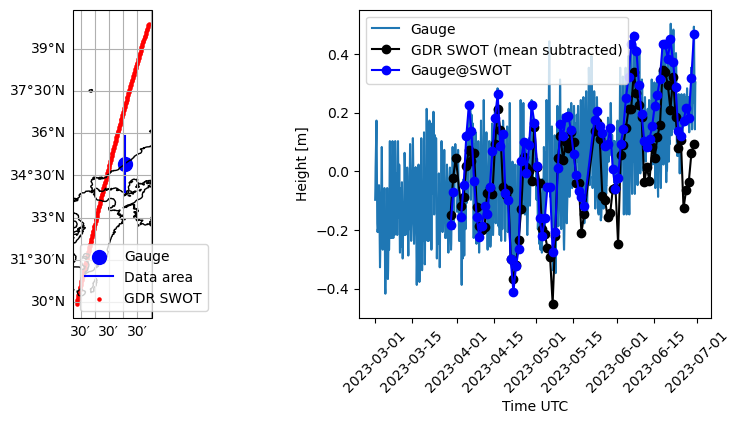

Gauge id [348]
RMSE: 13.0 cm
Corr: 0.86
STD: 10.1 cm
2


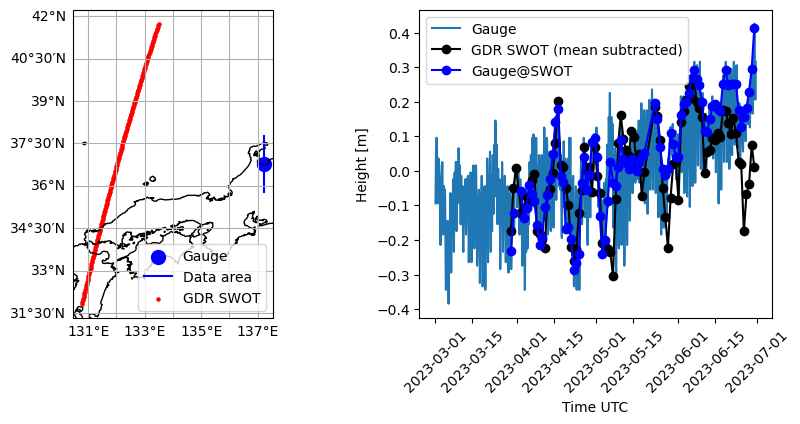

Gauge id [349]
RMSE: 11.1 cm
Corr: 0.768
STD: 10.0 cm
3


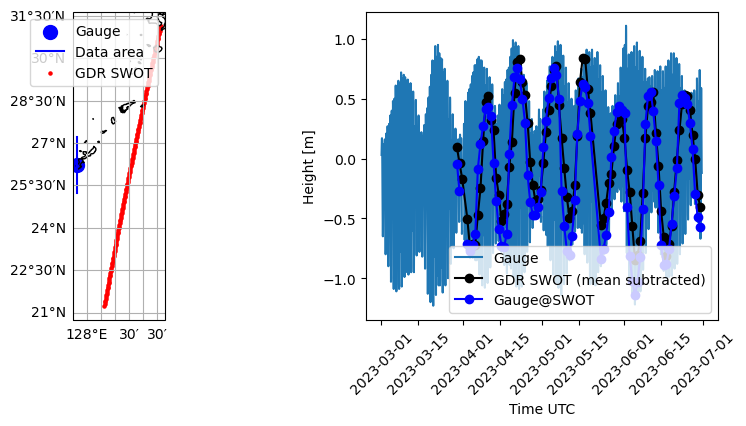

Gauge id [355]
RMSE: 21.3 cm
Corr: 0.94
STD: 18.8 cm
4


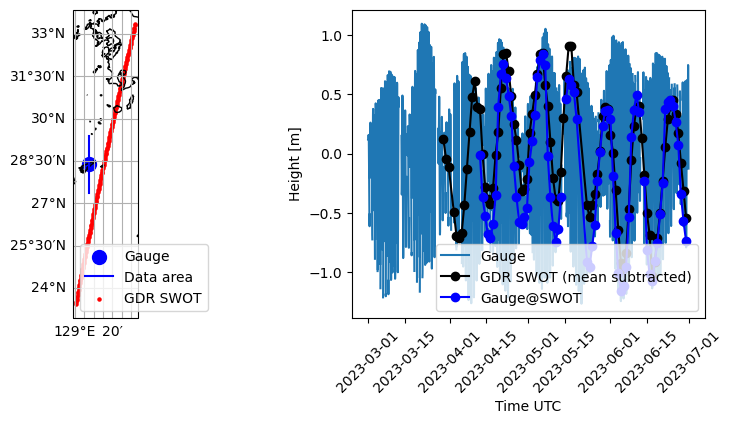

Gauge id [359]
RMSE: 24.7 cm
Corr: 0.948
STD: 18.5 cm
5


C:\Users\bjark\AppData\Local\Temp\ipykernel_16004\3241793668.py:79: RuntimeWarning: All-NaN slice encountered
  height = np.nanmedian(h)


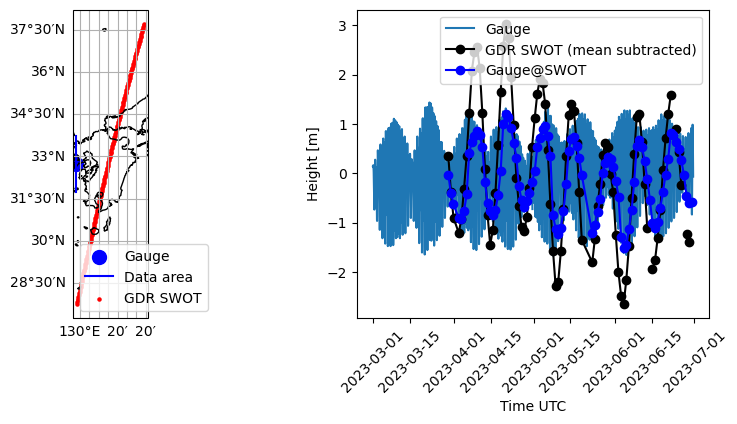

Gauge id [362]
RMSE: 80.2 cm
Corr: 0.895
STD: 79.4 cm
6


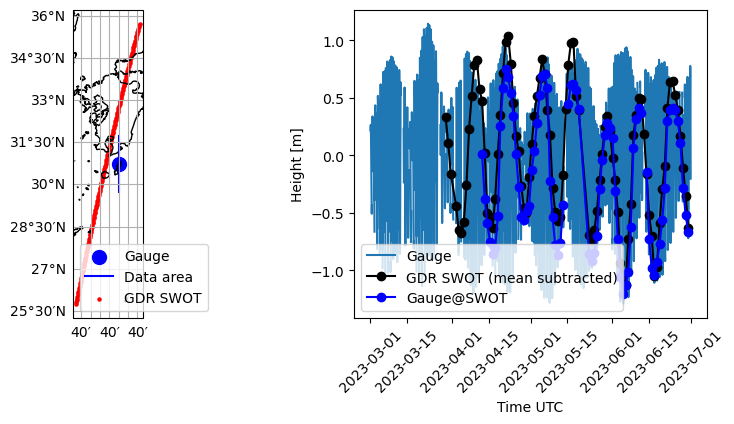

Gauge id [363]
RMSE: 22.0 cm
Corr: 0.97
STD: 13.8 cm
7
8


In [79]:
for i in range(9):
    print(i)
    p = 21
    if i >= 7:
        continue
    run_gauge_analysis(i, [p])

## Gravity Waves

In [92]:
filename = "D:\MasterThesis\PreBetaKaRIn_HighRate\SWOT_L2_HR_PIXC_500_004_262R_20230423T211511_20230423T211514_PIB0_01.nc"
#files_list = glob.glob("D:\MasterThesis\PreBetaKaRIn_HighRate\*_016_*R*.nc")
#print(len(files_list))
#filename = files_list[1]
print(filename)
high_rate = nc.Dataset(filename, "r")



D:\MasterThesis\PreBetaKaRIn_HighRate\SWOT_L2_HR_PIXC_500_004_262R_20230423T211511_20230423T211514_PIB0_01.nc


In [93]:
pixc = {}
pixc["lon"] = high_rate["pixel_cloud"]["longitude"][:]
pixc["lat"] = high_rate["pixel_cloud"]["latitude"][:]
pixc["h"] = high_rate["pixel_cloud"]["height"][:]

Lat mean -60.75473998468182
Lon mean -178.5322058654042
h mean -47.86043


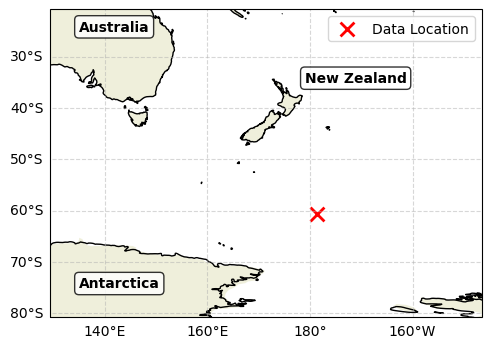

In [349]:
print("Lat mean",pixc["lat"].mean())
print("Lon mean",pixc["lon"].mean())
print("h mean",pixc["h"].mean())

fig = plt.figure(figsize=(10,4))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=-180.0))
ax.coastlines(resolution='50m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.xlocator = mticker.FixedLocator([i for i in range(120, 180, 20)]+[i for i in range(-180, -150, 20)])

lon = pixc["lon"].mean()
lat = pixc["lat"].mean()
ax.scatter(lon, lat, 100, "r", marker="x", linewidths=2, transform=ccrs.PlateCarree())

ax.set_extent(np.array([lon, lon, lat, lat])+np.array([-1.3,0.8,-0.5,1])*40, crs=ccrs.PlateCarree())

ax.annotate("Australia", (135, -25), (135, -25),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("New Zealand", (179, -35), (179, -35),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("Antarctica", (135, -75), (135, -75),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())

plt.legend(["Data Location"])
plt.show()

[  8.15402745 -17.5397989 ]
386
[60.918393   26.47479127]
1328
grid_size (386, 1328)
points_size (386, 1328, 2)


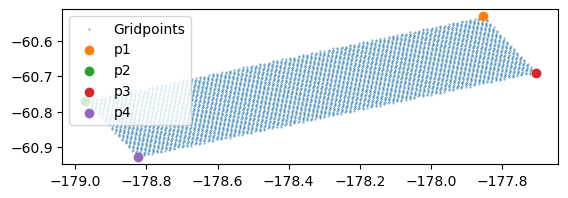

In [168]:
# Grid data

# radar dimension
p1 = np.array([high_rate.inner_first_longitude, high_rate.inner_first_latitude])
p2 = np.array([high_rate.outer_first_longitude, high_rate.outer_first_latitude])
p3 = np.array([high_rate.inner_last_longitude, high_rate.inner_last_latitude])
p4 = np.array([high_rate.outer_last_longitude, high_rate.outer_last_latitude])

v_range = p2 - p1
v_along = p3 - p1

# Determine stepsize
grid_pixelsize = 50 # m
along_diff = (p4 - p2) * np.array([40075*np.cos(np.deg2rad(p2[1])) / 360, 111.139])
print(along_diff)
along_stepsize = int( (np.sqrt(np.sum(along_diff**2))*1000) / grid_pixelsize )
print(along_stepsize)

range_diff = (p1 - p2) * np.array([40075*np.cos(np.deg2rad(p2[1])) / 360, 111.139])
print(range_diff)
range_stepsize = int( (np.sqrt(np.sum(range_diff**2))*1000) / grid_pixelsize)
print(range_stepsize)


# Create grid
s_range = np.linspace(0,1, range_stepsize)
s_along = np.linspace(0,1, along_stepsize)
grid_shape = (s_along.size, s_range.size)
print("grid_size", grid_shape)

p = p1 + [[s_ * v_range for s_ in s_range] + t_ * v_along for t_ in s_along]
print("points_size", p.shape)

p = p.reshape(-1,2)

# Show grid
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

ax.scatter(p[::100,0], p[::100,1], 0.1)

ax.scatter(p1[0], p1[1])
ax.scatter(p2[0], p2[1])
ax.scatter(p3[0], p3[1])
ax.scatter(p4[0], p4[1])

ax.set_aspect(1)
ax.legend(["Gridpoints","p1","p2","p3","p4"])

plt.show()


In [127]:
# Interpolate data onto grid
pixc["grid"] = {}

h_grid = scipy.interpolate.griddata(np.c_[pixc["lon"], pixc["lat"]], pixc["h"], np.c_[p[:,0], p[:,1]])
h_grid = h_grid.reshape(grid_shape)
pixc["grid"]["h"] = h_grid
print("h interpolated")

geoid = high_rate["pixel_cloud"]["geoid"][:]
geoid_grid = scipy.interpolate.griddata(np.c_[pixc["lon"], pixc["lat"]], geoid, np.c_[p[:,0], p[:,1]])
geoid_grid = geoid_grid.reshape(grid_shape)
pixc["grid"]["geoid"] = geoid_grid
print("geoid interpolated")

lat_grid = p[:,1].reshape(grid_shape)
lon_grid = p[:,0].reshape(grid_shape)
pixc["grid"]["lat"] = lat_grid
pixc["grid"]["lon"] = lon_grid
print("lat/lon interpolated")

h interpolated
geoid interpolated
lat/lon interpolated


In [128]:
cross_dist_cloud = high_rate["pixel_cloud"]["cross_track"][:]
cross_dist_min = cross_dist_cloud[0]
cross_dist_min

341.13638

In [129]:
AOI = [p[:,0].min(), p[:,0].max(), p[:,1].min(), p[:,1].max()]
print(AOI)

[-178.9730694067073, -177.7049251805571, -60.9278704134004, -60.53184207097235]


In [132]:
np.nanpercentile(pixc["grid"]["h"].reshape(-1) - pixc["grid"]["geoid"].reshape(-1), [5,95])

array([-1.712205  ,  0.06686805])

C:\Users\bjark\AppData\Local\Temp\ipykernel_17404\137612909.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


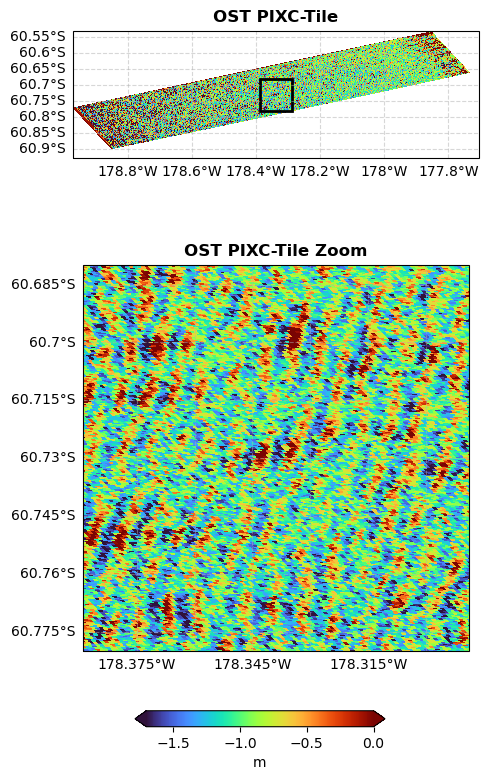

In [217]:
fig = plt.figure(figsize=(5,8))

zoom_size = 0.1 # deg
AOI2 = [pixc["grid"]["lon"].mean()-zoom_size/2, pixc["grid"]["lon"].mean()+zoom_size/2, 
        pixc["grid"]["lat"].mean()-zoom_size/2, pixc["grid"]["lat"].mean()+zoom_size/2]

ax = fig.add_subplot(2, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines(resolution='50m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False

h = pixc["grid"]["h"] - pixc["grid"]["geoid"]
sc=ax.pcolormesh(pixc["grid"]["lon"], pixc["grid"]["lat"], h, cmap="turbo", vmin=-1.7, vmax=0)

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI2[0], AOI2[2]), AOI2[1]-AOI2[0], AOI2[3]-AOI2[2], linewidth=2, edgecolor='k', facecolor='none'))

ax.set_title("OST PIXC-Tile", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*0.0, crs=ccrs.PlateCarree())

ax = fig.add_subplot(2, 1, 2, projection=ccrs.PlateCarree())
ax.coastlines(resolution='50m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False

h = pixc["grid"]["h"] - pixc["grid"]["geoid"]
sc=ax.pcolormesh(pixc["grid"]["lon"], pixc["grid"]["lat"], h, cmap="turbo", vmin=-1.7, vmax=0)

ax.set_title("OST PIXC-Tile Zoom", fontweight="bold")
ax.set_extent(np.array(AOI2), crs=ccrs.PlateCarree())


cax = fig.add_axes([0.28, -0.05, 0.5, 0.02])  # [left, bottom, width, height]
cb = plt.colorbar(sc, cax=cax, orientation="horizontal", shrink=0.4, pad=0.5, extend="both")
cb.set_label('m')

plt.tight_layout()
plt.show()

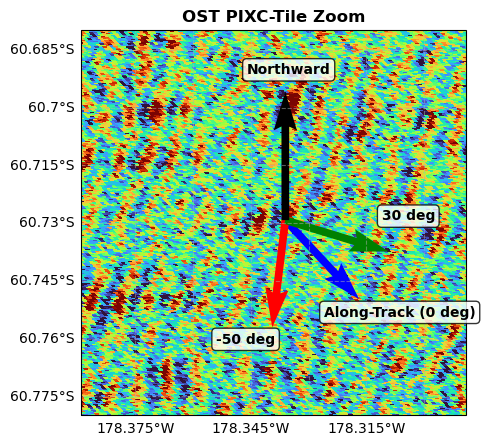

In [564]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.coastlines(resolution='50m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False

h = pixc["grid"]["h"] - pixc["grid"]["geoid"]
sc=ax.pcolormesh(pixc["grid"]["lon"], pixc["grid"]["lat"], h, cmap="turbo", vmin=-1.7, vmax=0)
#ax.scatter(pixc["grid"]["lon"][:,660], pixc["grid"]["lat"][:,660], 2,"k")
x = pixc["grid"]["lon"][:,660]
y = pixc["grid"]["lat"][:,660]
ax.quiver(x.mean(), y.mean(), np.mean(np.diff(x)), np.mean(np.diff(y)), scale=0.002, width=0.02, color="b")
ax.annotate("Along-Track (0 deg)", (x.mean(), y.mean()), (x.mean()+0.01, y.mean()-0.025),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

theta = np.radians(-50)
c, s = np.cos(theta), np.sin(theta)
R = np.array(((c,-s), (s, c)))
X = np.dot(R, np.array([np.mean(np.diff(x)), np.mean(np.diff(y))]) )
ax.quiver(x.mean(), y.mean(), X[0], X[1], scale=0.002, width=0.02, color="r")
ax.annotate("-50 deg", (x.mean(), y.mean()), (x.mean()-0.018, y.mean()-0.032),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

theta = np.radians(30)
c, s = np.cos(theta), np.sin(theta)
R = np.array(((c,-s), (s, c)))
X = np.dot(R, np.array([np.mean(np.diff(x)), np.mean(np.diff(y))]) )
ax.quiver(x.mean(), y.mean(), X[0], X[1], scale=0.002, width=0.02, color="g")
ax.annotate("30 deg", (x.mean(), y.mean()), (x.mean()+0.025, y.mean()+0.0),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

ax.quiver(x.mean(), y.mean(), 0, 0.001, scale=0.003, width=0.02, color="k")
ax.annotate("Northward", (x.mean(), y.mean()), (x.mean()-0.01, y.mean()+0.038),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
#ax.quiver(x.mean(), y.mean(), -0.001/np.sqrt(2), 0.001/np.sqrt(2), scale=0.003, width=0.02, color="r")
#ax.quiver(x.mean(), y.mean(), -0.001, 0, scale=0.003, width=0.02, color="g")

#fig.legend(["Along-Track Direction", "North"])


ax.set_title("OST PIXC-Tile Zoom", fontweight="bold")
ax.set_extent(np.array(AOI2), crs=ccrs.PlateCarree())


#cax = fig.add_axes([0.28, -0.05, 0.5, 0.02])  # [left, bottom, width, height]
#cb = plt.colorbar(sc, cax=cax, orientation="horizontal", shrink=0.4, pad=0.5, extend="both")
#cb.set_label('m')

#plt.tight_layout()
plt.show()

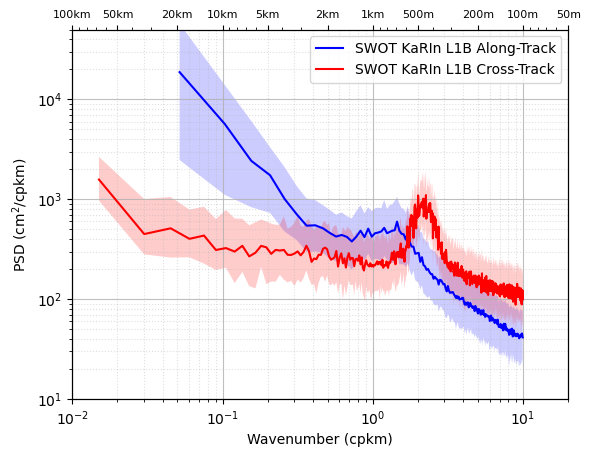

In [170]:


fig, ax = plt.subplots()

# =========================================================================================
# Karin SSH Interferogram
sampling_size = grid_pixelsize

# KaRIn PIXC along
ssh = []
for i in range(pixc["grid"]["h"].shape[1]):
    X = pixc["grid"]["h"][:,i] - pixc["grid"]["geoid"][:,i]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")
ax.loglog(k, psd, 'blue')
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")


# KaRIn PIXC cross
ssh = []
for j in range(pixc["grid"]["h"].shape[0]):
    X = pixc["grid"]["h"][j,:] - pixc["grid"]["geoid"][j,:]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")
ax.loglog(k, psd, 'red')
ax.fill_between(k, sd[0,:], sd[1,:], color='red',edgecolor=None, alpha=.2,label="_nolegend_")

# =========================================================================================



ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (cm$^2$/cpkm)")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([1e1, 5e4])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

#ax.set_title("Right Swath")
plt.legend(["SWOT KaRIn L1B Along-Track", "SWOT KaRIn L1B Cross-Track"])

# Create second axis
ax.set_xlim([100**(-1), 0.05**(-1)])
ax2 = ax.twiny()
ax2.set_xscale("log")
ax2.set_xlim([100, 0.05])
ticks_km = [100, 50, 20, 10, 5, 2, 1]
ticks_m = [0.5, 0.2, 0.1, 0.05]
ticks_loc = ticks_km + ticks_m
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_m = [str(int(t*1000))+"m" for t in ticks_m]
ticks_text = ticks_km + ticks_m

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)
plt.show()

In [176]:
# Directionality
f = scipy.interpolate.LinearNDInterpolator(np.c_[pixc["grid"]["lon"].reshape(-1), pixc["grid"]["lat"].reshape(-1)], 
                                           pixc["grid"]["h"].reshape(-1) - pixc["grid"]["geoid"].reshape(-1))

In [491]:
# Determine directionality
# Setup subsegment
px_mean = np.mean([p1[0],p2[0],p3[0],p4[0]])
py_mean = np.mean([p1[1],p2[1],p3[1],p4[1]])
p_mean = np.array([px_mean, py_mean])

dist = 5 / 111 # km
x_factor = 1
p1_seg = np.array([-dist*x_factor, dist])
p2_seg = np.array([dist*x_factor, dist])
p3_seg = np.array([dist*x_factor, -dist])
p4_seg = np.array([-dist*x_factor, -dist])

# Setup variables
h_rotations = []
angles = []

for theta_ in range(-180, 180, 10):
    #print("Angle", theta_)

    # Rotate points
    theta = theta_
    rotation = np.array([[np.cos(np.deg2rad(theta)), -np.sin(np.deg2rad(theta))],
                        [np.sin(np.deg2rad(theta)), np.cos(np.deg2rad(theta))]])

    lon_factor = (40075*np.cos(np.deg2rad(py_mean)) / 360) / 111.1

    p1_rot = ((p1_seg) / np.array([1, lon_factor])) @ rotation * np.array([1, lon_factor]) + p_mean
    p2_rot = ((p2_seg) / np.array([1, lon_factor])) @ rotation * np.array([1, lon_factor]) + p_mean
    p3_rot = ((p3_seg) / np.array([1, lon_factor])) @ rotation * np.array([1, lon_factor]) + p_mean
    p4_rot = ((p4_seg) / np.array([1, lon_factor])) @ rotation * np.array([1, lon_factor]) + p_mean

    # Determine parametrization
    v_range_rot = p2_rot - p1_rot
    v_along_rot = p3_rot - p1_rot

    # Determine stepsize
    along_diff_rot = (p4_rot - p2_rot) * np.array([40075*np.cos(np.deg2rad(p2_rot[1])) / 360, 111.139])
    along_stepsize_rot = int( (np.sqrt(np.sum(along_diff_rot**2))*1000) / grid_pixelsize )

    range_diff_rot = (p1_rot - p2_rot) * np.array([40075*np.cos(np.deg2rad(p2_rot[1])) / 360, 111.139])
    range_stepsize_rot = int( (np.sqrt(np.sum(range_diff_rot**2))*1000) / grid_pixelsize)

    # Create grid
    s_range_rot = np.linspace(0,1, range_stepsize_rot)
    s_along_rot = np.linspace(0,1, along_stepsize_rot)
    grid_shape_rot = (s_along_rot.size, s_range_rot.size)
    #print("grid_size", grid_shape_rot)

    p_rot = p1_rot + [[s_ * v_range_rot for s_ in s_range_rot] + t_ * v_along_rot for t_ in s_along_rot]
    #print("points_size", p_rot.shape)

    p_rot = p_rot.reshape(-1,2)

    # Interpolate
    h_rot = f(np.c_[p_rot[:,0], p_rot[:,1]])
    h_rot = h_rot.reshape(grid_shape_rot)

    # Add to list
    h_rotations.append(h_rot)
    angles.append(theta)

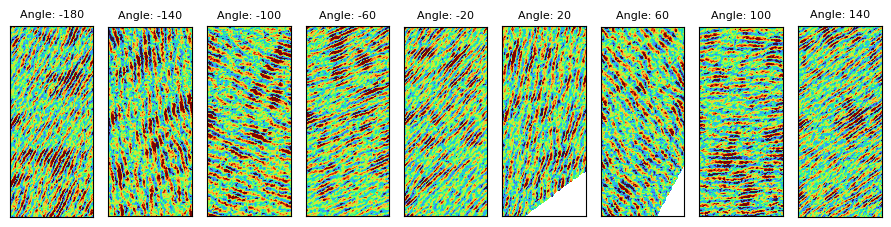

In [502]:
fig = plt.figure(figsize=(10,7))
vvals = np.nanpercentile(h_rotations[0], [5, 95])
for i, d in enumerate(range(0,len(angles),len(angles)//9)):
    
    ax = fig.add_subplot(1,10,i+1)
    sc=ax.imshow(h_rotations[d], cmap="turbo", vmin=vvals[0], vmax=vvals[1])
    ax.set_title("Angle: "+str(angles[d]), fontsize=8)
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

In [503]:

wavenumbers_list = []
psd_list = []
psd_sd_list = []
for i in range(len(h_rotations)):
    """
    # =========================================================================================
    # Karin SSH Interferogram
    sampling_size = grid_pixelsize

    # initialize psd and 
    output_unit = "cm"
    ssh_input = h_rotations[i][:,0]
    psd_, wavenumber = powerSpectralDensity(ssh_input, sampling_size, unit=output_unit, tapering=8, tapering_f = "boxcar")
    psd = np.zeros(psd_.size)
    wavenumbers = wavenumber

    for loc in range(0,h_rotations[i].shape[1], 2):
        h_ = h_rotations[i][:,loc]
        
        if (~np.isnan(h_)).sum() == 0:
            continue
        else:
            ssh_input = h_
            if (~np.isnan(ssh_input)).sum() == 0:
                continue
            else:
                psd_, wavenumber = powerSpectralDensity(ssh_input, sampling_size, unit=output_unit, tapering=8, tapering_f = "boxcar")

            psd_ = np.interp(wavenumbers, wavenumber, psd_)
            psd = np.c_[psd, psd_]
    psd = psd[:,1:] # remove the zeros

    wavenumbers = wavenumbers
    psd_mean = np.median(psd,axis=1)

    psd_list.append(psd_mean)
    wavenumbers_list.append(wavenumbers)
    """
    
    # KaRIn PIXC cross
    ssh = []
    for loc in range(0,h_rotations[i].shape[1], 1):
        ssh.append(h_rotations[i][:,loc])
        
    psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")

    psd_list.append(psd)
    wavenumbers_list.append(k)
    psd_sd_list.append(sd)

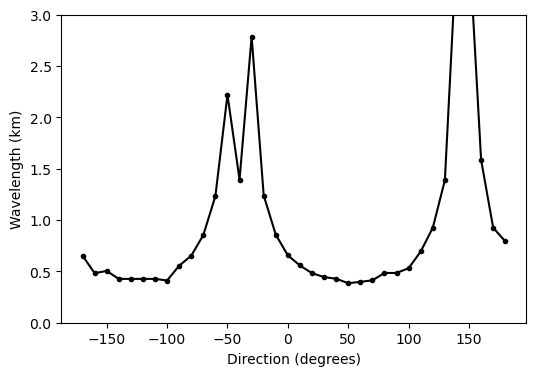

In [556]:
# Determine direction
args = []
wavenumber_peak = []
angles_peak = []
for i, a in enumerate(angles):
    psd = psd_list[i]
    arg = scipy.signal.find_peaks(psd, distance=1000)[0]
    args.append(arg)
    wavenumber_peak.append(wavenumbers_list[i][arg])
args = np.array(args)
wavenumber_peak = np.array(wavenumber_peak)

fig, ax = plt.subplots(figsize=(6,4))
ax.plot(-np.array(angles), wavenumber_peak**(-1), '.-k')
ax.set_ylim([0, 3])
ax.set_xlabel("Direction (degrees)")
ax.set_ylabel("Wavelength (km)")

plt.show()

In [557]:
argmin = np.argmin(wavenumber_peak[np.array(angles)<0]**(-1)*1000)
print("Smallest wavelength at: {} degrees".format(-angles[argmin]))
argmax = np.argmax(wavenumber_peak**(-1)*1000)
print("Largest wavelength at: {} degrees".format(-angles[argmax]))

Smallest wavelength at: 50 degrees
Largest wavelength at: 150 degrees


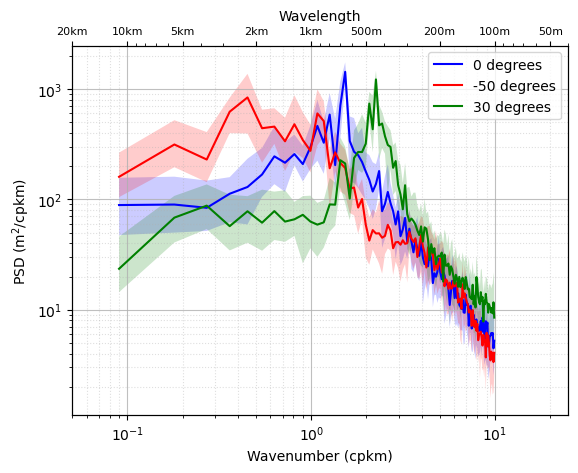

In [566]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.plot(k, psd_list[np.where(np.array(angles) == 0)[0][0]],"b")
ax.plot(k, psd_list[np.where(np.array(angles) == 50)[0][0]],"r")
ax.plot(k, psd_list[np.where(np.array(angles) == -30)[0][0]],"g")

ax.fill_between(k, psd_sd_list[np.where(np.array(angles) == 0)[0][0]][0,:], 
                psd_sd_list[np.where(np.array(angles) == 0)[0][0]][1,:], color='b',edgecolor=None, alpha=.2,label="_nolegend_")
ax.fill_between(k, psd_sd_list[np.where(np.array(angles) == 50)[0][0]][0,:], 
                psd_sd_list[np.where(np.array(angles) == 50)[0][0]][1,:], color='r',edgecolor=None, alpha=.2,label="_nolegend_")
ax.fill_between(k, psd_sd_list[np.where(np.array(angles) == -30)[0][0]][0,:], 
                psd_sd_list[np.where(np.array(angles) == -30)[0][0]][1,:], color='g',edgecolor=None, alpha=.2,label="_nolegend_")

ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("PSD (m$^2$/cpkm)")
#ax.set_yticks(np.logspace(-5,6,12))
#ax.set_ylim([1e-7, 1e0])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

#ax.set_title("Right Swath")
plt.legend(["0 degrees", "-50 degrees","30 degrees"])

# Create second axis
ax.set_xlim([20**(-1), 0.04**(-1)])
ax2 = ax.twiny()
ax2.set_xscale("log")
ax2.set_xlabel("Wavelength")
ax2.set_xlim([20, 0.04])
ticks_km = [20, 10, 5, 2, 1]
ticks_m = [0.5, 0.2, 0.1, 0.05]
ticks_loc = ticks_km + ticks_m
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_m = [str(int(t*1000))+"m" for t in ticks_m]
ticks_text = ticks_km + ticks_m

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)

plt.show()

In [603]:
h = pixc["grid"]["h"]-pixc["grid"]["geoid"]
h = h.reshape(-1)
h[abs(h)>5] = np.nan

print("SWH: {:.2f} m".format(np.nanstd(h)*4))

SWH: 2.31 m


In [616]:
path = "D:\MasterThesis\SIGDR\*"
nadir1 = loadNadir1Hz(path, cycles=[500], passes=[4])

mask = np.logical_and(nadir1[500][4]["latitude"]>-60.9, nadir1[500][4]["latitude"]<-60.5)
nadir1[500][4]["swh_ocean"][mask]

# Not the same!

array([4.337, 4.293, 4.051, 4.228, 4.146, 3.764, 4.017, 3.991])

C:\Users\bjark\AppData\Local\Temp\ipykernel_17404\1976879765.py:5: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  sc=ax.pcolormesh(np.deg2rad(angles_array+angles_array[0]/2),np.array(wavenumbers_list),np.log10(psd_list),edgecolors='face')#, vmin=1, vmax=1.8)


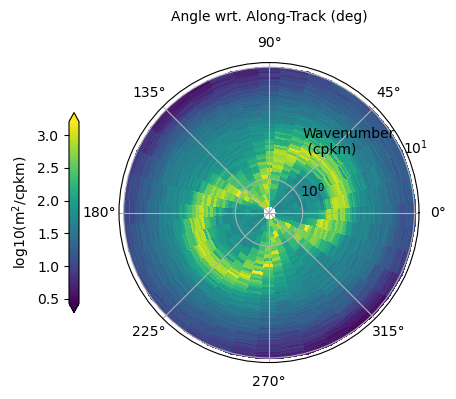

In [509]:
angles_array = np.repeat(np.array(angles)[:,None],axis=1,repeats=psd_list[0].size)

fig = plt.figure(figsize=[5,5])
ax = fig.add_axes([0,0,0.8,0.8],polar=True)
sc=ax.pcolormesh(np.deg2rad(angles_array+angles_array[0]/2),np.array(wavenumbers_list),np.log10(psd_list),edgecolors='face')#, vmin=1, vmax=1.8)
ax.set_rscale('log')
ax.set_rlim([0.5e0, 11])
#ax.set_thetamin(0)
#ax.set_thetamax(180)
ax.set_xlabel("Angle wrt. Along-Track (deg)", labelpad=30)
ax.xaxis.set_label_position('top')
ax.text(np.deg2rad(60), 2e0, "Wavenumber\n (cpkm)")
plt.colorbar(sc, label="log10(m$^2$/cpkm)", orientation="vertical", shrink=0.5, pad=0.1, extend="both",location='left')

plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_17404\2232952947.py:15: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  sc=ax.pcolormesh(np.deg2rad(angles_array+angles_array[0]/2),(np.array(wavenumbers_list))**(-1)*1000,np.log10(psd_list),edgecolors='face')#, vmin=1, vmax=1.8)


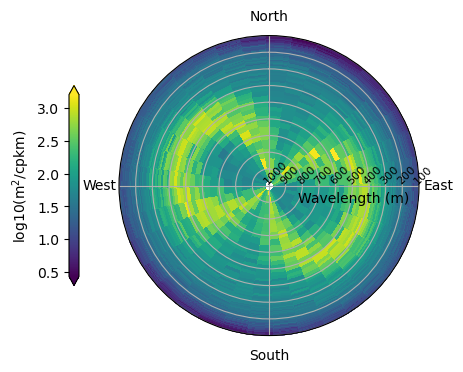

In [533]:
# Determine heading
d_lon = np.gradient(lon_grid)[0]
d_lat = np.gradient(lat_grid)[0]

easting = (d_lon)*40075*np.cos(np.deg2rad(lat_grid)) / 360
northing = (d_lat)*111

heading = np.rad2deg(np.arctan2( easting , northing ))
heading = np.nanmedian(heading)

angles_array = np.repeat(np.array(angles)[:,None],axis=1,repeats=psd_list[0].size) + (180 - heading)

fig = plt.figure(figsize=[5,5])
ax = fig.add_axes([0,0,0.8,0.8],polar=True)
sc=ax.pcolormesh(np.deg2rad(angles_array+angles_array[0]/2),(np.array(wavenumbers_list))**(-1)*1000,np.log10(psd_list),edgecolors='face')#, vmin=1, vmax=1.8)
#ax.set_rscale('log')
#ax.set_rlim([2, 7])
ax.set_rlim([1000, 100])
ax.tick_params(axis='y', which='major', labelsize=8, rotation=45)
ax.set_thetamin(0)
ax.set_thetamax(360)
ax.set_theta_zero_location("N")
ax.set_rlabel_position(270)
#
ax.set_xticks([0, np.deg2rad(90), np.deg2rad(180), np.deg2rad(270)])
ax.set_xticklabels(["North", "West", "South", "East"])
#ax.set_xlabel("Angle wrt. Along-Track (deg)", labelpad=-30)
ax.xaxis.set_label_position('top')
ax.text(np.deg2rad(240), 800, "Wavelength (m)")
plt.colorbar(sc, label="log10(m$^2$/cpkm)", orientation="vertical", shrink=0.5, pad=0.1, extend="both",location='left')

plt.show()